<a href="https://colab.research.google.com/github/Vaishnavi-Kahar/Stock-Market-Prediction/blob/main/timeSeriesPrediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Time series preiction of Indian stock market data

In [48]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [49]:
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [50]:
##importing libraries:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from datetime import datetime
import os
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import LocalOutlierFactor
import webbrowser
from statsmodels.tsa.arima.model import ARIMA
import pmdarima as pm
from prophet import Prophet
import sklearn.metrics as metrics
from pmdarima import auto_arima,arima
from plotly.subplots import make_subplots
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import SimpleRNN,LSTM

In [51]:
df = pd.read_csv('NIFTY50_all.csv')

In [52]:
df.head()

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2007-11-27,MUNDRAPORT,EQ,440.00,770.00,1050.00,770.0,959.0,962.90,984.72,27294366,2.687719e+15,NaN,9859619.0,0.3612
1,2007-11-28,MUNDRAPORT,EQ,962.90,984.00,990.00,874.0,885.0,893.90,941.38,4581338,4.312765e+14,NaN,1453278.0,0.3172
2,2007-11-29,MUNDRAPORT,EQ,893.90,909.00,914.75,841.0,887.0,884.20,888.09,5124121,4.550658e+14,NaN,1069678.0,0.2088
3,2007-11-30,MUNDRAPORT,EQ,884.20,890.00,958.00,890.0,929.0,921.55,929.17,4609762,4.283257e+14,NaN,1260913.0,0.2735
4,2007-12-03,MUNDRAPORT,EQ,921.55,939.75,995.00,922.0,980.0,969.30,965.65,2977470,2.875200e+14,NaN,816123.0,0.2741


In [53]:
#Convert Date to datetime
df['Date'] = pd.to_datetime(df['Date'] )

In [54]:
#Checking the datatypes
df.dtypes

Date                  datetime64[ns]
Symbol                        object
Series                        object
Prev Close                   float64
Open                         float64
High                         float64
Low                          float64
Last                         float64
Close                        float64
VWAP                         float64
Volume                         int64
Turnover                     float64
Trades                       float64
Deliverable Volume           float64
%Deliverble                  float64
dtype: object

In [55]:
#Setting Date as the index
df.set_index('Date',inplace=True)

In [56]:
df.head(2)

,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
Date,,,,,,,,,,,,,,
2007-11-27,MUNDRAPORT,EQ,440.0,770.0,1050.0,770.0,959.0,962.9,984.72,27294366,2.687719e+15,NaN,9859619.0,0.3612
2007-11-28,MUNDRAPORT,EQ,962.9,984.0,990.0,874.0,885.0,893.9,941.38,4581338,4.312765e+14,NaN,1453278.0,0.3172


In [57]:
df.loc[df['Symbol'] == 'MUNDRAPORT','Symbol'] = 'ADANIPORTS'
df.loc[df['Symbol'] == 'BAJAUTOFIN','Symbol'] = 'BAJFINANCE'
df.loc[df['Symbol'] == 'HINDALC0','Symbol'] = 'HINDALCO'
df.loc[df['Symbol'] == 'KOTAKMAH','Symbol'] = 'KOTAKBANK'
df.loc[df['Symbol'] == 'UTIBANK','Symbol'] = 'AXISBANK'
df.loc[df['Symbol'] == 'ZEETELE','Symbol'] = 'ZEEL'
df.loc[df['Symbol'] == 'INFOSYSTCH','Symbol'] = 'INFY'
df.loc[df['Symbol'] == 'BHARTI','Symbol'] = 'BHARTIARTL'
df.loc[df['Symbol'] == 'SESAGOA','Symbol'] = 'VEDL'
df.loc[df['Symbol'] == 'HEROHONDA','Symbol'] = 'HEROMOTOCO'
df.loc[df['Symbol'] == 'TELCO','Symbol'] = 'TATAMOTORS'
df.loc[df['Symbol'] == 'TISCO','Symbol'] = 'TATASTEEL'
df.loc[df['Symbol'] == 'HINDLEVER','Symbol'] = 'HINDUNILVR'
df.loc[df['Symbol'] == 'JSWSTL','Symbol'] = 'JSWSTEEL'
df.loc[df['Symbol'] == 'SSLT','Symbol'] = 'VEDL'

In [58]:
len(df['Symbol'].unique())

50

In [59]:
df_2 = pd.DataFrame()
for companies in (df['Symbol'].unique()):
    df_2.loc[:,companies] = df[df['Symbol'] == companies]['Close']

In [60]:
df_2.head()

,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,CIPLA,...,TATASTEEL,TCS,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL
Date,,,,,,,,,,,,,,,,,,,,,
2007-11-27,962.90,998.15,932.10,NaN,NaN,317.30,915.85,406.90,1516.45,183.60,...,848.90,995.95,1040.00,1530.50,1000.65,337.10,NaN,3386.95,457.80,299.60
2007-11-28,893.90,1006.45,905.70,NaN,NaN,321.55,910.05,384.50,1482.90,182.85,...,816.60,976.50,1035.45,1471.35,989.10,334.80,NaN,3332.45,449.75,292.75
2007-11-29,884.20,998.10,918.85,NaN,NaN,322.75,914.75,382.30,1493.35,182.00,...,798.25,966.05,986.15,1463.40,976.85,334.10,NaN,3260.70,448.10,281.25
2007-11-30,921.55,990.00,930.65,NaN,NaN,330.35,939.50,386.35,1492.35,183.10,...,825.90,1012.20,1026.70,1534.25,984.25,342.95,NaN,3450.70,460.65,287.90
2007-12-03,969.30,986.60,942.35,NaN,NaN,332.90,923.95,402.85,1468.10,185.25,...,842.20,1049.90,1058.15,1548.65,999.15,344.20,NaN,3500.65,492.10,303.80


In [61]:
companies=df_2.columns

In [62]:
#checking for null values
df_2.isnull().sum()

ADANIPORTS       0
ASIANPAINT       0
AXISBANK         0
BAJAJ-AUTO     120
BAJAJFINSV     121
BAJFINANCE       1
BHARTIARTL       0
BPCL             0
BRITANNIA        1
CIPLA            0
COALINDIA      724
DRREDDY          0
EICHERMOT        0
GAIL             0
GRASIM           0
HCLTECH          0
HDFC             0
HDFCBANK         0
HEROMOTOCO       0
HINDALCO         0
HINDUNILVR       0
ICICIBANK        0
INDUSINDBK       0
INFY             0
IOC              0
ITC              0
JSWSTEEL         0
KOTAKBANK        0
LT               0
M&M              0
MARUTI           0
NESTLEIND      516
NTPC             0
ONGC             0
POWERGRID        0
RELIANCE         0
SBIN             0
SHREECEM         0
SUNPHARMA        0
TATAMOTORS       0
TATASTEEL        0
TCS              0
TECHM            0
TITAN            0
ULTRACEMCO       0
UNIPHOS       1858
UPL           1464
VEDL             0
WIPRO            0
ZEEL             0
dtype: int64

In [63]:
com = ['BAJAJ-AUTO','BAJAJFINSV','COALINDIA','NESTLEIND','BAJFINANCE','BRITANNIA']
# Backward filling the missing values
for a in com:
  df_2[a] = df_2[a].fillna(method='bfill')

In [64]:
# Forward filling the missing values
df_2['NTPC'] = df_2['NTPC'].fillna(method='ffill')
df_2['UNIPHOS'] = df_2['UNIPHOS'].fillna(method='ffill')


In [66]:
df_2['UPL'] = df_2['UPL'].fillna(method='bfill')

In [68]:
#checking for null values
df_2.isnull().sum()

ADANIPORTS    0
ASIANPAINT    0
AXISBANK      0
BAJAJ-AUTO    0
BAJAJFINSV    0
BAJFINANCE    0
BHARTIARTL    0
BPCL          0
BRITANNIA     0
CIPLA         0
COALINDIA     0
DRREDDY       0
EICHERMOT     0
GAIL          0
GRASIM        0
HCLTECH       0
HDFC          0
HDFCBANK      0
HEROMOTOCO    0
HINDALCO      0
HINDUNILVR    0
ICICIBANK     0
INDUSINDBK    0
INFY          0
IOC           0
ITC           0
JSWSTEEL      0
KOTAKBANK     0
LT            0
M&M           0
MARUTI        0
NESTLEIND     0
NTPC          0
ONGC          0
POWERGRID     0
RELIANCE      0
SBIN          0
SHREECEM      0
SUNPHARMA     0
TATAMOTORS    0
TATASTEEL     0
TCS           0
TECHM         0
TITAN         0
ULTRACEMCO    0
UNIPHOS       0
UPL           0
VEDL          0
WIPRO         0
ZEEL          0
dtype: int64

In [69]:
# Resampling the time series data based on months
# we apply it on stock close price
# 'M' indicates month
monthly_resampled_data = df_2.resample('M').mean()
  
# the above command will find the mean closing price
# of each month for a duration of 12 months.
monthly_resampled_data.head(2)

,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,CIPLA,...,TATASTEEL,TCS,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL
Date,,,,,,,,,,,,,,,,,,,,,
2007-11-30,915.637500,998.175000,921.825000,604.75,509.1,322.987500,920.037500,390.012500,1496.262500,182.887500,...,822.412500,987.675000,1022.075000,1499.875000,987.712500,337.237500,153.8,3357.700000,454.075000,290.375000
2007-12-31,1105.776316,1020.505263,953.365789,604.75,509.1,367.136842,956.321053,437.876316,1482.171053,204.294737,...,862.110526,1051.802632,1129.710526,1512.494737,988.634211,349.576316,153.8,3665.081579,506.431579,308.852632


In [70]:
df_4 = monthly_resampled_data.reset_index()

In [71]:
df_4.head(3)

,Date,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,...,TATASTEEL,TCS,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL
0,2007-11-30,915.637500,998.175000,921.825000,604.75,509.1,322.987500,920.037500,390.012500,1496.262500,...,822.412500,987.675000,1022.075000,1499.875000,987.712500,337.237500,153.8,3357.700000,454.075000,290.375000
1,2007-12-31,1105.776316,1020.505263,953.365789,604.75,509.1,367.136842,956.321053,437.876316,1482.171053,...,862.110526,1051.802632,1129.710526,1512.494737,988.634211,349.576316,153.8,3665.081579,506.431579,308.852632
2,2008-01-31,1021.645652,1117.910870,1094.467391,604.75,509.1,434.319565,902.002174,443.797826,1508.534783,...,808.417391,931.245652,920.673913,1403.495652,902.836957,368.506522,153.8,3346.567391,459.002174,290.519565


<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




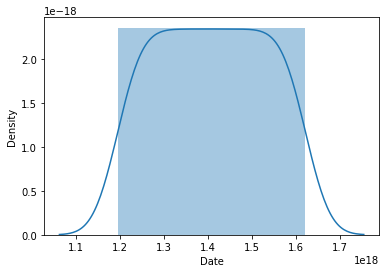

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




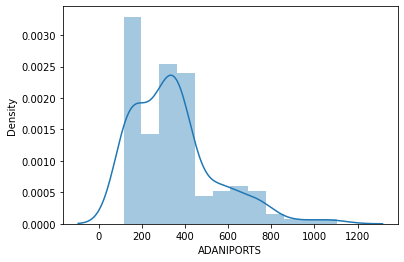

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




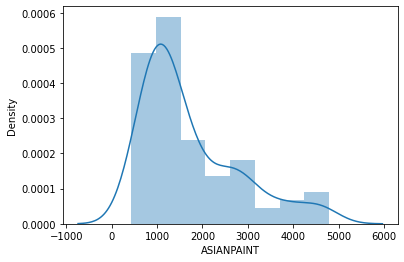

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




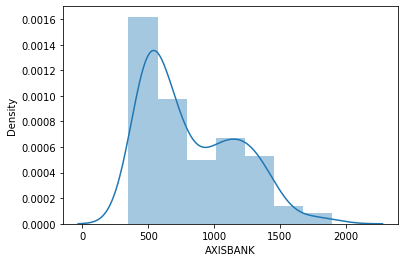

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




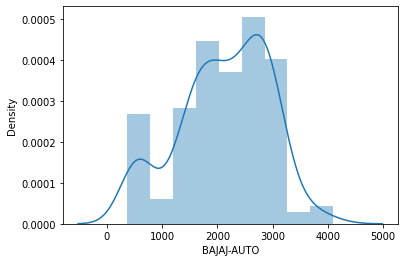

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




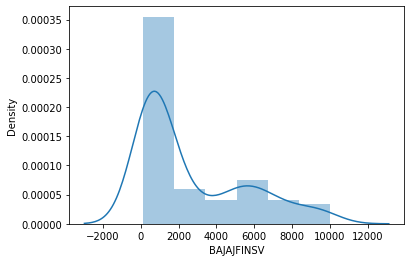

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




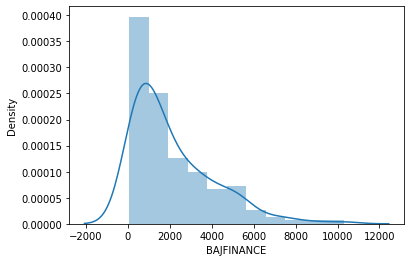

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




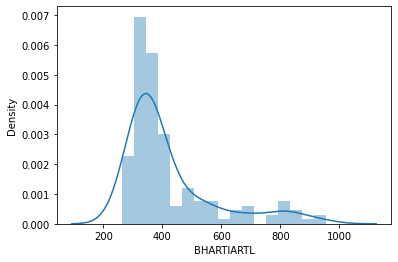

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




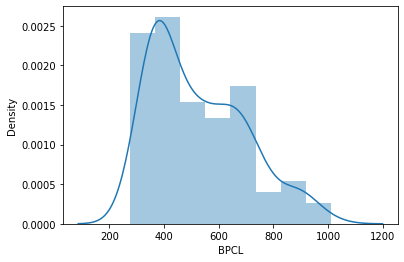

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




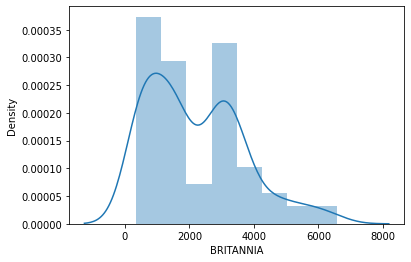

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




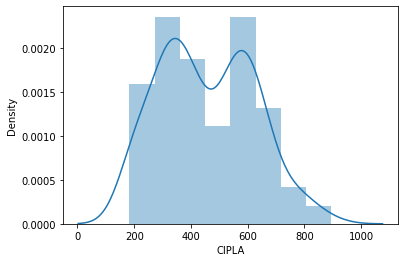

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




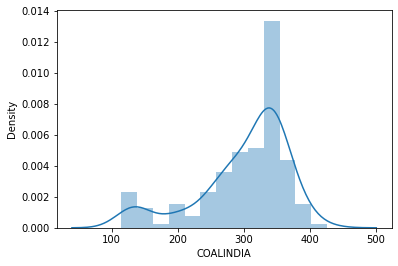

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




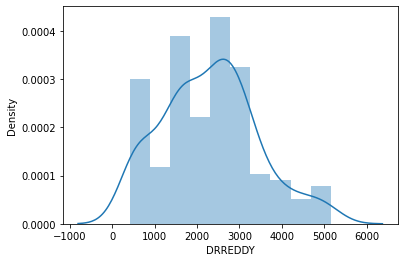

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




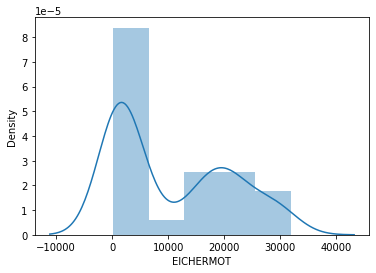

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




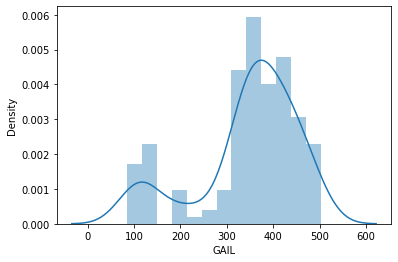

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




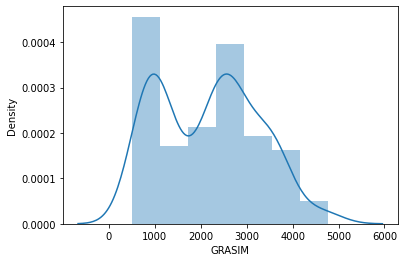

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




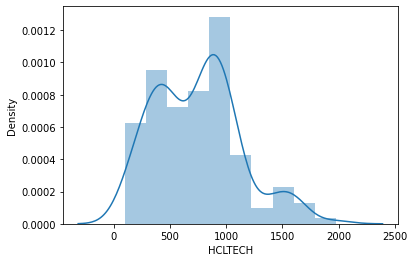

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




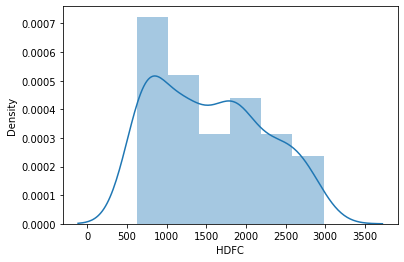

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




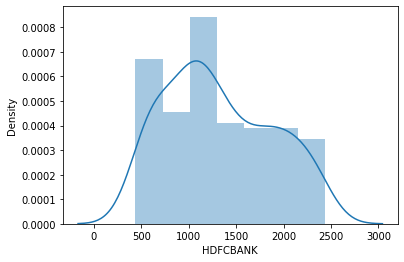

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




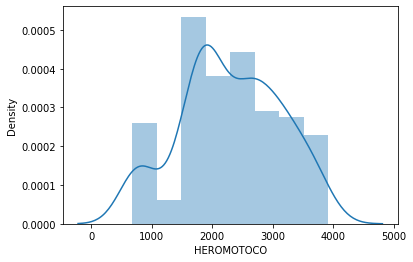

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




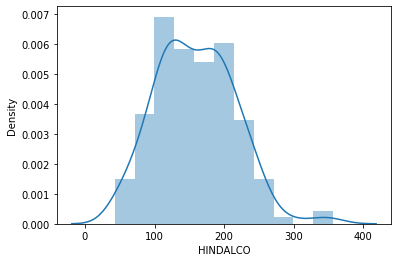

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




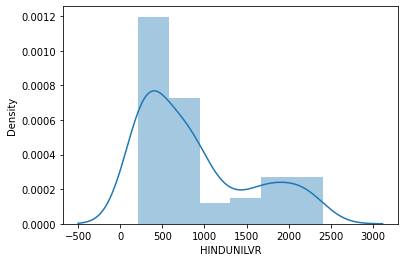

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




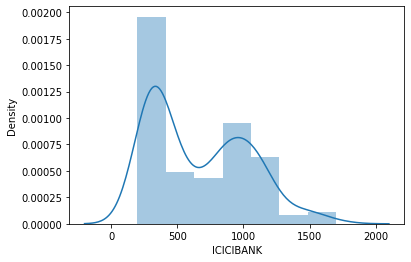

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




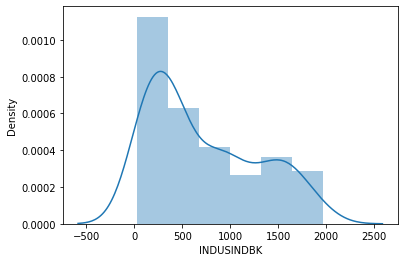

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




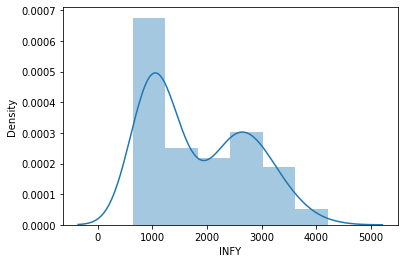

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




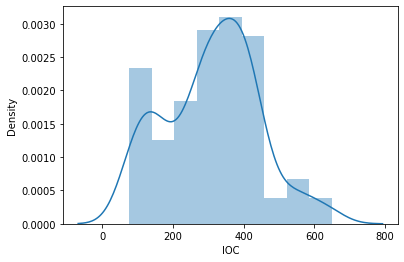

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




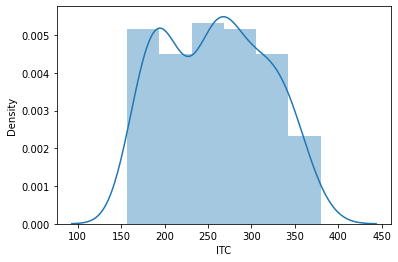

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




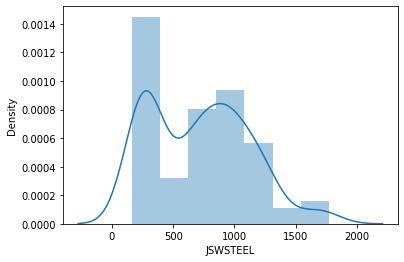

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




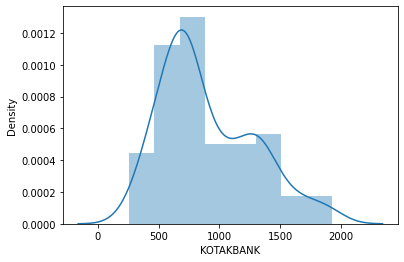

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




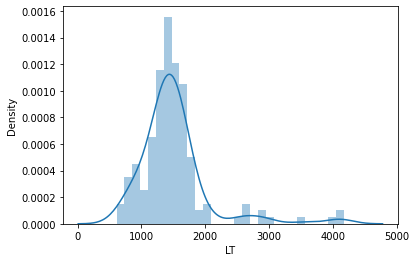

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




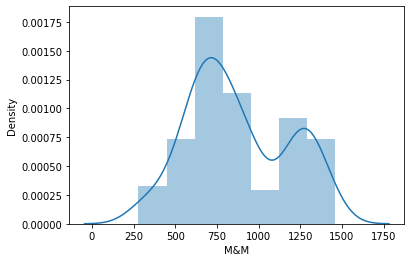

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




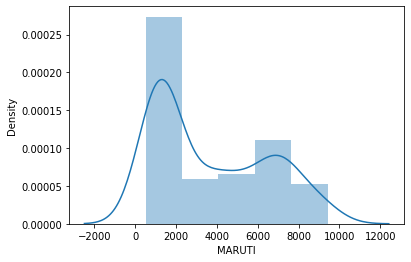

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




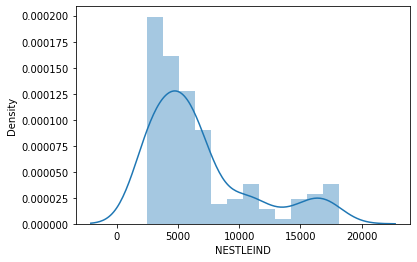

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




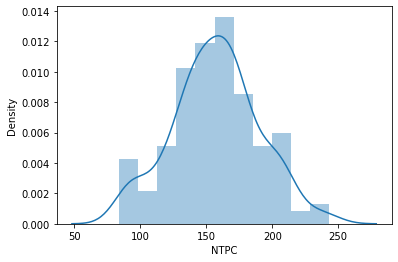

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




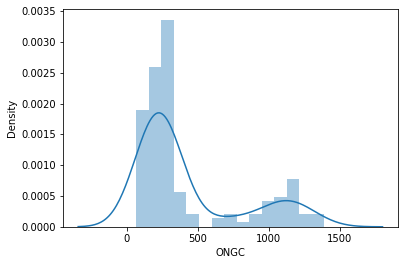

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




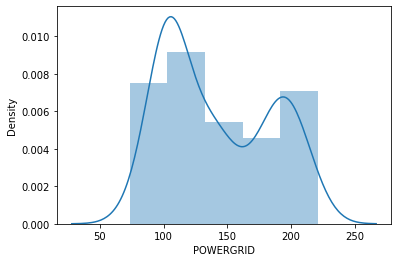

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




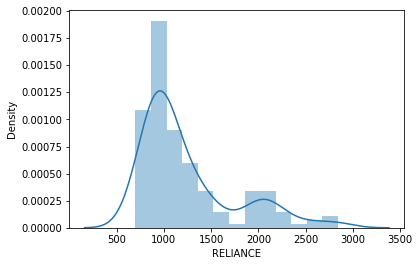

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




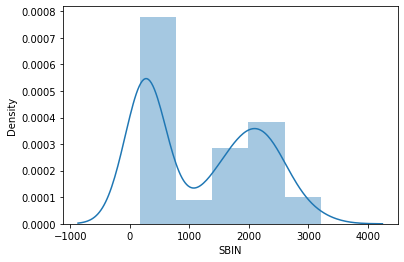

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




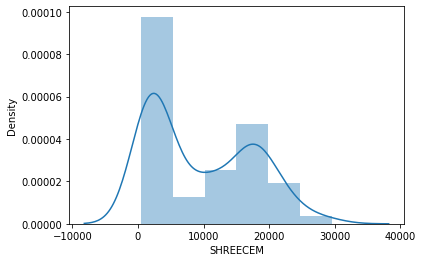

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




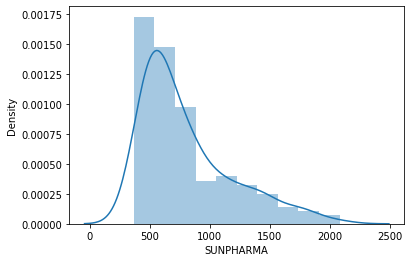

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




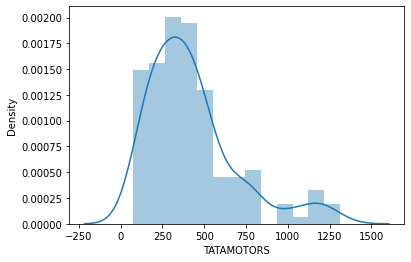

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




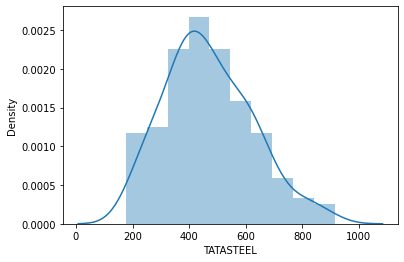

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




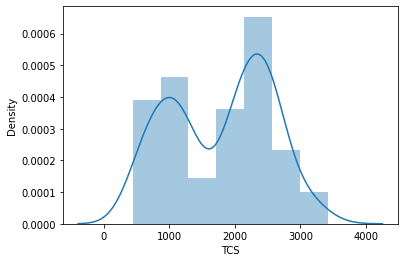

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




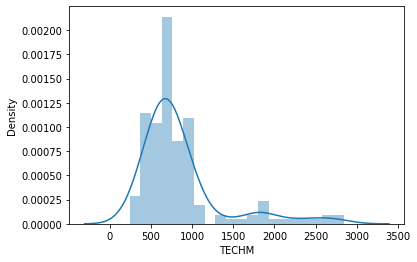

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




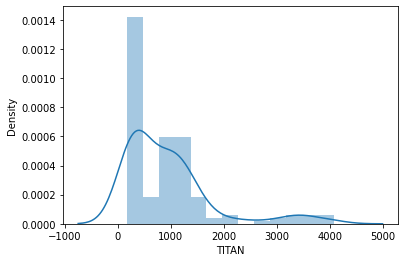

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




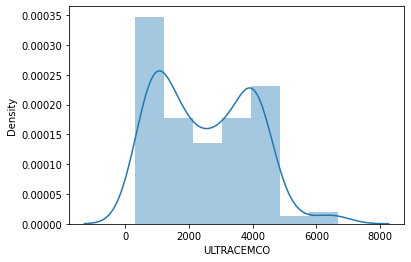

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




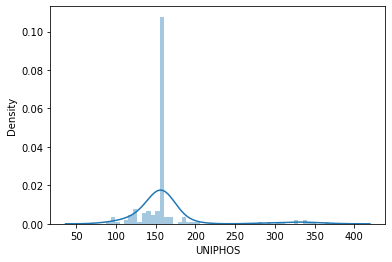

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




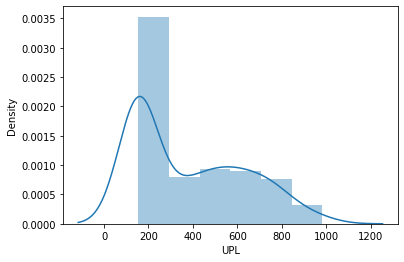

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




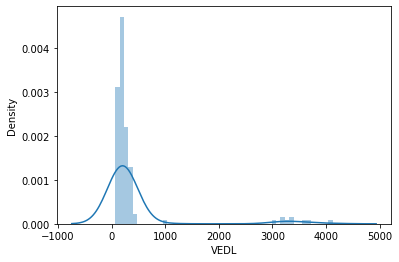

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




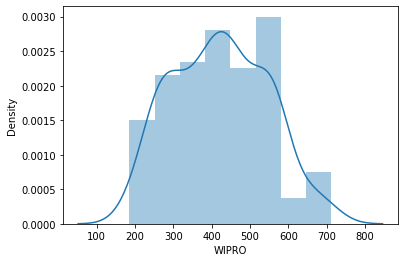

<ipython-input-72-72af226a0b86>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




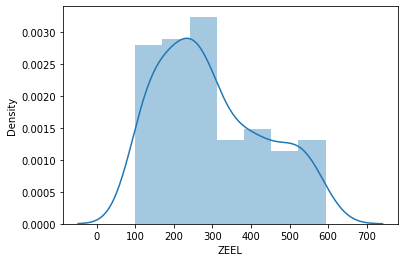

In [72]:
for i in df_4.columns:
    sns.distplot(df_4[i])
    plt.show()

In [73]:
## Stastical Graphs of every Company's Close
for i in df_4.columns: 
    fig = px.line(df_4, x='Date', y=i, title=i+' stocks')

    fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="3y", step="year", stepmode="backward"),
            dict(count=3, label="5y", step="year", stepmode="backward"),
            dict(step="all")
            ])
        ) 
    )
    fig.show()

In [74]:
df_4.head(2)

,Date,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,...,TATASTEEL,TCS,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL
0,2007-11-30,915.637500,998.175000,921.825000,604.75,509.1,322.987500,920.037500,390.012500,1496.262500,...,822.412500,987.675000,1022.075000,1499.875000,987.712500,337.237500,153.8,3357.700000,454.075000,290.375000
1,2007-12-31,1105.776316,1020.505263,953.365789,604.75,509.1,367.136842,956.321053,437.876316,1482.171053,...,862.110526,1051.802632,1129.710526,1512.494737,988.634211,349.576316,153.8,3665.081579,506.431579,308.852632


In [75]:
companies

Index(['ADANIPORTS', 'ASIANPAINT', 'AXISBANK', 'BAJAJ-AUTO', 'BAJAJFINSV',
       'BAJFINANCE', 'BHARTIARTL', 'BPCL', 'BRITANNIA', 'CIPLA', 'COALINDIA',
       'DRREDDY', 'EICHERMOT', 'GAIL', 'GRASIM', 'HCLTECH', 'HDFC', 'HDFCBANK',
       'HEROMOTOCO', 'HINDALCO', 'HINDUNILVR', 'ICICIBANK', 'INDUSINDBK',
       'INFY', 'IOC', 'ITC', 'JSWSTEEL', 'KOTAKBANK', 'LT', 'M&M', 'MARUTI',
       'NESTLEIND', 'NTPC', 'ONGC', 'POWERGRID', 'RELIANCE', 'SBIN',
       'SHREECEM', 'SUNPHARMA', 'TATAMOTORS', 'TATASTEEL', 'TCS', 'TECHM',
       'TITAN', 'ULTRACEMCO', 'UNIPHOS', 'UPL', 'VEDL', 'WIPRO', 'ZEEL'],
      dtype='object')

In [76]:
df_4['Month'] = df_4['Date'].apply(lambda x: str(x).split('-')[1])
df_4['Year'] = df_4['Date'].apply(lambda x: str(x).split('-')[0])

<ipython-input-77-6edf64bce38f>:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



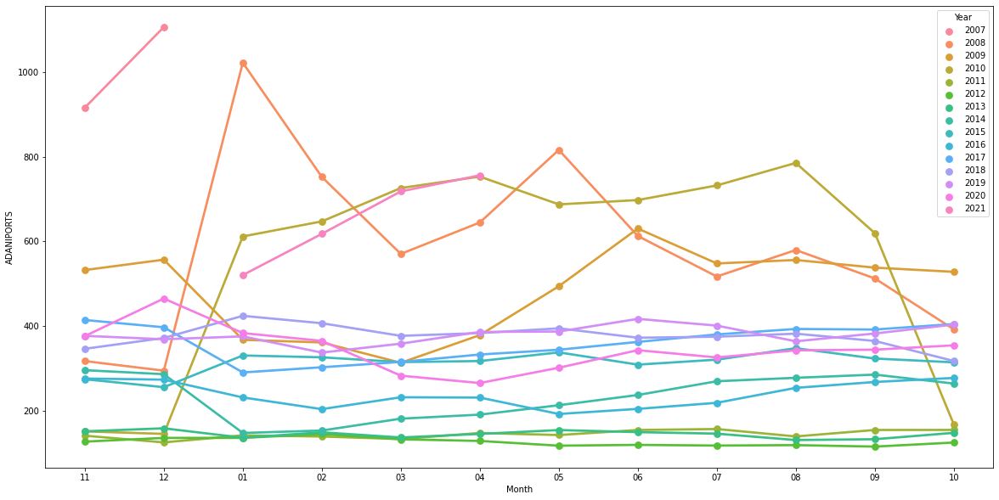

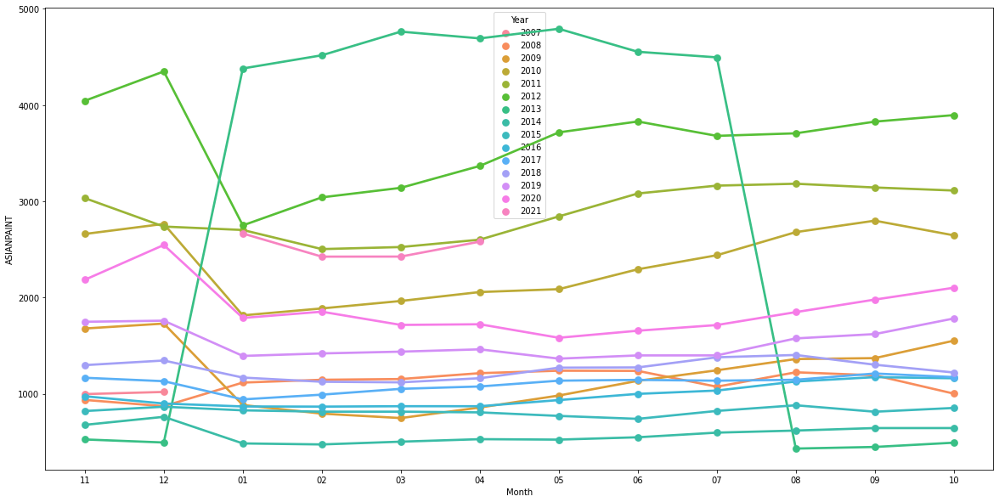

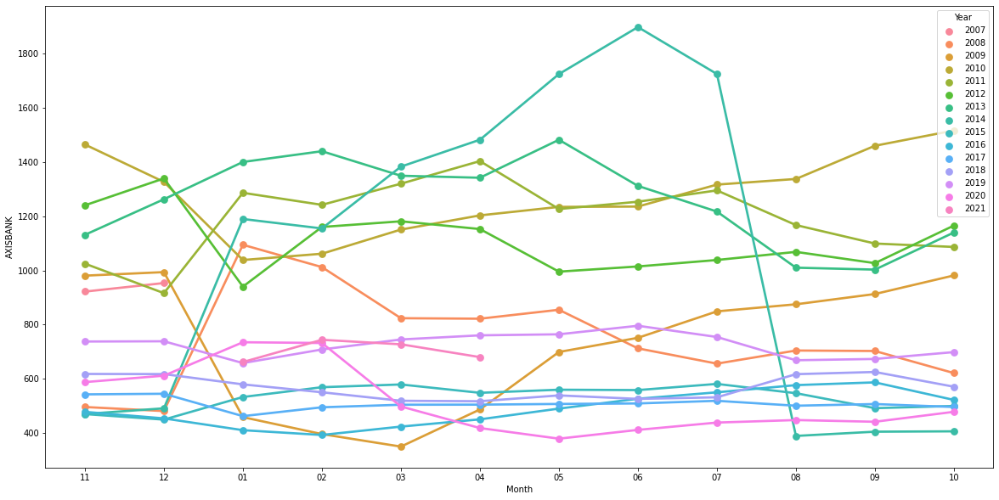

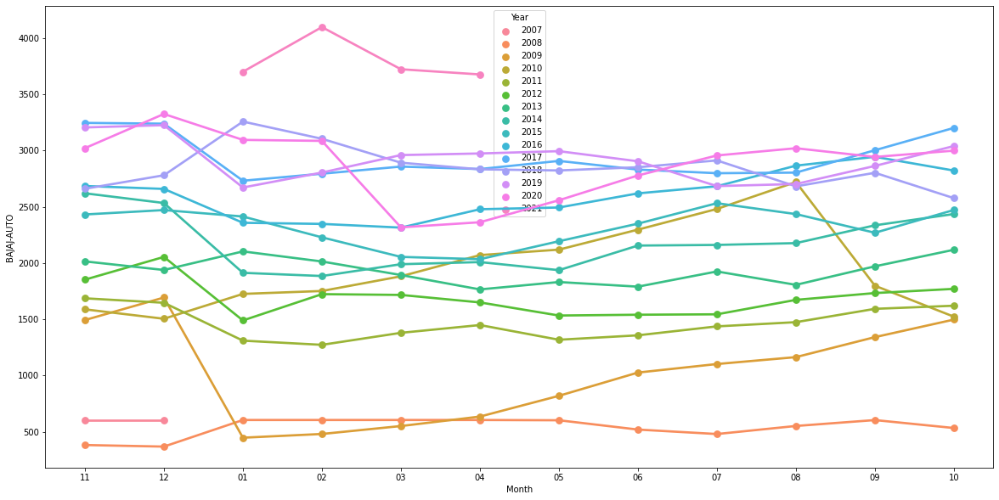

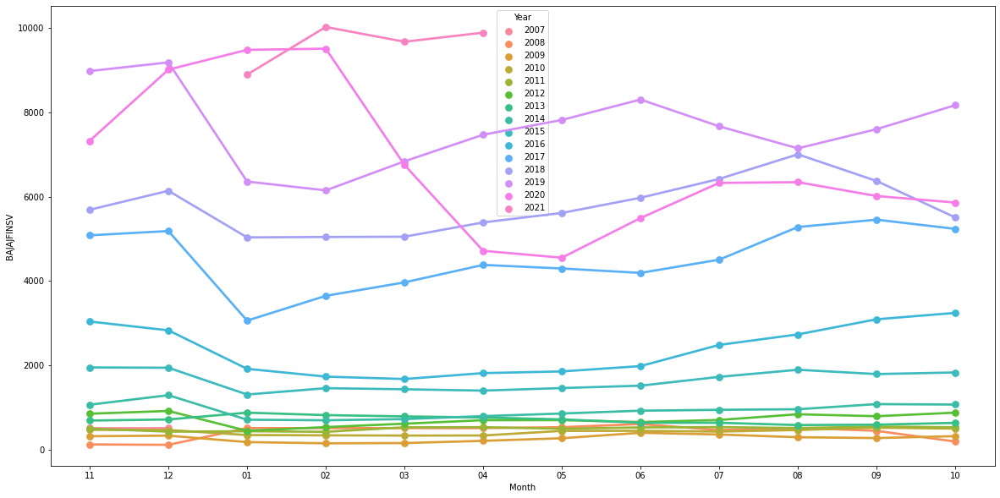

...

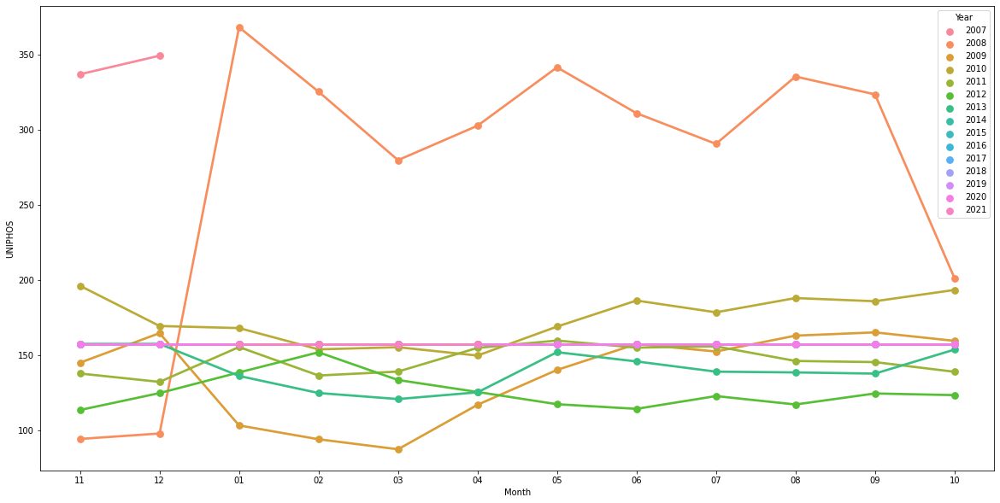

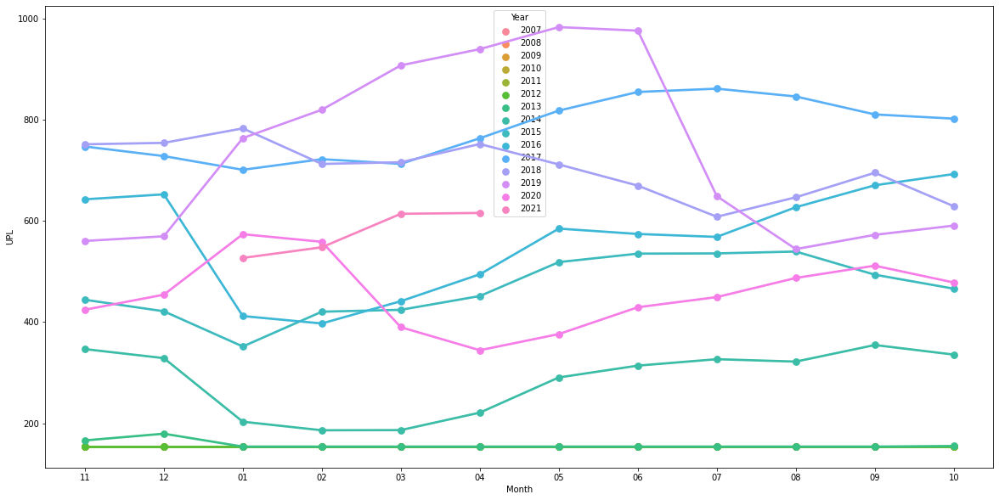

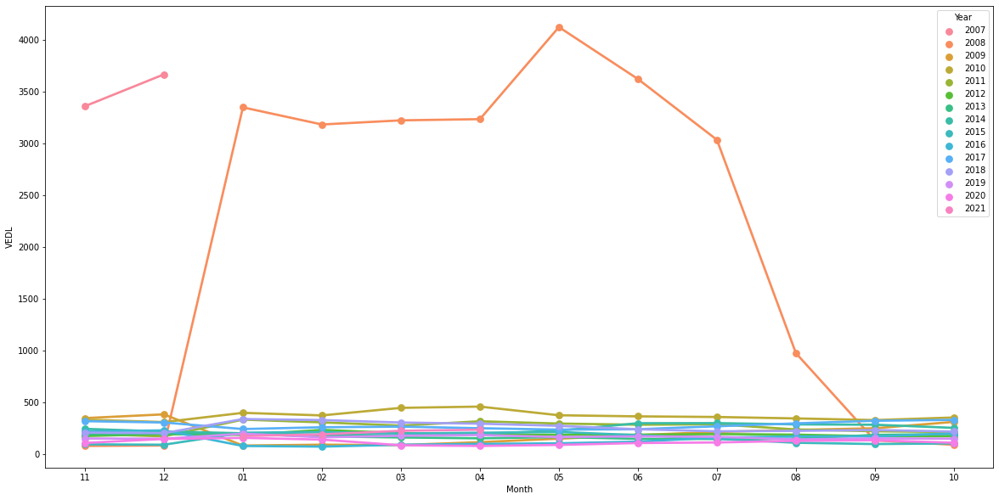

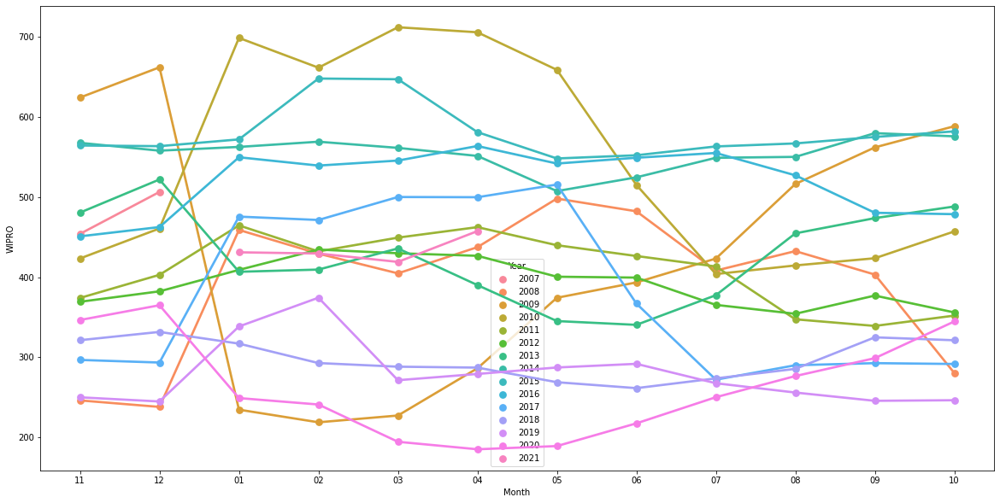

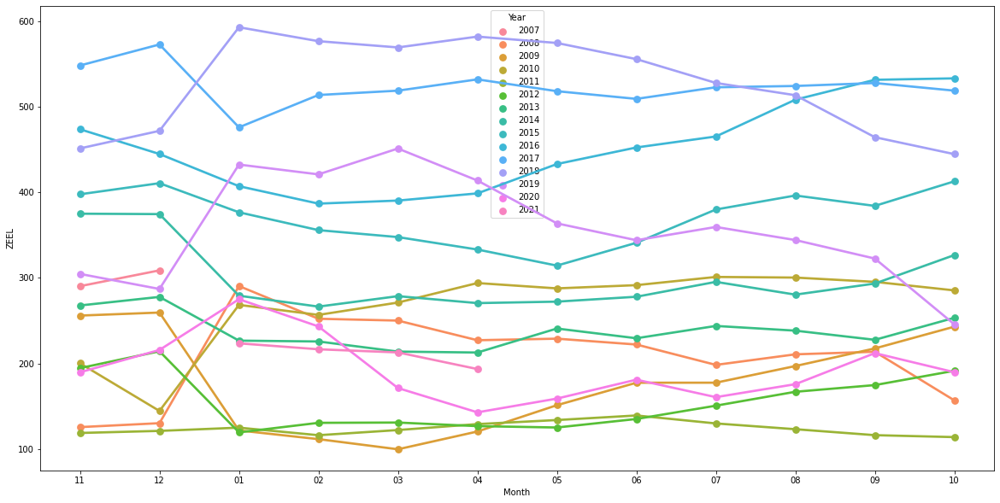

In [77]:
for i in companies:
  fig, ax = plt.subplots(figsize=(20,10))
  sns.pointplot(data=df_4,x= 'Month', y=i,hue='Year',ax=ax)

In [78]:
df_4.tail()

,Date,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,...,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL,Month,Year
157,2020-12-31,465.236364,2547.147727,611.620455,3325.770455,9018.161364,5027.279545,504.352273,388.190909,3658.406818,...,933.865909,1470.463636,5087.927273,157.8,454.154545,144.129545,364.965909,215.775000,12,2020
158,2021-01-31,520.632500,2666.842500,661.912500,3701.170000,8900.102500,4977.462500,562.052500,399.172500,3592.452500,...,1010.300000,1514.110000,5469.547500,157.8,526.825000,172.170000,431.067500,223.535000,01,2021
159,2021-02-28,617.855000,2426.172500,743.925000,4098.282500,10029.912500,5473.177500,586.800000,423.172500,3430.882500,...,970.125000,1480.845000,6282.895000,157.8,547.887500,188.550000,429.535000,216.570000,02,2021
160,2021-03-31,718.066667,2426.780952,727.390476,3723.400000,9679.800000,5364.876190,527.226190,445.045238,3491.085714,...,991.523810,1481.909524,6666.523810,157.8,614.088095,222.745238,419.078571,212.911905,03,2021
161,2021-04-30,756.023684,2582.092105,680.065789,3677.294737,9895.200000,4894.331579,533.876316,419.276316,3672.234211,...,992.547368,1520.634211,6518.552632,157.8,615.813158,233.481579,457.531579,193.465789,04,2021


In [79]:
#From --> 2007-11-30 
#To --> 2021-04-30
## Train test split
train = df_4[df_4['Date']<='2019-12-31']
test =  df_4[df_4['Date']>'2019-12-31']

In [80]:
m1=[]
m2=[]
m3=[]
m4=[]

**ARIMA MODEL**

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1622.971, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1618.922, Time=0.16 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1607.045, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1621.468, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1605.178, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1607.042, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1603.678, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1605.409, Time=0.30 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1605.416, Time=0.32 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1616.951, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1598.393, Time=0.36 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept

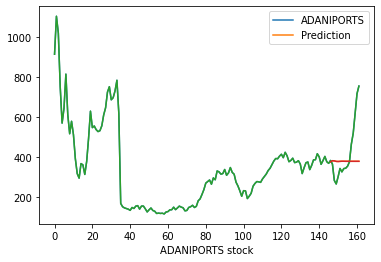

Results of sklearn.metrics:
MAE: 105.02265700821489
RMSE: 153.43306117118962
R-Squared: -0.08858776660436551
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2120.838, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2116.847, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2120.575, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2120.654, Time=0.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2114.879, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2118.838, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2118.838, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2118.585, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2118.609, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2120.388, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.507 seconds
Axes(0.125,0.125;0.775x0.755)


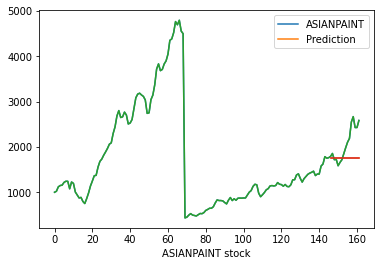

Results of sklearn.metrics:
MAE: 340.65240895438944
RMSE: 461.7101397284864
R-Squared: -0.6489333763227332
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1838.506, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1836.910, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1835.747, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1836.519, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1836.242, Time=0.05 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1836.746, Time=0.38 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1836.136, Time=0.13 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1837.848, Time=0.09 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1837.516, Time=0.23 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1837.113, Time=0.1

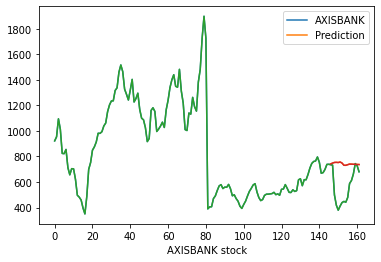

Results of sklearn.metrics:
MAE: 181.18984534446585
RMSE: 225.0722572601857
R-Squared: -1.9271034917893894
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1844.905, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1840.959, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1840.108, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1845.364, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1842.198, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1842.022, Time=0.35 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1840.272, Time=0.20 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1843.161, Time=0.09 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1842.007, Time=0.33 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1841.934, Time=0.1

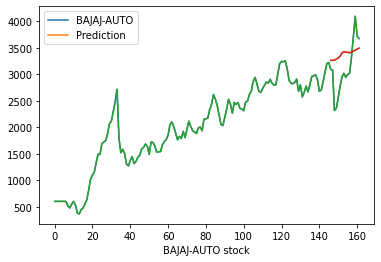

Results of sklearn.metrics:
MAE: 444.08476666993965
RMSE: 512.7731702779403
R-Squared: -0.12215280194920886
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1994.490, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1990.490, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1974.460, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1959.840, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1998.126, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1957.841, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1959.840, Time=0.45 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.51 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1959.469, Time=0.16 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1959.180, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1972.506, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1958.548, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1960.82

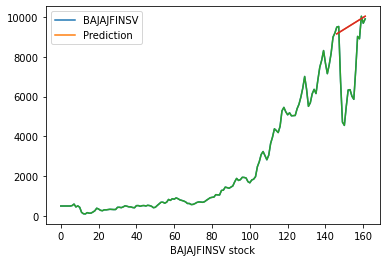

Results of sklearn.metrics:
MAE: 2188.2330136856026
RMSE: 2759.848175458427
R-Squared: -1.1094124777366403
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2301.724, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2297.985, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2299.110, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2298.104, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2296.210, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2299.750, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2299.764, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2297.331, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2296.366, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2296.771, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.614 seconds
Axes(0.125,0.125;0.775x0.755)


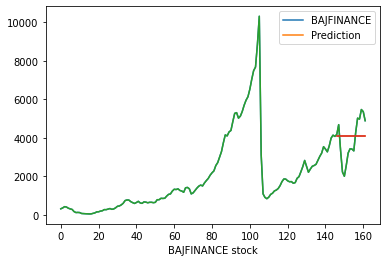

Results of sklearn.metrics:
MAE: 958.4758447259658
RMSE: 1091.2420698753274
R-Squared: -0.02664073608614803
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1491.994, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1488.161, Time=1.40 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1487.705, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1487.210, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1487.100, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1489.995, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1489.993, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1485.749, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1487.704, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1489.702, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1486.550, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1487.227, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=14

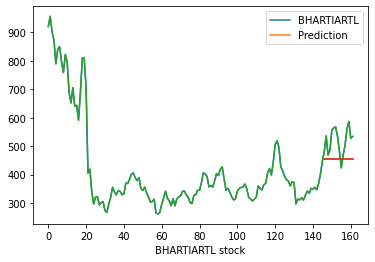

Results of sklearn.metrics:
MAE: 66.3975734268964
RMSE: 76.44183510430933
R-Squared: -1.994299845819505
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1571.594, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1569.704, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1561.238, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1556.535, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1567.729, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1554.892, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1556.555, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1558.488, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1556.381, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1556.151, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1559.644, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1552.910, T

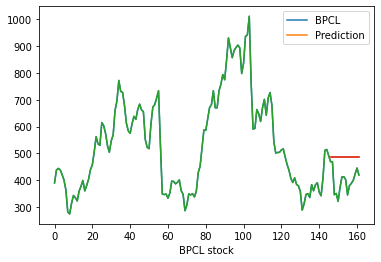

Results of sklearn.metrics:
MAE: 88.8886446458808
RMSE: 98.44668412650337
R-Squared: -4.412696533447619
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2048.397, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2044.464, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2045.747, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2046.288, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2042.689, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2046.453, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2046.454, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2043.770, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2044.303, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2043.859, Time=0.13 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.776 seconds
Axes(0.125,0.125;0.775x0.755)


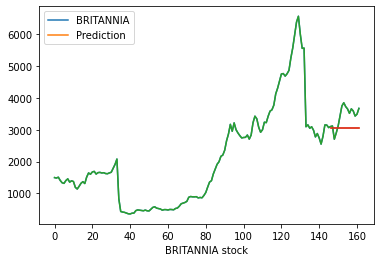

Results of sklearn.metrics:
MAE: 418.54417184987324
RMSE: 478.18687955973047
R-Squared: -1.1806025894282905
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1353.294, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1351.165, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1349.746, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1349.919, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1350.029, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1347.845, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1349.775, Time=0.33 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1350.236, Time=0.39 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1349.830, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1349.836, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1347.994, Time=0.08 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=1346.44

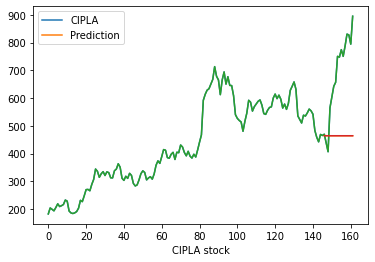

Results of sklearn.metrics:
MAE: 229.83026745353283
RMSE: 262.9543945242113
R-Squared: -2.283858663922886
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1208.935, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1207.176, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1200.327, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1194.176, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1205.790, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1192.480, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1194.225, Time=0.17 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1188.654, Time=0.08 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1190.383, Time=0.22 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1190.319, Time=0.21 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1191.023, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1198.934,

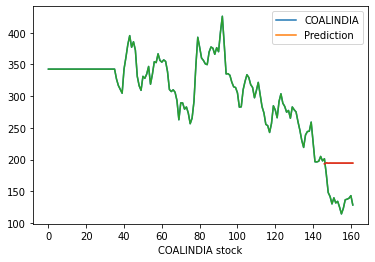

Results of sklearn.metrics:
MAE: 54.77679269577296
RMSE: 57.5943006311843
R-Squared: -6.905415911788493
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1867.709, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1864.005, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1867.659, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1867.646, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1863.608, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1865.755, Time=0.10 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1865.739, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1865.881, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1865.879, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1867.908, Time=0.05 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.661 seconds
Axes(0.125,0.125;0.775x0.755)


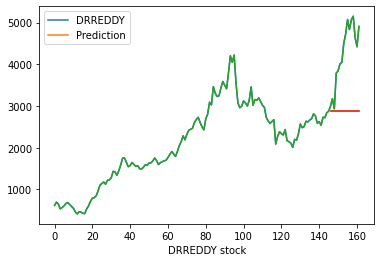

Results of sklearn.metrics:
MAE: 1383.5266241397094
RMSE: 1560.498700808913
R-Squared: -3.673912031355596
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2423.834, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2420.439, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2416.608, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2414.837, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2421.523, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2413.127, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2414.931, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2416.310, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2414.452, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2414.560, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2414.683, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=2416.525, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=2413

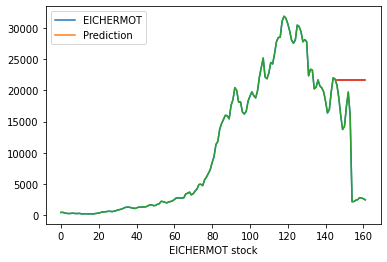

Results of sklearn.metrics:
MAE: 11849.39295755446
RMSE: 14020.390802890312
R-Squared: -2.5000000258971204
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1405.030, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1401.205, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1398.109, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1394.048, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1399.921, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1392.223, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1394.040, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1396.020, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1391.281, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1392.813, Time=0.23 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1392.809, Time=0.24 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1394.808, Time=0.44 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=139

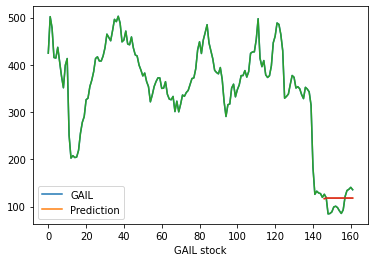

Results of sklearn.metrics:
MAE: 20.309127580807512
RMSE: 22.431901664225077
R-Squared: -0.21183612173152855
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2095.704, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2093.316, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2088.758, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2089.006, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2091.890, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2088.025, Time=0.03 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=2088.922, Time=0.06 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=2090.452, Time=0.14 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=2089.770, Time=0.08 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2089.893, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2088.059, Time=0.13 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=2088.552, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=2

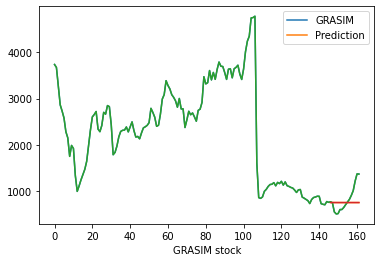

Results of sklearn.metrics:
MAE: 209.13609894198288
RMSE: 283.2945965920732
R-Squared: -0.05825305471289011
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1730.712, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1728.608, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1728.973, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1726.735, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1726.694, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1728.754, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1728.712, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1728.206, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1725.406, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1726.764, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1728.723, Time=0.26 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1712.389, Time=0.12 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=17

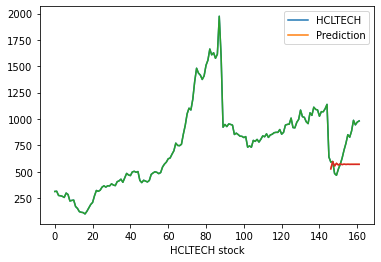

Results of sklearn.metrics:
MAE: 196.71023282952456
RMSE: 246.90537545352072
R-Squared: -0.8424259000117365
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1911.029, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1908.109, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1890.148, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1865.311, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1906.138, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1864.045, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1865.476, Time=0.14 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1866.459, Time=0.29 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1864.813, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1864.506, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1888.230, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1866.243, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=18

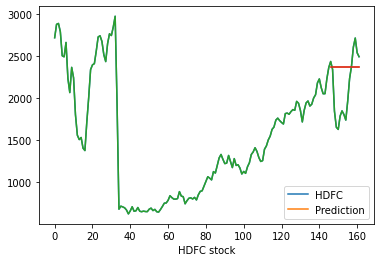

Results of sklearn.metrics:
MAE: 364.5845960646411
RMSE: 442.3545597823199
R-Squared: -0.4717911017076999
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1868.627, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1865.005, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1839.771, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1823.432, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1863.052, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1821.456, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1823.429, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1821.516, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1821.920, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1837.767, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1822.961, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1819.494,

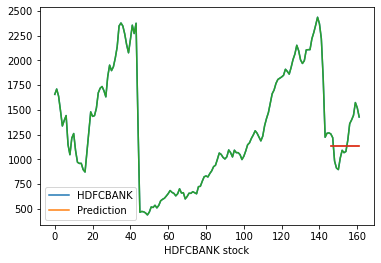

Results of sklearn.metrics:
MAE: 192.47147429726988
RMSE: 225.59746076927317
R-Squared: -0.12796025904848896
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1825.201, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1823.773, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1824.001, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1824.260, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1822.917, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1823.618, Time=0.12 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1823.907, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1824.582, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1824.461, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1822.166, Time=0.15 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1822.008, Time=0.37 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1822.773, Time=0.90 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1

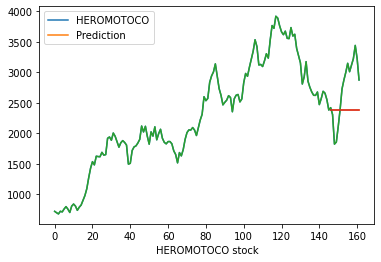

Results of sklearn.metrics:
MAE: 517.8131092740056
RMSE: 596.6940744724449
R-Squared: -0.4787669042967646
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1157.904, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1161.531, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1152.684, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1151.034, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1159.551, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1152.230, Time=0.04 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1149.923, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1152.137, Time=0.13 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1150.957, Time=0.54 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1149.921, Time=0.45 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1148.396, Time=0.38 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1155.478, Time=0.27 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=1151

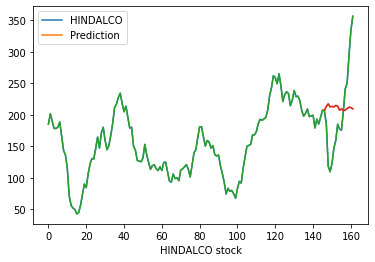

Results of sklearn.metrics:
MAE: 60.161748194110885
RMSE: 73.24574799453002
R-Squared: -0.044093138870670234
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1506.989, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1503.772, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1499.667, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1498.612, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1513.249, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1498.368, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1498.618, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1500.608, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1500.368, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1500.368, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1499.551, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1495.324, Time=0.18 sec
 ARIMA(1,1,2)(1,0,0)[12] intercept   : AIC=1

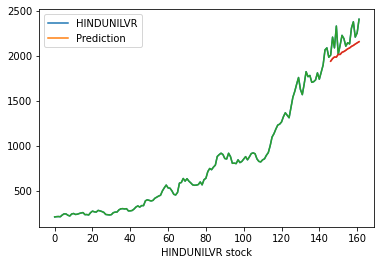

Results of sklearn.metrics:
MAE: 140.83424480440493
RMSE: 169.22502862065545
R-Squared: -1.1510482451354567
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1801.545, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1798.069, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1800.667, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1800.524, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1796.257, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1799.859, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1799.818, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1798.841, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1798.729, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1800.619, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.925 seconds
Axes(0.125,0.125;0.775x0.755)


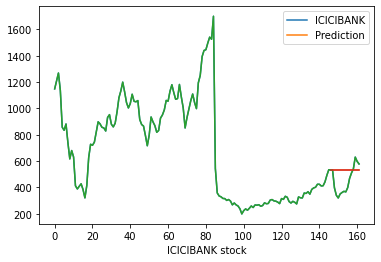

Results of sklearn.metrics:
MAE: 104.64327203569692
RMSE: 127.425213355348
R-Squared: -0.6096998783846388
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1568.365, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1566.062, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1560.119, Time=0.17 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1556.053, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1568.698, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1556.423, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1557.897, Time=0.24 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1557.523, Time=0.56 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1555.904, Time=0.12 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1557.887, Time=0.25 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1559.816, Time=0.86 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1566.369, Time=0.13 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1551

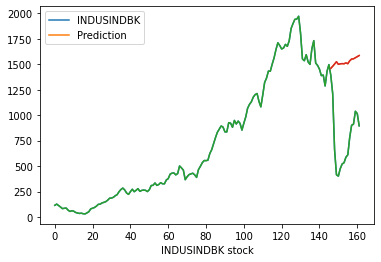

Results of sklearn.metrics:
MAE: 750.7604978069362
RMSE: 803.1596911807355
R-Squared: -6.909144042697419
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1997.082, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1993.664, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1997.143, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1997.084, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1991.759, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1995.257, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1995.223, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1995.551, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1995.519, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1996.712, Time=0.11 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.916 seconds
Axes(0.125,0.125;0.775x0.755)


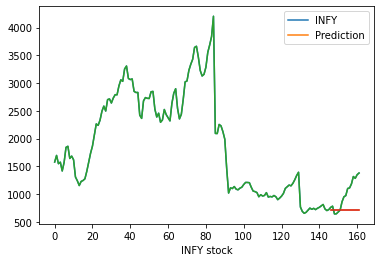

Results of sklearn.metrics:
MAE: 288.1957891243879
RMSE: 368.19757943997166
R-Squared: -1.0315245763443133
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1509.304, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1506.870, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1501.509, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1507.915, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1499.660, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1501.519, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1503.197, Time=0.41 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1500.201, Time=0.12 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1498.283, Time=0.10 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1500.133, Time=0.24 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1500.126, Time=0.28 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=1501.862

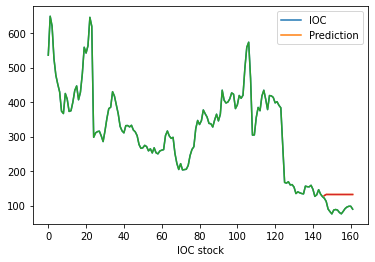

Results of sklearn.metrics:
MAE: 40.86869662423766
RMSE: 42.69505581408543
R-Squared: -12.032084688726504
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1279.715, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1278.534, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1278.763, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1278.079, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1276.586, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1278.741, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1278.333, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1278.477, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1278.151, Time=0.04 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1279.798, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.977 seconds
Axes(0.125,0.125;0.775x0.755)


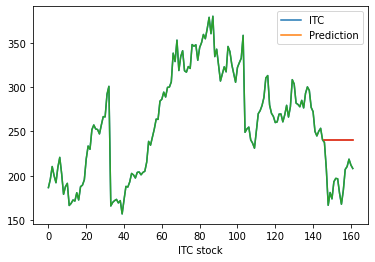

Results of sklearn.metrics:
MAE: 44.108777903978506
RMSE: 48.09833028755523
R-Squared: -5.288852762140257
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1846.956, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1844.054, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1842.723, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1842.793, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1842.242, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1845.104, Time=0.09 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1845.086, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1841.131, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1842.686, Time=0.23 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1844.203, Time=0.37 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1843.105, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1843.083, Time=0.08 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1841

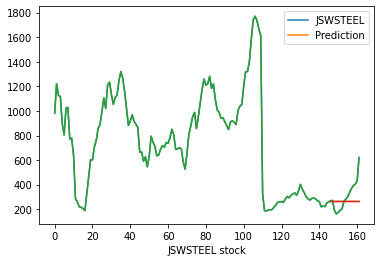

Results of sklearn.metrics:
MAE: 89.83960162317507
RMSE: 122.92266123702315
R-Squared: -0.11941141401367728
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1677.819, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1659.519, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1655.963, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1676.149, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1654.903, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1655.891, Time=0.19 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1657.872, Time=0.34 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1656.870, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1656.858, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1659.434, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1657.223, Time=0.21 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1653.15

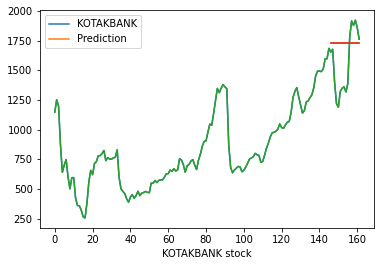

Results of sklearn.metrics:
MAE: 259.5301816246038
RMSE: 307.2315260976515
R-Squared: -0.41430230927141953
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2254.510, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2267.019, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1962.768, Time=0.31 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2111.036, Time=0.26 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2578.696, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1960.867, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1962.745, Time=0.33 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1953.461, Time=0.15 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1955.453, Time=0.45 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1955.451, Time=0.53 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1954.693, Tim

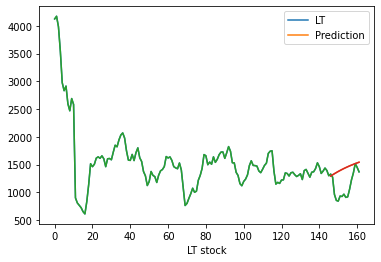

Results of sklearn.metrics:
MAE: 317.47649674882814
RMSE: 374.1720791592013
R-Squared: -1.7357615482110162
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1694.376, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1693.109, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1689.740, Time=0.18 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1690.336, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1691.148, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1689.863, Time=0.04 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1690.598, Time=0.52 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1691.039, Time=0.25 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1690.048, Time=0.14 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1692.100, Time=0.83 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1693.134, Time=0.09 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1691.738, Time=0.18 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=169

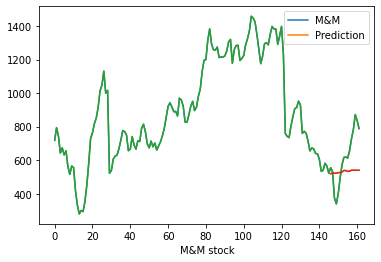

Results of sklearn.metrics:
MAE: 140.1069899475498
RMSE: 170.04256499183342
R-Squared: -0.17275327344180202
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2035.205, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2022.450, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2015.489, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2036.882, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2015.177, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2016.046, Time=0.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2016.862, Time=0.35 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2016.635, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2022.616, Time=0.11 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=2018.317, Time=0.25 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=2015.273, Ti

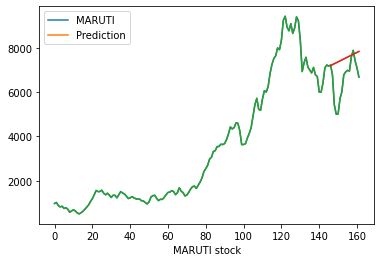

Results of sklearn.metrics:
MAE: 949.3560862627528
RMSE: 1203.9566059425908
R-Squared: -0.9458706819948899
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2079.447, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2081.564, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2075.502, Time=0.28 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2076.196, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2089.218, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2080.417, Time=0.05 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=2077.098, Time=0.69 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=2077.272, Time=0.25 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=2075.352, Time=0.14 sec
 ARIMA(1,1,0)(0,0,2)[12] intercept   : AIC=2077.210, Time=0.43 sec
 ARIMA(1,1,0)(1,0,2)[12] intercept   : AIC=2079.222, Time=0.65 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2077.532, Time=0.09 sec
 ARIMA(2,1,0)(0,0,1)[12] intercept   : AIC=207

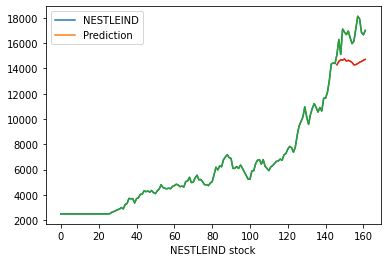

Results of sklearn.metrics:
MAE: 2111.9252600204713
RMSE: 2261.298105619168
R-Squared: -6.941612169634544
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1049.277, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1045.371, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1048.838, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1048.349, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1044.628, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1047.311, Time=0.06 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1047.316, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1046.860, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1046.360, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1046.147, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.865 seconds
Axes(0.125,0.125;0.775x0.755)


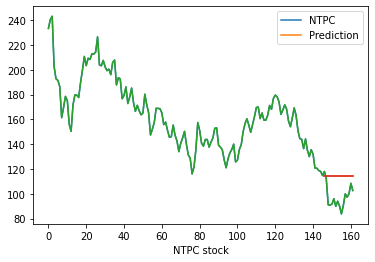

Results of sklearn.metrics:
MAE: 17.90281170647304
RMSE: 19.61872402579189
R-Squared: -3.8825394539048803
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1665.447, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1662.744, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1642.313, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1636.271, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1662.082, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1634.289, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1636.271, Time=0.22 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1637.812, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1636.113, Time=0.10 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1636.060, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1640.341, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1637.500, Time=0.14 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1633

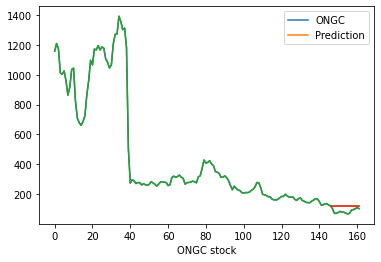

Results of sklearn.metrics:
MAE: 34.24027257952002
RMSE: 37.81657668818845
R-Squared: -4.549510971000029
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=954.532, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=956.341, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=951.111, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=948.118, Time=0.12 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=954.616, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=949.926, Time=0.04 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=950.051, Time=0.32 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=950.112, Time=0.35 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=948.157, Time=0.23 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=952.088, Time=1.52 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=952.806, Time=0.17 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=947.684, Time=0.40 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.11 se

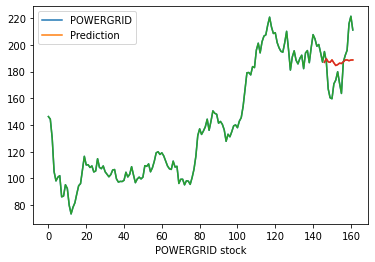

Results of sklearn.metrics:
MAE: 15.560177584857458
RMSE: 18.62381900620497
R-Squared: 0.04264345337344111
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2186.057, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2215.094, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1860.747, Time=0.64 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.63 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2502.311, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1858.765, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1860.747, Time=0.52 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.27 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1850.492, Time=0.13 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1852.480, Time=0.40 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1852.480, Time=0.35 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1846.342, Time=0.2

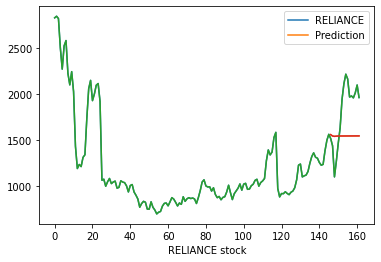

Results of sklearn.metrics:
MAE: 373.37542511916655
RMSE: 420.4606005870221
R-Squared: -0.5885594402568033
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1948.895, Time=0.11 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1944.873, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1930.180, Time=0.06 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1924.727, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1943.557, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1922.799, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1924.741, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1926.335, Time=0.45 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1924.783, Time=0.15 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1924.778, Time=0.14 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1928.205, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1921.205

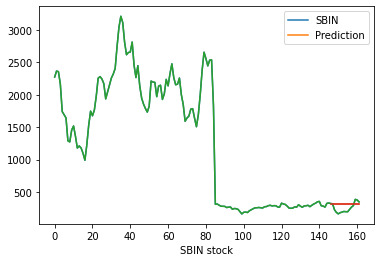

Results of sklearn.metrics:
MAE: 83.9436626832725
RMSE: 97.15855517922354
R-Squared: -0.77729336657104
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2288.015, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2285.683, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2282.684, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2276.705, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2289.771, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2275.248, Time=0.03 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2276.817, Time=0.15 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2278.675, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2272.113, Time=0.17 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2274.230, Time=0.37 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2274.202, Time=0.48 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=2275.929, Time=0.63 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2281.18

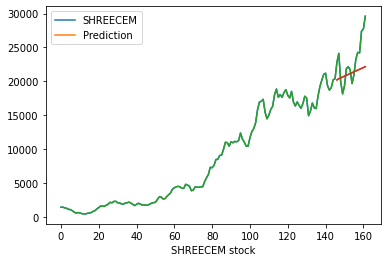

Results of sklearn.metrics:
MAE: 2562.0206032013884
RMSE: 3246.708912811358
R-Squared: -0.08704073279912339
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1853.466, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1856.144, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1855.882, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1851.621, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1855.063, Time=0.03 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1855.096, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1854.468, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1854.168, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1854.823, Time=0.12 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.942 seconds
Axes(0.125,0.125;0.775x0.755)


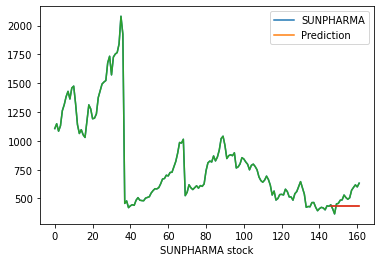

Results of sklearn.metrics:
MAE: 88.79901232154411
RMSE: 107.62875975679425
R-Squared: -1.0888684142187666
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1629.281, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1630.634, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1603.286, Time=0.13 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1593.240, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1629.114, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1591.286, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1593.256, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1593.286, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1593.286, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1601.438, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1594.221, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1589.541

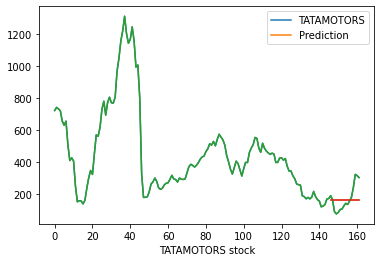

Results of sklearn.metrics:
MAE: 64.00219938046943
RMSE: 80.76393879579646
R-Squared: -0.010072549032188682
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1884.351, Time=0.02 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1555.267, Time=0.25 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1717.061, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2225.696, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1555.523, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1545.107, Time=0.51 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1546.907, Time=1.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1550.041, Time=0.41 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1880.944, Time=0.79 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1535.032, Time=0.78 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1541.597, Time=0.60 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1536.30

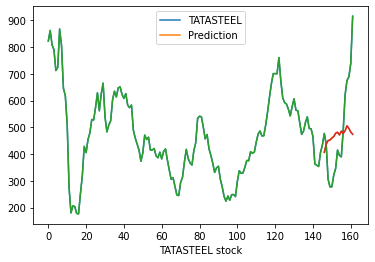

Results of sklearn.metrics:
MAE: 143.17050997453103
RMSE: 175.2626104179269
R-Squared: 0.08003772395037279
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1891.612, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1888.604, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1889.184, Time=0.05 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1888.380, Time=0.17 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1886.951, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1890.292, Time=0.04 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1890.249, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1887.360, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1886.558, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1888.399, Time=0.23 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1889.691, Time=0.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1887.733, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=188

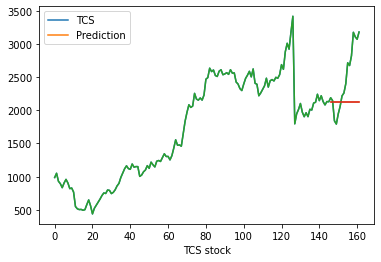

Results of sklearn.metrics:
MAE: 455.6121589534953
RMSE: 586.3027473797807
R-Squared: -0.5348517424930905
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1879.386, Time=0.16 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1875.543, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1853.492, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1843.712, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1873.562, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1841.728, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1843.717, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1845.509, Time=0.32 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1843.650, Time=0.04 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1843.633, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1851.495, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1845.630, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1839

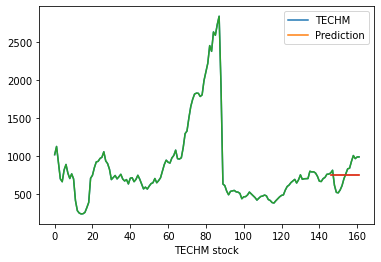

Results of sklearn.metrics:
MAE: 148.98902686772414
RMSE: 169.94642271176332
R-Squared: -0.021539143261047444
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2056.296, Time=0.15 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2053.651, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2047.783, Time=0.08 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2046.744, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2051.660, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2045.897, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2046.794, Time=0.16 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2048.722, Time=0.62 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2047.915, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2047.834, Time=0.25 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2046.730, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=2043.

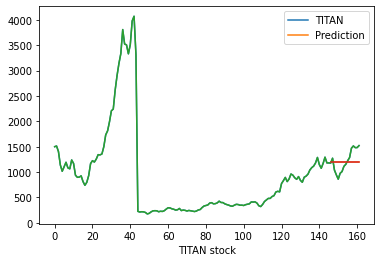

Results of sklearn.metrics:
MAE: 186.49126310093416
RMSE: 218.0562438909086
R-Squared: -0.020206189860461965
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1867.234, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1872.415, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1864.454, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1864.568, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1873.276, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1871.428, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1866.416, Time=0.55 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1866.425, Time=0.36 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1865.263, Time=0.12 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1868.379, Time=0.50 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1865.269, Time=0.13 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1863.117, Time=0.32 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1

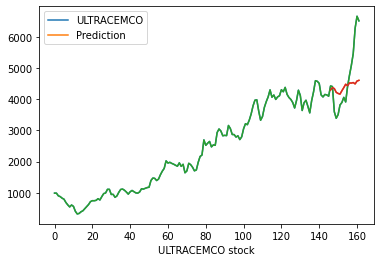

Results of sklearn.metrics:
MAE: 723.369969739771
RMSE: 962.764463361925
R-Squared: 0.14746076732188917
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1557.076, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1255.016, Time=0.23 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1386.570, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1919.209, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1256.739, Time=0.09 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1256.949, Time=0.96 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1256.808, Time=0.50 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1254.811, Time=0.15 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1256.809, Time=0.53 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=1547.112, Time=0.13 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1233.415, Time=0

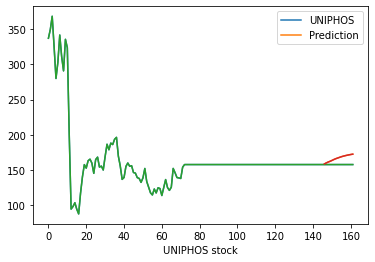

Results of sklearn.metrics:
MAE: 9.023521050811555
RMSE: 10.015718592748998
R-Squared: 0.0
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1488.256, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1486.290, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1482.110, Time=0.15 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1479.845, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1485.028, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1478.240, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1479.783, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1481.173, Time=0.36 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1475.931, Time=0.09 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1477.478, Time=0.28 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1477.590, Time=0.34 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1478.107, Time=0.41 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1480.594, Time=0.04

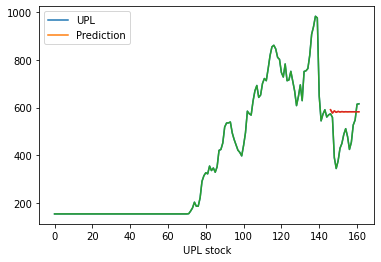

Results of sklearn.metrics:
MAE: 104.53693401764255
RMSE: 125.41150822045064
R-Squared: -1.4392515159996866
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2364.244, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2362.825, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1991.774, Time=0.17 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2209.858, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2397.691, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1990.191, Time=0.05 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1991.716, Time=0.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1993.715, Time=0.22 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1959.418, Time=0.08 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1961.402, Time=0.24 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1961.398, Time=0.20 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1963.400, Time=0.32 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=19

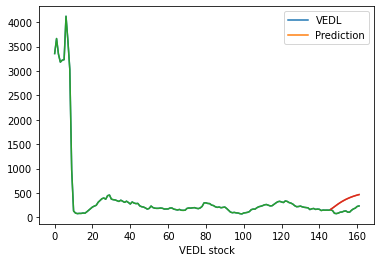

Results of sklearn.metrics:
MAE: 203.4656897369877
RMSE: 217.51169437708145
R-Squared: -21.393181666161784
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1471.525, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1467.599, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1457.413, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1455.584, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1465.813, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1453.599, Time=0.07 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1455.586, Time=0.21 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1457.428, Time=0.33 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1455.598, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1455.598, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1455.655, Time=0.06 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1457.598, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=145

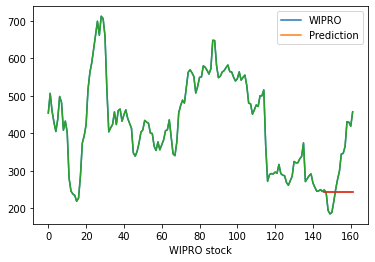

Results of sklearn.metrics:
MAE: 86.54182048911093
RMSE: 111.0559580906478
R-Squared: -0.47964588748477843
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1320.233, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1314.310, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1313.891, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1318.233, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1311.984, Time=0.06 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1313.903, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1313.918, Time=0.06 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1313.904, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1312.345, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1315.365, Time=0.17 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1309.984, Tim

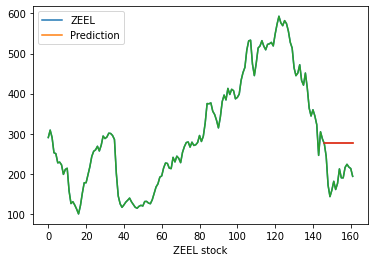

Results of sklearn.metrics:
MAE: 79.13359669834527
RMSE: 85.71318854479398
R-Squared: -5.773542600538558


In [81]:
for i in companies:
    model = pm.auto_arima(train[i], m=12, seasonal=True, start_p=0, start_q=0, max_order=4, test='adf',error_action='ignore',
                          suppress_warnings=True,stepwise=True, trace=True)
    model.fit(train[i])
    forecast=model.predict(n_periods=365, return_conf_int=True)
    forecast_df = pd.DataFrame(forecast[0],index = test.index, columns=['Prediction'])

    mae = metrics.mean_absolute_error(test[i], forecast_df)
    mse = metrics.mean_squared_error(test[i], forecast_df)
    m1.append(mse)
    rmse = np.sqrt(mse)
    r2 = metrics.r2_score(test[i],forecast_df['Prediction'])
    print(pd.concat([df_4[i],forecast_df],axis=1).plot())
    plt.plot(df_4[i],label="Actual")
    plt.plot(forecast_df,label="Predicted")
    plt.xlabel(i+' stock')
    plt.show()

    print("Results of sklearn.metrics:")
    print("MAE:",mae)
    print("RMSE:", rmse)
    print("R-Squared:", r2)

In [82]:
df_4.head(2)

,Date,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,...,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL,Month,Year
0,2007-11-30,915.637500,998.175000,921.825000,604.75,509.1,322.987500,920.037500,390.012500,1496.262500,...,1022.075000,1499.875000,987.712500,337.237500,153.8,3357.700000,454.075000,290.375000,11,2007
1,2007-12-31,1105.776316,1020.505263,953.365789,604.75,509.1,367.136842,956.321053,437.876316,1482.171053,...,1129.710526,1512.494737,988.634211,349.576316,153.8,3665.081579,506.431579,308.852632,12,2007


**FB Prophet Model**

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/qfe6_bmo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/bwaulvp6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47062', 'data', 'file=/tmp/tmpj6ecp23w/qfe6_bmo.json', 'init=/tmp/tmpj6ecp23w/bwaulvp6.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model4o4yqc6j/prophet_model-20230319093815.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


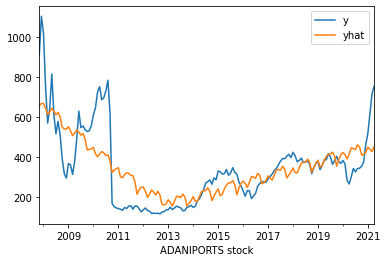

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/tq74ydjz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/127qj6r8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22362', 'data', 'file=/tmp/tmpj6ecp23w/tq74ydjz.json', 'init=/tmp/tmpj6ecp23w/127qj6r8.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelz2gdqecl/prophet_model-20230319093816.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 90.40919412523715
RMSE: 124.27246411418389
R-Squared: 0.5863362724642391


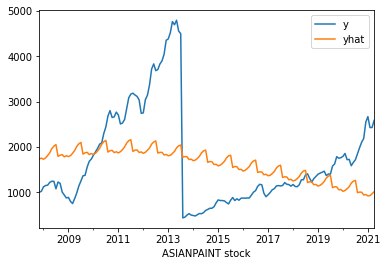

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/xiglsn54.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/jb9fjgy7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=31183', 'data', 'file=/tmp/tmpj6ecp23w/xiglsn54.json', 'init=/tmp/tmpj6ecp23w/jb9fjgy7.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelz70gj70l/prophet_model-20230319093816.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 835.1634602128705
RMSE: 1041.7785550434967
R-Squared: 0.06605494662938771


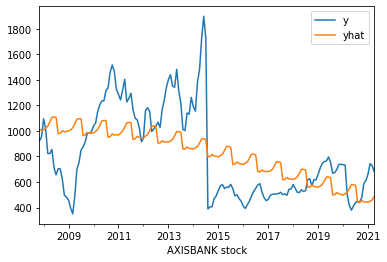

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/jg_wk3tg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/2dm1l8t6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75834', 'data', 'file=/tmp/tmpj6ecp23w/jg_wk3tg.json', 'init=/tmp/tmpj6ecp23w/2dm1l8t6.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelr9t2wfd3/prophet_model-20230319093817.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 240.50026878889022
RMSE: 292.37829475635044
R-Squared: 0.3074435462312084


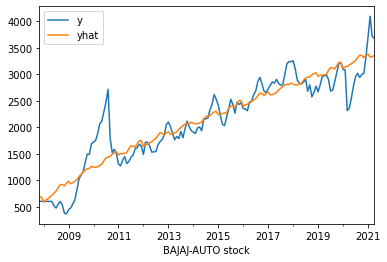

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/symdov7r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/263i11pe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13218', 'data', 'file=/tmp/tmpj6ecp23w/symdov7r.json', 'init=/tmp/tmpj6ecp23w/263i11pe.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelzfmmigbx/prophet_model-20230319093817.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 217.10429944399965
RMSE: 307.6282255165773
R-Squared: 0.8594448999951646


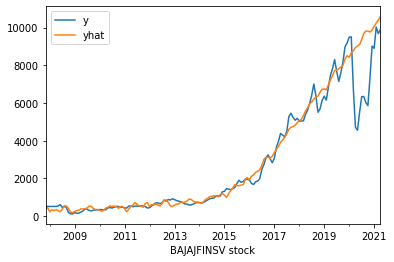

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/yf2tssm4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/_80kfsgp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50060', 'data', 'file=/tmp/tmpj6ecp23w/yf2tssm4.json', 'init=/tmp/tmpj6ecp23w/_80kfsgp.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelsqcypm3n/prophet_model-20230319093818.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 398.36946417502077
RMSE: 885.5616638582543
R-Squared: 0.9029380025943673


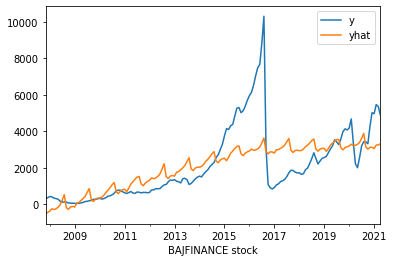

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/17no4cdv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/4o7ewr3v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13935', 'data', 'file=/tmp/tmpj6ecp23w/17no4cdv.json', 'init=/tmp/tmpj6ecp23w/4o7ewr3v.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model2of_1_sx/prophet_model-20230319093818.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 977.1394002612298
RMSE: 1415.2615564973992
R-Squared: 0.47707615717753127


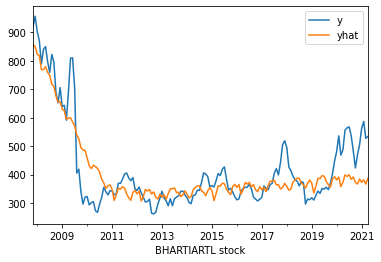

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/nviuvodv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/kpyfllwe.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88085', 'data', 'file=/tmp/tmpj6ecp23w/nviuvodv.json', 'init=/tmp/tmpj6ecp23w/kpyfllwe.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model0o_b0lbw/prophet_model-20230319093818.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 56.869689746646266
RMSE: 77.29942243334972
R-Squared: 0.7510941448321738


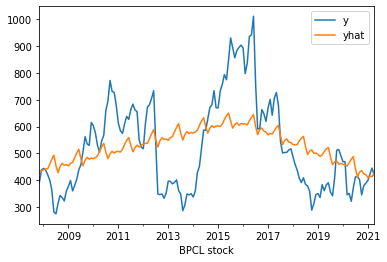

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/cuved765.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/9aent315.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56457', 'data', 'file=/tmp/tmpj6ecp23w/cuved765.json', 'init=/tmp/tmpj6ecp23w/9aent315.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelkxbptvzt/prophet_model-20230319093819.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 120.29520802204624
RMSE: 145.57797626966166
R-Squared: 0.2878382389389854


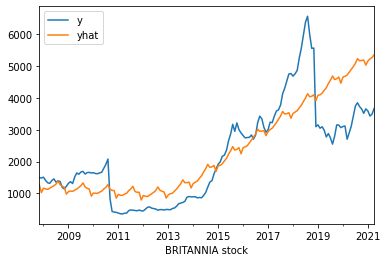

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/k7qqrbv7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/2igvswx0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56247', 'data', 'file=/tmp/tmpj6ecp23w/k7qqrbv7.json', 'init=/tmp/tmpj6ecp23w/2igvswx0.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelinxv52d9/prophet_model-20230319093819.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 728.7718671384537
RMSE: 917.7340672828273
R-Squared: 0.6155525755911198


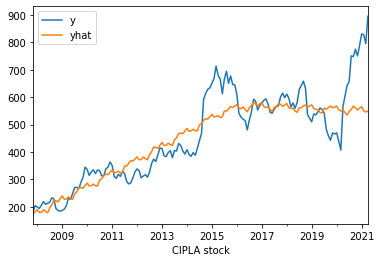

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/2mz_gj6p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/_8vfl6qr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63973', 'data', 'file=/tmp/tmpj6ecp23w/2mz_gj6p.json', 'init=/tmp/tmpj6ecp23w/_8vfl6qr.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelvx8zlozo/prophet_model-20230319093820.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 58.5367823455469
RMSE: 82.27847782230475
R-Squared: 0.7538744764290609


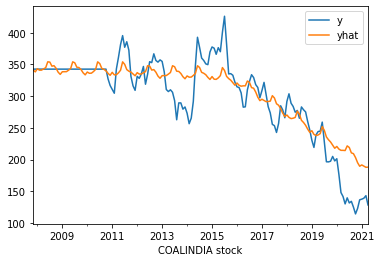

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/pb7eqprl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/22tac0f2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16580', 'data', 'file=/tmp/tmpj6ecp23w/pb7eqprl.json', 'init=/tmp/tmpj6ecp23w/22tac0f2.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model32q28to9/prophet_model-20230319093820.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 24.174302178594548
RMSE: 33.028380460369455
R-Squared: 0.767723998760675


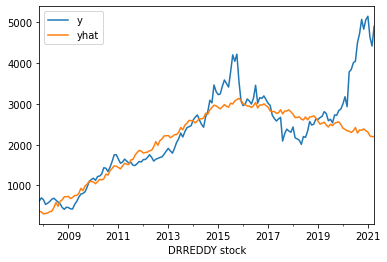

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/bpvk54kt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/kxp4pgci.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84387', 'data', 'file=/tmp/tmpj6ecp23w/bpvk54kt.json', 'init=/tmp/tmpj6ecp23w/kxp4pgci.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelypcr4ofk/prophet_model-20230319093820.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 414.87692532419186
RMSE: 718.155956541416
R-Squared: 0.5873086711948661


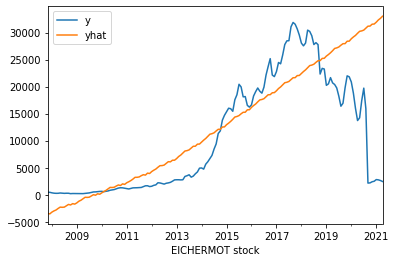

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/zcjk2r8i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/5iw08e5g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41751', 'data', 'file=/tmp/tmpj6ecp23w/zcjk2r8i.json', 'init=/tmp/tmpj6ecp23w/5iw08e5g.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model8m72fh5l/prophet_model-20230319093821.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 5207.08460118394
RMSE: 8211.563875928621
R-Squared: 0.3760250248383371


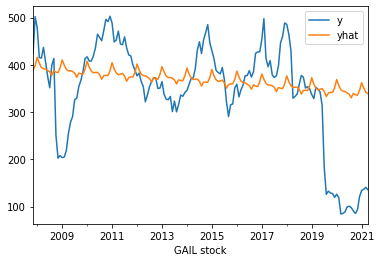

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/f30gbyb5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/03bfknr7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76834', 'data', 'file=/tmp/tmpj6ecp23w/f30gbyb5.json', 'init=/tmp/tmpj6ecp23w/03bfknr7.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelnskg0nrk/prophet_model-20230319093821.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 74.80116933247778
RMSE: 104.56919535066294
R-Squared: 0.08157869443683263


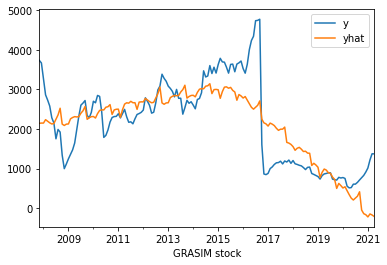

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/gj_652_7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/rvyr6ee9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81209', 'data', 'file=/tmp/tmpj6ecp23w/gj_652_7.json', 'init=/tmp/tmpj6ecp23w/rvyr6ee9.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelkpvmjlwk/prophet_model-20230319093821.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 517.923395196757
RMSE: 690.0795560436604
R-Squared: 0.5945520362882761


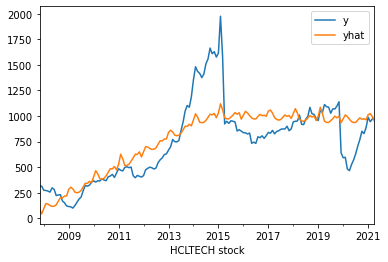

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/4yo_h84g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/au48vpqq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2020', 'data', 'file=/tmp/tmpj6ecp23w/4yo_h84g.json', 'init=/tmp/tmpj6ecp23w/au48vpqq.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modele6m9ka5o/prophet_model-20230319093822.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 170.2232598126039
RMSE: 230.85526887881613
R-Squared: 0.6349142369795838


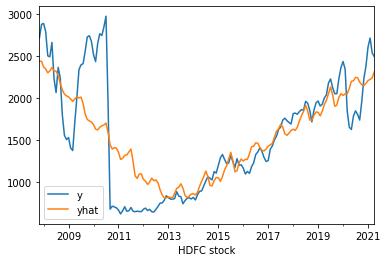

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/5i6fn8oq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/7o85e2yv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46672', 'data', 'file=/tmp/tmpj6ecp23w/5i6fn8oq.json', 'init=/tmp/tmpj6ecp23w/7o85e2yv.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelkdflq4ux/prophet_model-20230319093822.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 278.9558205529297
RMSE: 392.9378240192528
R-Squared: 0.6686416698960497


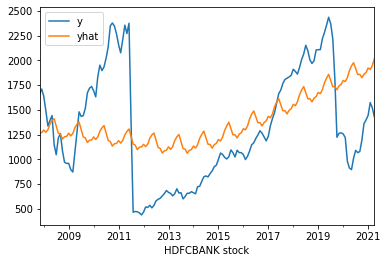

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/a1mtlu94.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/s9x4m_ub.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73398', 'data', 'file=/tmp/tmpj6ecp23w/a1mtlu94.json', 'init=/tmp/tmpj6ecp23w/s9x4m_ub.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelw6es9es8/prophet_model-20230319093823.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 440.73959884908487
RMSE: 514.7255392724173
R-Squared: 0.14353171713650903


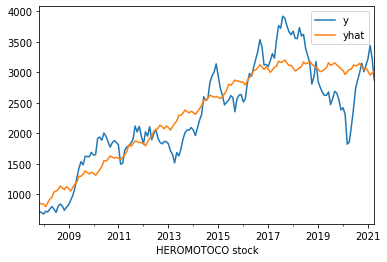

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/1t7eigys.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/o4roc6v2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49416', 'data', 'file=/tmp/tmpj6ecp23w/1t7eigys.json', 'init=/tmp/tmpj6ecp23w/o4roc6v2.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelrob3wd08/prophet_model-20230319093823.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 296.2413206155052
RMSE: 365.50944586363113
R-Squared: 0.8038658173900206


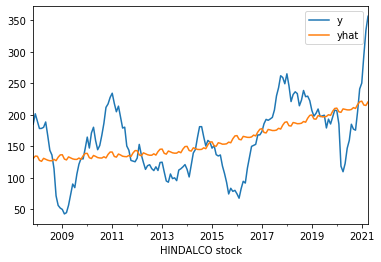

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/793hjb01.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/zm9pgcgy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46902', 'data', 'file=/tmp/tmpj6ecp23w/793hjb01.json', 'init=/tmp/tmpj6ecp23w/zm9pgcgy.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model0_ewuhfz/prophet_model-20230319093823.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 38.19516137169546
RMSE: 47.700153727553456
R-Squared: 0.2934886536259935


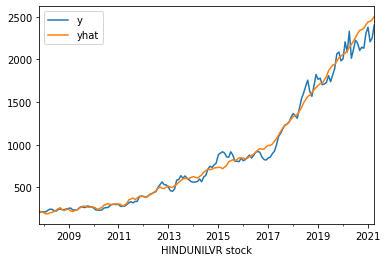

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/cpf2xt1g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/sfl87i1f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72485', 'data', 'file=/tmp/tmpj6ecp23w/cpf2xt1g.json', 'init=/tmp/tmpj6ecp23w/sfl87i1f.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model6c32f72a/prophet_model-20230319093824.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 51.138964725377114
RMSE: 75.88135586730652
R-Squared: 0.9864616704246423


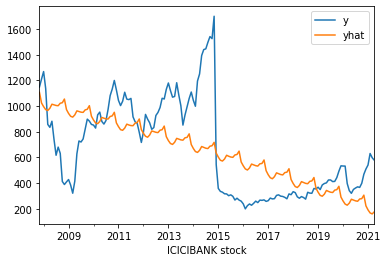

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/1s7whg_1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/az7hl91l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=740', 'data', 'file=/tmp/tmpj6ecp23w/1s7whg_1.json', 'init=/tmp/tmpj6ecp23w/az7hl91l.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelswlb1h5y/prophet_model-20230319093824.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 240.30303359865385
RMSE: 304.6755821266695
R-Squared: 0.3110167265779792


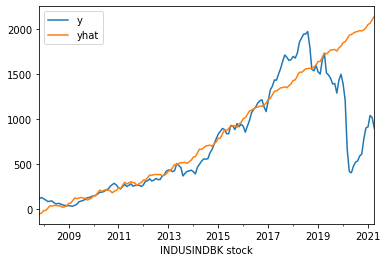

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/9trp7772.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/b9zzk39a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85636', 'data', 'file=/tmp/tmpj6ecp23w/9trp7772.json', 'init=/tmp/tmpj6ecp23w/b9zzk39a.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model3z9951k1/prophet_model-20230319093825.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 206.7887261901094
RMSE: 414.77598252217376
R-Squared: 0.4593537737076201


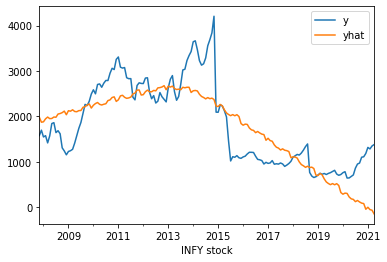

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/phy3u2q5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/hzuln10i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35324', 'data', 'file=/tmp/tmpj6ecp23w/phy3u2q5.json', 'init=/tmp/tmpj6ecp23w/hzuln10i.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelxfmf0uiw/prophet_model-20230319093825.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 473.21283556831935
RMSE: 592.7601781555508
R-Squared: 0.5839121599242023


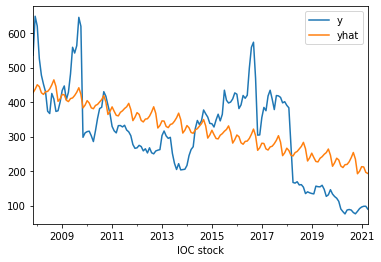

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/m6vzqwhk.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/_u0xtohf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73952', 'data', 'file=/tmp/tmpj6ecp23w/m6vzqwhk.json', 'init=/tmp/tmpj6ecp23w/_u0xtohf.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelmtpdxiy2/prophet_model-20230319093825.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 89.27354295707696
RMSE: 102.18965585428381
R-Squared: 0.40373442988024244


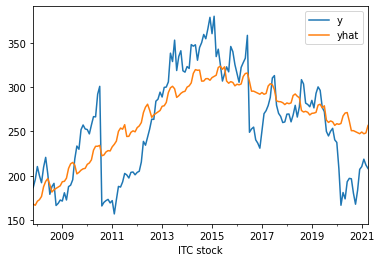

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/6l654s1b.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/9pzmbj80.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40167', 'data', 'file=/tmp/tmpj6ecp23w/6l654s1b.json', 'init=/tmp/tmpj6ecp23w/9pzmbj80.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modeld8s4_03f/prophet_model-20230319093826.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 32.40014933145319
RMSE: 38.503608812177355
R-Squared: 0.5703367263182477


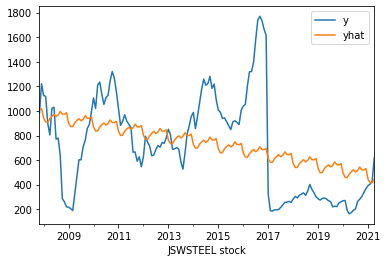

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/t0rp4hvo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/y2gvit_u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87098', 'data', 'file=/tmp/tmpj6ecp23w/t0rp4hvo.json', 'init=/tmp/tmpj6ecp23w/y2gvit_u.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modeli5cyq9nk/prophet_model-20230319093826.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 291.6581775254388
RMSE: 360.77264765291585
R-Squared: 0.18979765941892857


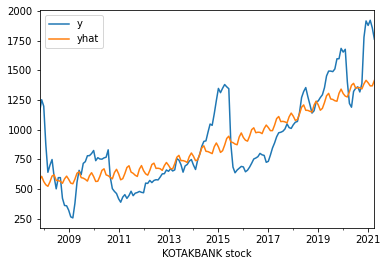

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/vnbyecli.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/cxajtbhq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=9380', 'data', 'file=/tmp/tmpj6ecp23w/vnbyecli.json', 'init=/tmp/tmpj6ecp23w/cxajtbhq.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelipu0jy6d/prophet_model-20230319093827.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 174.85670767159732
RMSE: 224.34384979496986
R-Squared: 0.6599858412426646


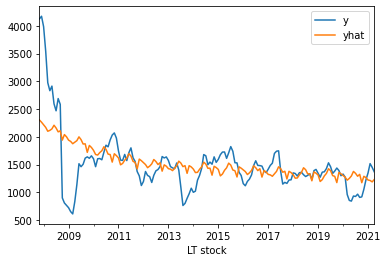

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/ch5tfll7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/ilctqt40.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=17746', 'data', 'file=/tmp/tmpj6ecp23w/ch5tfll7.json', 'init=/tmp/tmpj6ecp23w/ilctqt40.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modeljf_azhj0/prophet_model-20230319093827.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 285.9107154272752
RMSE: 452.1501675420796
R-Squared: 0.33157666335606517


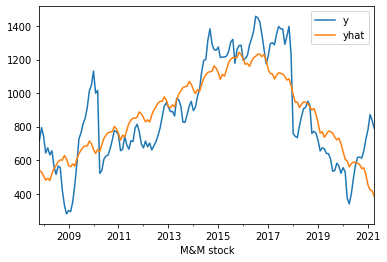

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/q9bgik2o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/hvik1lf6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54844', 'data', 'file=/tmp/tmpj6ecp23w/q9bgik2o.json', 'init=/tmp/tmpj6ecp23w/hvik1lf6.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelwfaba7_m/prophet_model-20230319093828.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 140.76212228700584
RMSE: 170.17541260887725
R-Squared: 0.672884078904975


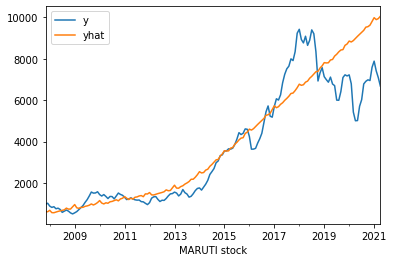

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/to_i_srs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/_t2vs42x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40304', 'data', 'file=/tmp/tmpj6ecp23w/to_i_srs.json', 'init=/tmp/tmpj6ecp23w/_t2vs42x.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelpp0z39pb/prophet_model-20230319093828.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 798.3030794918986
RMSE: 1217.1211110498748
R-Squared: 0.804604319264995


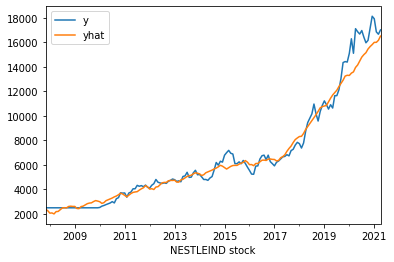

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/_i5k3wld.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/y1wyjg7v.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62036', 'data', 'file=/tmp/tmpj6ecp23w/_i5k3wld.json', 'init=/tmp/tmpj6ecp23w/y1wyjg7v.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelv4e623fg/prophet_model-20230319093829.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 469.2639979010341
RMSE: 727.5203121981779
R-Squared: 0.9706669837479833


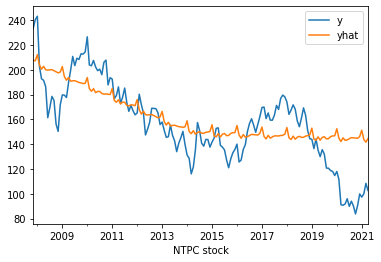

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/yvj1amjf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/mj_k7kqv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46718', 'data', 'file=/tmp/tmpj6ecp23w/yvj1amjf.json', 'init=/tmp/tmpj6ecp23w/mj_k7kqv.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelkyp5mzye/prophet_model-20230319093829.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 18.245567923136477
RMSE: 22.74049880790317
R-Squared: 0.5165791376059543


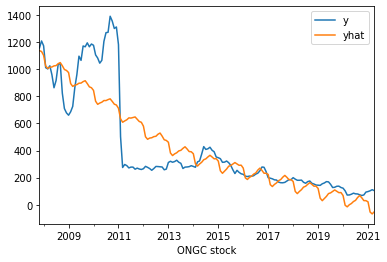

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/l1po0wfr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/o7rtkitk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=61569', 'data', 'file=/tmp/tmpj6ecp23w/l1po0wfr.json', 'init=/tmp/tmpj6ecp23w/o7rtkitk.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model9bvpj4j1/prophet_model-20230319093830.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 134.43740725578834
RMSE: 194.67798647850742
R-Squared: 0.7315713932527034


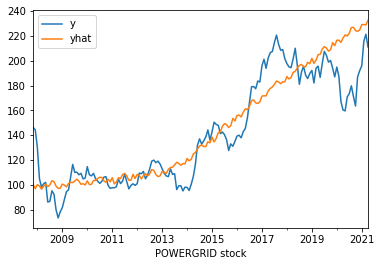

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/d0b7ab9u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/ycwziw3f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68590', 'data', 'file=/tmp/tmpj6ecp23w/d0b7ab9u.json', 'init=/tmp/tmpj6ecp23w/ycwziw3f.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelv2yro0b6/prophet_model-20230319093831.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 14.065117799627396
RMSE: 19.1738326471937
R-Squared: 0.7901044964002943


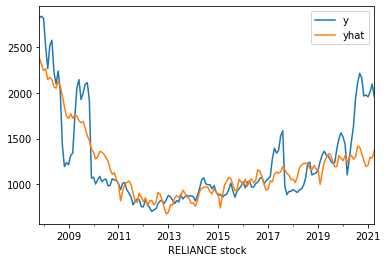

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/icwoh8sx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/qijcihbg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71966', 'data', 'file=/tmp/tmpj6ecp23w/icwoh8sx.json', 'init=/tmp/tmpj6ecp23w/qijcihbg.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelcq9em7rz/prophet_model-20230319093831.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 188.53545309550907
RMSE: 274.252245456151
R-Squared: 0.6932193833159053


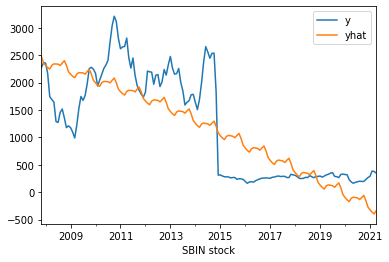

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/x0zmpuiq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/agjws3bz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79777', 'data', 'file=/tmp/tmpj6ecp23w/x0zmpuiq.json', 'init=/tmp/tmpj6ecp23w/agjws3bz.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelxm3fffwk/prophet_model-20230319093831.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 489.67399208636647
RMSE: 592.4748093270555
R-Squared: 0.6121295183609082


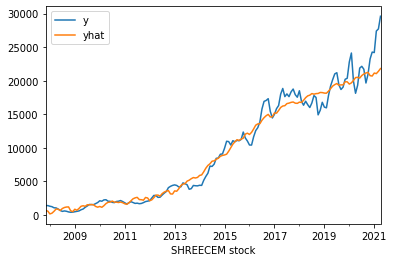

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/bx555sli.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/g6ln60xq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36241', 'data', 'file=/tmp/tmpj6ecp23w/bx555sli.json', 'init=/tmp/tmpj6ecp23w/g6ln60xq.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model8py_7unu/prophet_model-20230319093832.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 963.0140865954454
RMSE: 1492.4442015098343
R-Squared: 0.9643365447324436


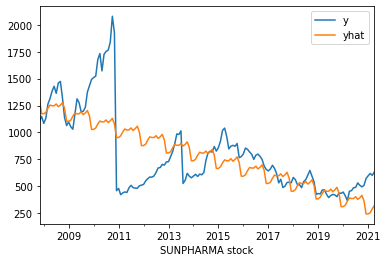

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/70wpy5xn.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/_ynfilh8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6073', 'data', 'file=/tmp/tmpj6ecp23w/70wpy5xn.json', 'init=/tmp/tmpj6ecp23w/_ynfilh8.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modela9rb3oih/prophet_model-20230319093832.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 200.42393732479314
RMSE: 278.44200771698223
R-Squared: 0.45447787655466054


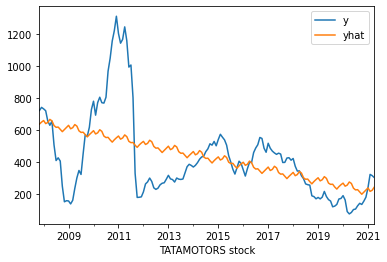

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/nphi2bjj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/mtha2g_m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=1936', 'data', 'file=/tmp/tmpj6ecp23w/nphi2bjj.json', 'init=/tmp/tmpj6ecp23w/mtha2g_m.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelwbvrcx4x/prophet_model-20230319093833.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 168.88746025545194
RMSE: 231.1746251063461
R-Squared: 0.25131431856800046


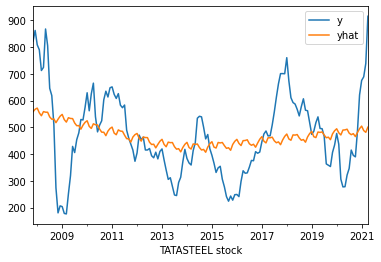

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/ogwkec5h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/rkfzmfe7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25306', 'data', 'file=/tmp/tmpj6ecp23w/ogwkec5h.json', 'init=/tmp/tmpj6ecp23w/rkfzmfe7.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelqoknuby4/prophet_model-20230319093833.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 113.60885911725946
RMSE: 143.5638926594706
R-Squared: 0.14176190102092934


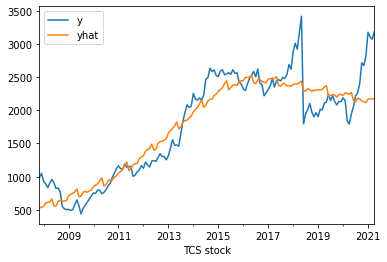

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/744ez8hy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/rdglxzzc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45206', 'data', 'file=/tmp/tmpj6ecp23w/744ez8hy.json', 'init=/tmp/tmpj6ecp23w/rdglxzzc.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model5qod1q4n/prophet_model-20230319093834.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 227.1281947074313
RMSE: 297.84509158681334
R-Squared: 0.8491313991857119


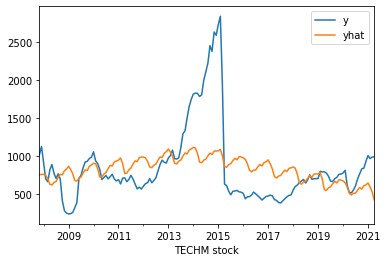

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/_dr9jkks.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/7ctc54j7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28344', 'data', 'file=/tmp/tmpj6ecp23w/_dr9jkks.json', 'init=/tmp/tmpj6ecp23w/7ctc54j7.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelz9qh8lhi/prophet_model-20230319093834.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 314.1973605430719
RMSE: 457.5373599861334
R-Squared: 0.1722630834476191


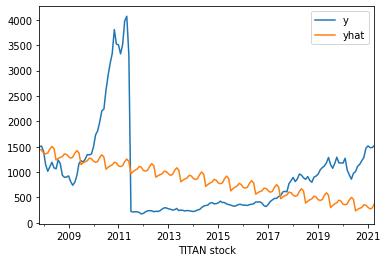

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/tcf2zj08.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/8fuiuw6j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23355', 'data', 'file=/tmp/tmpj6ecp23w/tcf2zj08.json', 'init=/tmp/tmpj6ecp23w/8fuiuw6j.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelc8teez1o/prophet_model-20230319093834.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 642.5035244436808
RMSE: 840.0059875916786
R-Squared: 0.013422607236748707


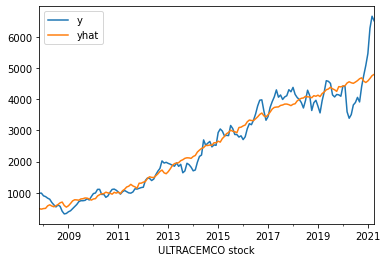

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/tiouynyz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/wndzekr9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60661', 'data', 'file=/tmp/tmpj6ecp23w/tiouynyz.json', 'init=/tmp/tmpj6ecp23w/wndzekr9.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelfn4pf2oe/prophet_model-20230319093835.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 250.8612562930138
RMSE: 380.89511533963946
R-Squared: 0.9331436206427837


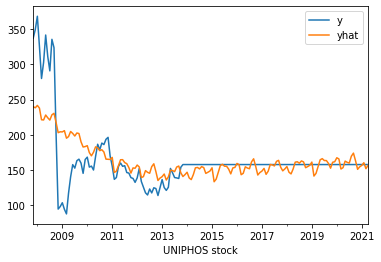

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/ifrx69ff.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/qopsbbsv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44649', 'data', 'file=/tmp/tmpj6ecp23w/ifrx69ff.json', 'init=/tmp/tmpj6ecp23w/qopsbbsv.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model_wzt1sos/prophet_model-20230319093835.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 20.18150577264639
RMSE: 35.074675236929615
R-Squared: 0.44154028291686087


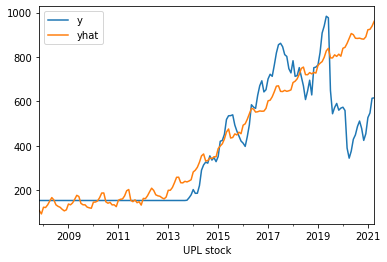

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/ue6a2xpy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/8mqmym4k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42397', 'data', 'file=/tmp/tmpj6ecp23w/ue6a2xpy.json', 'init=/tmp/tmpj6ecp23w/8mqmym4k.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_modelqkhrwr3p/prophet_model-20230319093836.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 92.0858306216811
RMSE: 151.1218866368707
R-Squared: 0.6302481732792689


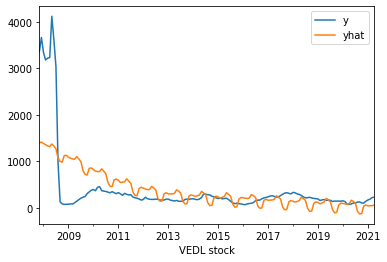

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/617q343o.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/9wv4snuj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=41955', 'data', 'file=/tmp/tmpj6ecp23w/617q343o.json', 'init=/tmp/tmpj6ecp23w/9wv4snuj.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model5qrqcopw/prophet_model-20230319093836.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 316.2628093087885
RMSE: 580.6235807236334
R-Squared: 0.39311952527209115


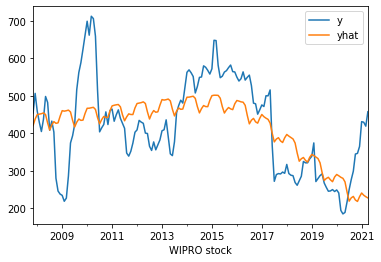

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/79yxx8jv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj6ecp23w/2hrfee8i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33399', 'data', 'file=/tmp/tmpj6ecp23w/79yxx8jv.json', 'init=/tmp/tmpj6ecp23w/2hrfee8i.json', 'output', 'file=/tmp/tmpj6ecp23w/prophet_model7gpzrr56/prophet_model-20230319093837.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:38:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:38:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Results of sklearn.metrics:
MAE: 78.05281356263608
RMSE: 97.32290084660858
R-Squared: 0.3726879548089206


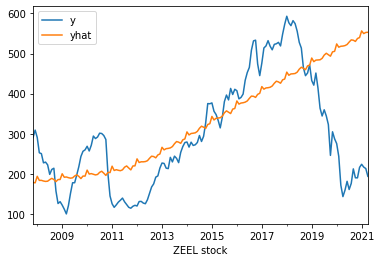

Results of sklearn.metrics:
MAE: 94.90254791324311
RMSE: 131.49743835476625
R-Squared: 0.0636551357306796


In [83]:
for i in companies:
    df1=monthly_resampled_data.reset_index()[['Date',i]].rename({'Date':'ds',i:'y'},  axis='columns')
    train = df1[( df1['ds'] >='2007-11-30' ) &(df1['ds'] <='2019-12-31' )]
    test = df1[(df1['ds'] >'2019-12-31' )]
    model = Prophet(interval_width=0.95  ,yearly_seasonality=True)
    model.fit(train)
    future = model.make_future_dataframe(periods=16,freq='M')
    forecast = model.predict(future)
    pd.concat([df1.set_index('ds')['y'],forecast.set_index('ds')['yhat']],axis=1).plot()

    mae = metrics.mean_absolute_error(df1.set_index('ds')['y'],forecast.set_index('ds')['yhat'])
    mse = metrics.mean_squared_error(df1.set_index('ds')['y'],forecast.set_index('ds')['yhat'])
    m2.append(mse)
    rmse = np.sqrt(mse)
    r2 = metrics.r2_score(df1.set_index('ds')['y'],forecast.set_index('ds')['yhat'])  

    plt.plot(df1.set_index('ds')['y'])
    plt.plot(forecast.set_index('ds')['yhat'])
    plt.xlabel(i+' stock')
    plt.show()
    print("Results of sklearn.metrics:")
    print("MAE:",mae)
    print("RMSE:", rmse)
    print("R-Squared:", r2)

In [84]:
len(monthly_resampled_data)

162

**RNN Model**

In [85]:
train_size=int(len(monthly_resampled_data)*0.7)
test_size=len(monthly_resampled_data)-train_size

In [86]:
#Converting array of values into dataset matrix
def convertTomatrix(data, step=1):
	X, Y = [] , []
	for i in range(len(data)-step-1):
		a = data[i:(i+step), 0]   ###i=0, 0,1,2,3-----99   100 
		X.append(a)
		Y.append(data[(i + step), 0])
	return np.array(X), np.array(Y)

Epoch 1/20
2/2 [==============================] - 4s 563ms/step - loss: 0.1089 - val_loss: 0.0226
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0255 - val_loss: 0.0112
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0259 - val_loss: 0.0302
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0351 - val_loss: 0.0285
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0290 - val_loss: 0.0165
Epoch 6/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0181 - val_loss: 0.0073
Epoch 7/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0141 - val_loss: 0.0058
Epoch 8/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0148 - val_loss: 0.0076
Epoch 9/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0169 - val_loss: 0.0082
Epoch 10/20
2/2 [==============================] - 0s 25ms/step - loss: 0.0170 - val_loss: 0.0068
Epoch 11/20
2/2 [===========

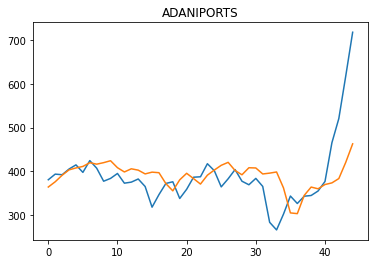

Results of sklearn.metrics:
MAE: 390.10482329944426
RMSE: 391.15879937738123
Epoch 1/20
2/2 [==============================] - 3s 379ms/step - loss: 0.0238 - val_loss: 0.0031
Epoch 2/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0173 - val_loss: 0.0225
Epoch 3/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0199 - val_loss: 0.0011
Epoch 4/20
2/2 [==============================] - 0s 27ms/step - loss: 0.0160 - val_loss: 0.0035
Epoch 5/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0179 - val_loss: 0.0014
Epoch 6/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0118 - val_loss: 0.0119
Epoch 7/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0162 - val_loss: 0.0084
Epoch 8/20
2/2 [==============================] - 0s 27ms/step - loss: 0.0125 - val_loss: 6.0036e-04
Epoch 9/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0128 - val_loss: 7.2599e-04
Epoch 10/20
2/2 [========================

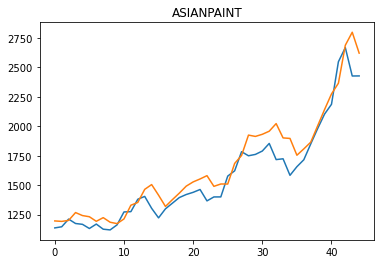

Results of sklearn.metrics:
MAE: 1654.779711106494
RMSE: 1707.9737299111025
Epoch 1/20
2/2 [==============================] - 3s 395ms/step - loss: 0.0349 - val_loss: 0.0058
Epoch 2/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0247 - val_loss: 0.0048
Epoch 3/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0207 - val_loss: 0.0065
Epoch 4/20
2/2 [==============================] - 0s 27ms/step - loss: 0.0173 - val_loss: 0.0141
Epoch 5/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0202 - val_loss: 0.0155
Epoch 6/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0199 - val_loss: 0.0096
Epoch 7/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0172 - val_loss: 0.0051
Epoch 8/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0170 - val_loss: 0.0042
Epoch 9/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0174 - val_loss: 0.0043
Epoch 10/20
2/2 [==============================] -

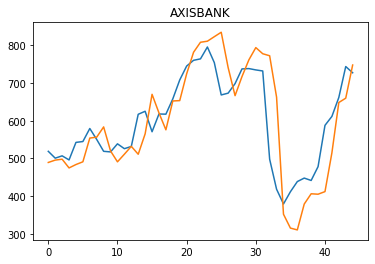

Results of sklearn.metrics:
MAE: 594.509432437788
RMSE: 612.1608178321791
Epoch 1/20
2/2 [==============================] - 3s 388ms/step - loss: 0.0415 - val_loss: 0.0333
Epoch 2/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0145 - val_loss: 0.0861
Epoch 3/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0199 - val_loss: 0.0401
Epoch 4/20
2/2 [==============================] - 0s 57ms/step - loss: 0.0056 - val_loss: 0.0119
Epoch 5/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0078 - val_loss: 0.0075
Epoch 6/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0113 - val_loss: 0.0109
Epoch 7/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0077 - val_loss: 0.0249
Epoch 8/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0049 - val_loss: 0.0464
Epoch 9/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0062 - val_loss: 0.0566
Epoch 10/20
2/2 [==============================] - 0

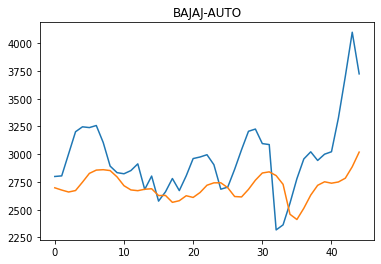

Results of sklearn.metrics:
MAE: 2706.5862288100047
RMSE: 2708.9011894746664
Epoch 1/20
2/2 [==============================] - 3s 369ms/step - loss: 0.1793 - val_loss: 2.3286
Epoch 2/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0452 - val_loss: 0.6034
Epoch 3/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0440 - val_loss: 0.1434
Epoch 4/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0512 - val_loss: 0.0781
Epoch 5/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0313 - val_loss: 0.0977
Epoch 6/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0106 - val_loss: 0.1485
Epoch 7/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0031 - val_loss: 0.1847
Epoch 8/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0057 - val_loss: 0.1708
Epoch 9/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0085 - val_loss: 0.1117
Epoch 10/20
2/2 [==============================] 

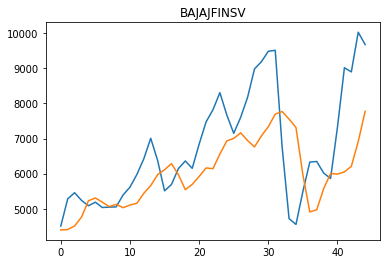

Results of sklearn.metrics:
MAE: 6013.624701969577
RMSE: 6087.358527364647
Epoch 1/20
2/2 [==============================] - 3s 395ms/step - loss: 0.1031 - val_loss: 0.0270
Epoch 2/20
2/2 [==============================] - 0s 27ms/step - loss: 0.0418 - val_loss: 0.0852
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0457 - val_loss: 0.0398
Epoch 4/20
2/2 [==============================] - 0s 27ms/step - loss: 0.0157 - val_loss: 0.0041
Epoch 5/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0120 - val_loss: 0.0084
Epoch 6/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0248 - val_loss: 0.0074
Epoch 7/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0218 - val_loss: 0.0038
Epoch 8/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0117 - val_loss: 0.0146
Epoch 9/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0116 - val_loss: 0.0300
Epoch 10/20
2/2 [==============================] - 

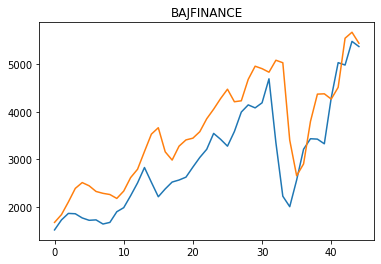

Results of sklearn.metrics:
MAE: 3589.0831419885967
RMSE: 3746.9113697691428
Epoch 1/20
2/2 [==============================] - 3s 1s/step - loss: 0.0199 - val_loss: 0.0077
Epoch 2/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0123 - val_loss: 0.0186
Epoch 3/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0176 - val_loss: 0.0086
Epoch 4/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0078 - val_loss: 0.0092
Epoch 5/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0110 - val_loss: 0.0140
Epoch 6/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0117 - val_loss: 0.0059
Epoch 7/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0071 - val_loss: 0.0073
Epoch 8/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0091 - val_loss: 0.0078
Epoch 9/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0089 - val_loss: 0.0050
Epoch 10/20
2/2 [==============================] - 0

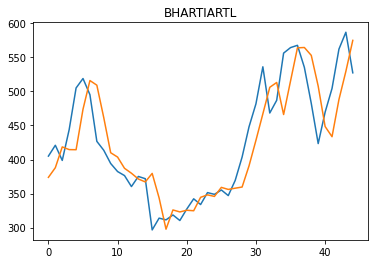

Results of sklearn.metrics:
MAE: 422.6263713192257
RMSE: 429.4411405967729
Epoch 1/20
2/2 [==============================] - 3s 386ms/step - loss: 0.1400 - val_loss: 0.0141
Epoch 2/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0262 - val_loss: 0.0618
Epoch 3/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0401 - val_loss: 0.0849
Epoch 4/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0502 - val_loss: 0.0814
Epoch 5/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0453 - val_loss: 0.0637
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0344 - val_loss: 0.0436
Epoch 7/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0271 - val_loss: 0.0266
Epoch 8/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0236 - val_loss: 0.0158
Epoch 9/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0235 - val_loss: 0.0107
Epoch 10/20
2/2 [==============================] - 

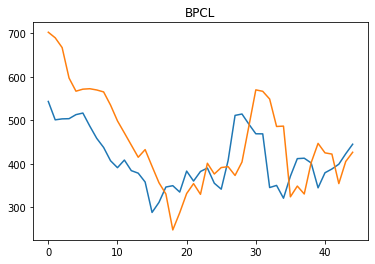

Results of sklearn.metrics:
MAE: 450.99927326949285
RMSE: 463.6646068436828
Epoch 1/20
2/2 [==============================] - 3s 393ms/step - loss: 0.0239 - val_loss: 0.0359
Epoch 2/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0072 - val_loss: 0.0681
Epoch 3/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0291 - val_loss: 0.0231
Epoch 4/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0068 - val_loss: 0.0320
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0078 - val_loss: 0.0898
Epoch 6/20
2/2 [==============================] - 0s 28ms/step - loss: 0.0144 - val_loss: 0.0468
Epoch 7/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0045 - val_loss: 0.0104
Epoch 8/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0024 - val_loss: 0.0126
Epoch 9/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0074 - val_loss: 0.0111
Epoch 10/20
2/2 [==============================] -

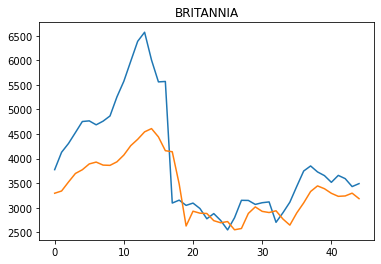

Results of sklearn.metrics:
MAE: 3384.581921708516
RMSE: 3434.5147716042948
Epoch 1/20
2/2 [==============================] - 3s 488ms/step - loss: 0.0297 - val_loss: 0.0421
Epoch 2/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0113 - val_loss: 0.0177
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0154 - val_loss: 0.0105
Epoch 4/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0057 - val_loss: 0.0217
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0091 - val_loss: 0.0230
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0058 - val_loss: 0.0055
Epoch 7/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0047 - val_loss: 0.0101
Epoch 8/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0066 - val_loss: 0.0053
Epoch 9/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0032 - val_loss: 0.0141
Epoch 10/20
2/2 [==============================] -

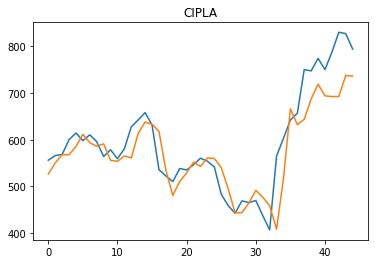

Results of sklearn.metrics:
MAE: 573.4840785322539
RMSE: 579.1599402430886
Epoch 1/20
2/2 [==============================] - 4s 405ms/step - loss: 0.1699 - val_loss: 0.0957
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0558 - val_loss: 0.1896
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0974 - val_loss: 0.1509
Epoch 4/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0484 - val_loss: 0.0792
Epoch 5/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0135 - val_loss: 0.0362
Epoch 6/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0296 - val_loss: 0.0257
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0422 - val_loss: 0.0307
Epoch 8/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0278 - val_loss: 0.0491
Epoch 9/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0127 - val_loss: 0.0752
Epoch 10/20
2/2 [==============================] - 

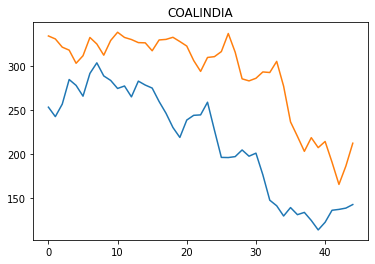

Results of sklearn.metrics:
MAE: 290.828092627888
RMSE: 294.8834520272457
Epoch 1/20
2/2 [==============================] - 3s 559ms/step - loss: 0.0354 - val_loss: 0.0376
Epoch 2/20
2/2 [==============================] - 0s 58ms/step - loss: 0.0103 - val_loss: 0.0299
Epoch 3/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0189 - val_loss: 0.0178
Epoch 4/20
2/2 [==============================] - 0s 64ms/step - loss: 0.0049 - val_loss: 0.0425
Epoch 5/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0139 - val_loss: 0.0322
Epoch 6/20
2/2 [==============================] - 0s 61ms/step - loss: 0.0061 - val_loss: 0.0183
Epoch 7/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0084 - val_loss: 0.0198
Epoch 8/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0076 - val_loss: 0.0184
Epoch 9/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0035 - val_loss: 0.0308
Epoch 10/20
2/2 [==============================] - 0

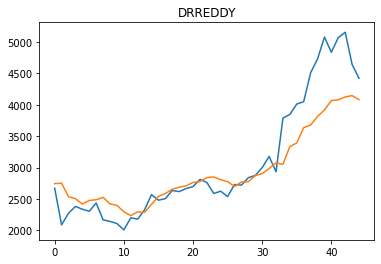

Results of sklearn.metrics:
MAE: 2937.2303704280807
RMSE: 2991.339624736157
Epoch 1/20
2/2 [==============================] - 3s 384ms/step - loss: 0.0052 - val_loss: 0.0422
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0042 - val_loss: 0.0325
Epoch 3/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0033 - val_loss: 0.0353
Epoch 4/20
2/2 [==============================] - 0s 29ms/step - loss: 0.0026 - val_loss: 0.0301
Epoch 5/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0017 - val_loss: 0.0323
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0025 - val_loss: 0.0316
Epoch 7/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0016 - val_loss: 0.0367
Epoch 8/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0018 - val_loss: 0.0354
Epoch 9/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0017 - val_loss: 0.0288
Epoch 10/20
2/2 [==============================] -

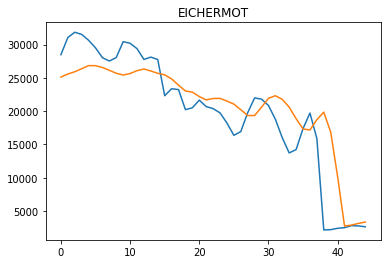

Results of sklearn.metrics:
MAE: 20843.332413383734
RMSE: 21839.337213049173
Epoch 1/20
2/2 [==============================] - 4s 559ms/step - loss: 0.1873 - val_loss: 0.0470
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0336 - val_loss: 0.0916
Epoch 3/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0523 - val_loss: 0.1164
Epoch 4/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0638 - val_loss: 0.0961
Epoch 5/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0402 - val_loss: 0.0679
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0229 - val_loss: 0.0523
Epoch 7/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0219 - val_loss: 0.0461
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0258 - val_loss: 0.0430
Epoch 9/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0249 - val_loss: 0.0411
Epoch 10/20
2/2 [==============================] 

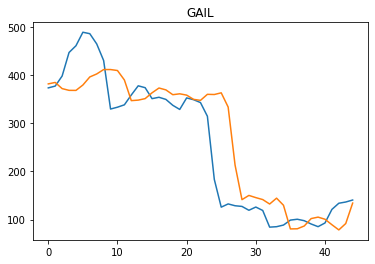

Results of sklearn.metrics:
MAE: 269.9491879289637
RMSE: 297.8381254124768
Epoch 1/20
2/2 [==============================] - 3s 373ms/step - loss: 0.7094 - val_loss: 0.0032
Epoch 2/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1607 - val_loss: 0.0270
Epoch 3/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0338 - val_loss: 0.0721
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0307 - val_loss: 0.1130
Epoch 5/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0399 - val_loss: 0.1429
Epoch 6/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0468 - val_loss: 0.1617
Epoch 7/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0492 - val_loss: 0.1708
Epoch 8/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0487 - val_loss: 0.1726
Epoch 9/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0468 - val_loss: 0.1698
Epoch 10/20
2/2 [==============================] - 

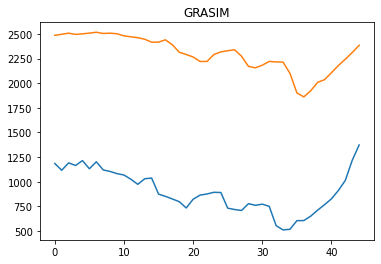

Results of sklearn.metrics:
MAE: 2302.9337057522735
RMSE: 2309.741434547144
Epoch 1/20
2/2 [==============================] - 3s 560ms/step - loss: 0.4622 - val_loss: 0.2761
Epoch 2/20
2/2 [==============================] - 0s 60ms/step - loss: 0.1766 - val_loss: 0.0486
Epoch 3/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0391 - val_loss: 0.0064
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0244 - val_loss: 0.0260
Epoch 5/20
2/2 [==============================] - 0s 75ms/step - loss: 0.0411 - val_loss: 0.0459
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0545 - val_loss: 0.0535
Epoch 7/20
2/2 [==============================] - 0s 63ms/step - loss: 0.0565 - val_loss: 0.0507
Epoch 8/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0502 - val_loss: 0.0419
Epoch 9/20
2/2 [==============================] - 0s 61ms/step - loss: 0.0401 - val_loss: 0.0308
Epoch 10/20
2/2 [==============================] -

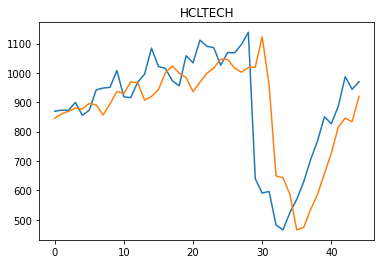

Results of sklearn.metrics:
MAE: 873.8381968495776
RMSE: 888.2633280111688
Epoch 1/20
2/2 [==============================] - 4s 1s/step - loss: 0.2500 - val_loss: 0.0388
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0421 - val_loss: 0.0634
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0973 - val_loss: 0.0945
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0954 - val_loss: 0.0460
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0534 - val_loss: 0.0129
Epoch 6/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0271 - val_loss: 0.0352
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0331 - val_loss: 0.0681
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0456 - val_loss: 0.0648
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0429 - val_loss: 0.0370
Epoch 10/20
2/2 [==============================] - 0s 

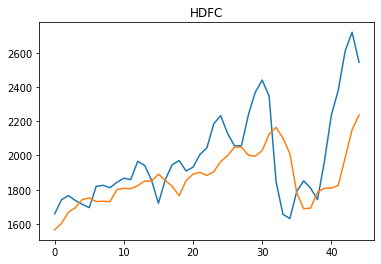

Results of sklearn.metrics:
MAE: 1870.2590224022165
RMSE: 1876.4425153968787
Epoch 1/20
2/2 [==============================] - 3s 400ms/step - loss: 0.7646 - val_loss: 0.1400
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0686 - val_loss: 0.1235
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.2211 - val_loss: 0.2052
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.2560 - val_loss: 0.1146
Epoch 5/20
2/2 [==============================] - 0s 59ms/step - loss: 0.1463 - val_loss: 0.0291
Epoch 6/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0502 - val_loss: 0.0517
Epoch 7/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0323 - val_loss: 0.1389
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0599 - val_loss: 0.1795
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0740 - val_loss: 0.1419
Epoch 10/20
2/2 [==============================] 

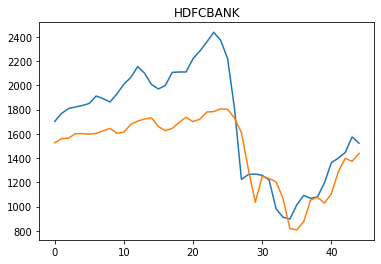

Results of sklearn.metrics:
MAE: 1466.4821886554926
RMSE: 1494.317558468864
Epoch 1/20
2/2 [==============================] - 3s 391ms/step - loss: 0.0202 - val_loss: 0.0196
Epoch 2/20
2/2 [==============================] - 0s 57ms/step - loss: 0.0225 - val_loss: 0.0421
Epoch 3/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0117 - val_loss: 0.0728
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0139 - val_loss: 0.0241
Epoch 5/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0072 - val_loss: 0.0143
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0107 - val_loss: 0.0143
Epoch 7/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0062 - val_loss: 0.0240
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0065 - val_loss: 0.0296
Epoch 9/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0076 - val_loss: 0.0184
Epoch 10/20
2/2 [==============================] -

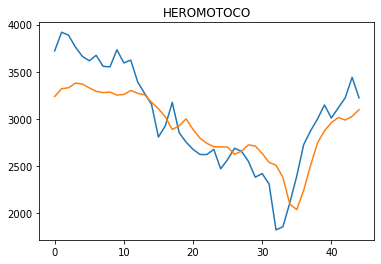

Results of sklearn.metrics:
MAE: 2915.2808279049245
RMSE: 2935.8324267297317
Epoch 1/20
2/2 [==============================] - 3s 394ms/step - loss: 0.0406 - val_loss: 0.0232
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0339 - val_loss: 0.0253
Epoch 3/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0243 - val_loss: 0.0268
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0127 - val_loss: 0.0786
Epoch 5/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0220 - val_loss: 0.0667
Epoch 6/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0160 - val_loss: 0.0265
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0097 - val_loss: 0.0160
Epoch 8/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0127 - val_loss: 0.0155
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0123 - val_loss: 0.0166
Epoch 10/20
2/2 [==============================] 

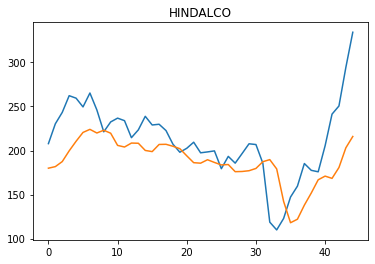

Results of sklearn.metrics:
MAE: 187.55656961090045
RMSE: 189.1510800759322
Epoch 1/20
2/2 [==============================] - 4s 404ms/step - loss: 0.2001 - val_loss: 1.1969
Epoch 2/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0389 - val_loss: 0.2298
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0349 - val_loss: 0.0309
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0534 - val_loss: 0.0161
Epoch 5/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0405 - val_loss: 0.0270
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0173 - val_loss: 0.0619
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0040 - val_loss: 0.1129
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0038 - val_loss: 0.1485
Epoch 9/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0089 - val_loss: 0.1448
Epoch 10/20
2/2 [==============================] -

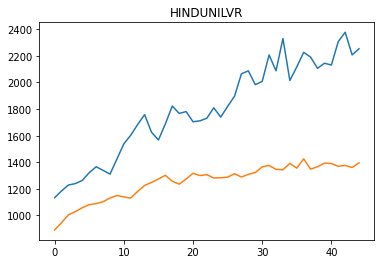

Results of sklearn.metrics:
MAE: 1252.1638154928476
RMSE: 1258.9294879336335
Epoch 1/20
2/2 [==============================] - 3s 413ms/step - loss: 0.0498 - val_loss: 0.0144
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0392 - val_loss: 0.0142
Epoch 3/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0287 - val_loss: 0.0037
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0215 - val_loss: 0.0020
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0274 - val_loss: 0.0021
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0212 - val_loss: 0.0039
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0172 - val_loss: 0.0058
Epoch 8/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0201 - val_loss: 0.0050
Epoch 9/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0176 - val_loss: 0.0029
Epoch 10/20
2/2 [==============================] 

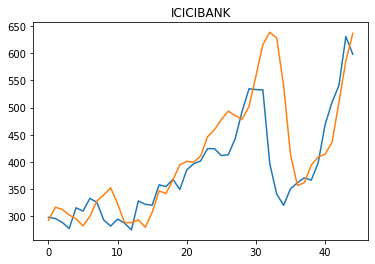

Results of sklearn.metrics:
MAE: 408.8365402267419
RMSE: 422.25197230544694
Epoch 1/20
2/2 [==============================] - 3s 415ms/step - loss: 0.2135 - val_loss: 0.2732
Epoch 2/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0240 - val_loss: 0.0301
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0456 - val_loss: 0.0612
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0639 - val_loss: 0.0477
Epoch 5/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0406 - val_loss: 0.0263
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0127 - val_loss: 0.0438
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0029 - val_loss: 0.0934
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0093 - val_loss: 0.1262
Epoch 9/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0161 - val_loss: 0.1158
Epoch 10/20
2/2 [==============================] -

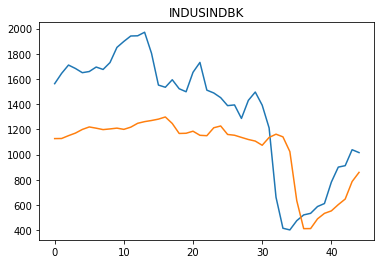

Results of sklearn.metrics:
MAE: 1048.713099332242
RMSE: 1079.986790007226
Epoch 1/20
2/2 [==============================] - 4s 438ms/step - loss: 0.0625 - val_loss: 0.0118
Epoch 2/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0200 - val_loss: 0.0225
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0332 - val_loss: 0.0181
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0263 - val_loss: 0.0096
Epoch 5/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0174 - val_loss: 0.0044
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0159 - val_loss: 0.0035
Epoch 7/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0184 - val_loss: 0.0043
Epoch 8/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0166 - val_loss: 0.0050
Epoch 9/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0124 - val_loss: 0.0052
Epoch 10/20
2/2 [==============================] - 

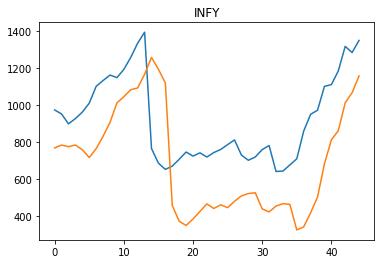

Results of sklearn.metrics:
MAE: 697.3007116760753
RMSE: 752.1292417711945
Epoch 1/20
2/2 [==============================] - 3s 397ms/step - loss: 0.4850 - val_loss: 0.0200
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0485 - val_loss: 0.0837
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0818 - val_loss: 0.1394
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1349 - val_loss: 0.1312
Epoch 5/20
2/2 [==============================] - 0s 59ms/step - loss: 0.1119 - val_loss: 0.0900
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0641 - val_loss: 0.0486
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0284 - val_loss: 0.0237
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0225 - val_loss: 0.0145
Epoch 9/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0340 - val_loss: 0.0127
Epoch 10/20
2/2 [==============================] - 

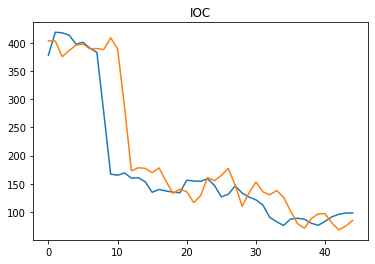

Results of sklearn.metrics:
MAE: 197.1600951486066
RMSE: 229.6275051126347
Epoch 1/20
2/2 [==============================] - 3s 400ms/step - loss: 0.1632 - val_loss: 0.1414
Epoch 2/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0975 - val_loss: 0.0967
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0503 - val_loss: 0.0288
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0632 - val_loss: 0.0292
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0499 - val_loss: 0.0427
Epoch 6/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0399 - val_loss: 0.0790
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0488 - val_loss: 0.0541
Epoch 8/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0356 - val_loss: 0.0243
Epoch 9/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0334 - val_loss: 0.0200
Epoch 10/20
2/2 [==============================] - 

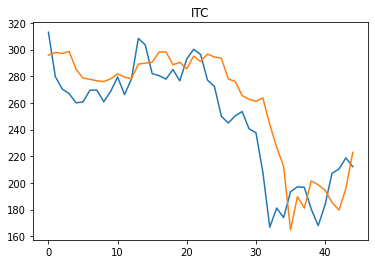

Results of sklearn.metrics:
MAE: 259.7665196353977
RMSE: 262.98296189063717
Epoch 1/20
2/2 [==============================] - 4s 1s/step - loss: 0.1482 - val_loss: 0.0045
Epoch 2/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0310 - val_loss: 0.0227
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0505 - val_loss: 0.0305
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0624 - val_loss: 0.0253
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0469 - val_loss: 0.0156
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0299 - val_loss: 0.0076
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0249 - val_loss: 0.0035
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0305 - val_loss: 0.0020
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0341 - val_loss: 0.0019
Epoch 10/20
2/2 [==============================] - 0s

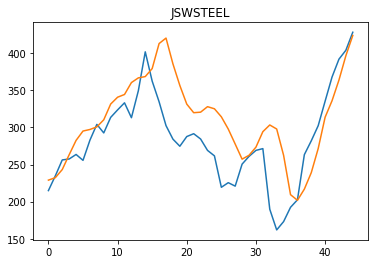

Results of sklearn.metrics:
MAE: 310.12303890693505
RMSE: 315.1109367177653
Epoch 1/20
2/2 [==============================] - 3s 412ms/step - loss: 0.0419 - val_loss: 0.0243
Epoch 2/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0153 - val_loss: 0.2724
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0445 - val_loss: 0.1013
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0079 - val_loss: 0.0136
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0219 - val_loss: 0.0132
Epoch 6/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0195 - val_loss: 0.0308
Epoch 7/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0049 - val_loss: 0.0953
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0128 - val_loss: 0.1022
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0110 - val_loss: 0.0458
Epoch 10/20
2/2 [==============================] -

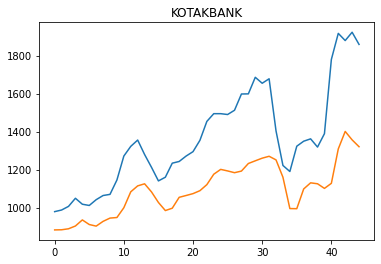

Results of sklearn.metrics:
MAE: 1093.688247971677
RMSE: 1102.1270528730643
Epoch 1/20
2/2 [==============================] - 3s 404ms/step - loss: 0.4510 - val_loss: 0.0084
Epoch 2/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0361 - val_loss: 0.1454
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1524 - val_loss: 0.1800
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1548 - val_loss: 0.0889
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0627 - val_loss: 0.0178
Epoch 6/20
2/2 [==============================] - 0s 67ms/step - loss: 0.0214 - val_loss: 0.0089
Epoch 7/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0467 - val_loss: 0.0223
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0680 - val_loss: 0.0207
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0556 - val_loss: 0.0093
Epoch 10/20
2/2 [==============================] -

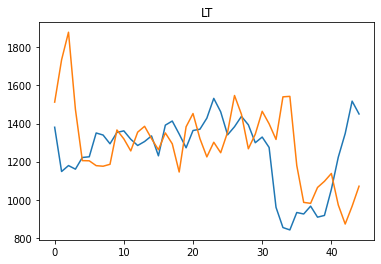

Results of sklearn.metrics:
MAE: 1290.6262927860373
RMSE: 1305.8075918141446
Epoch 1/20
2/2 [==============================] - 3s 413ms/step - loss: 0.4517 - val_loss: 0.0488
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0670 - val_loss: 0.1887
Epoch 3/20
2/2 [==============================] - 0s 33ms/step - loss: 0.1557 - val_loss: 0.2379
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1670 - val_loss: 0.1526
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0922 - val_loss: 0.0706
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0482 - val_loss: 0.0408
Epoch 7/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0464 - val_loss: 0.0447
Epoch 8/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0665 - val_loss: 0.0488
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0691 - val_loss: 0.0430
Epoch 10/20
2/2 [==============================] 

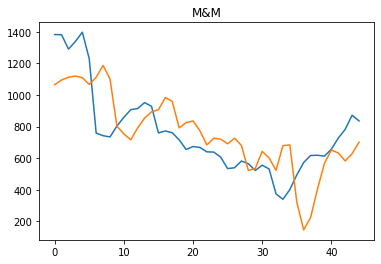

Results of sklearn.metrics:
MAE: 758.154357678985
RMSE: 795.1830632446314
Epoch 1/20
2/2 [==============================] - 4s 418ms/step - loss: 0.4443 - val_loss: 1.2198
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0568 - val_loss: 0.0267
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1017 - val_loss: 0.0688
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1349 - val_loss: 0.0545
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0825 - val_loss: 0.0122
Epoch 6/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0230 - val_loss: 0.0714
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0047 - val_loss: 0.2098
Epoch 8/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0193 - val_loss: 0.2864
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0310 - val_loss: 0.2272
Epoch 10/20
2/2 [==============================] - 0

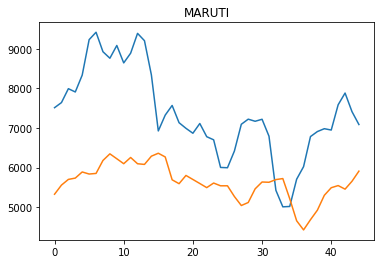

Results of sklearn.metrics:
MAE: 5630.2160898863085
RMSE: 5647.818190224979
Epoch 1/20
2/2 [==============================] - 3s 401ms/step - loss: 0.1671 - val_loss: 1.1268
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0367 - val_loss: 0.3832
Epoch 3/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0157 - val_loss: 0.2200
Epoch 4/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0290 - val_loss: 0.1959
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0308 - val_loss: 0.2203
Epoch 6/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0229 - val_loss: 0.2720
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0129 - val_loss: 0.3391
Epoch 8/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0058 - val_loss: 0.4082
Epoch 9/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0027 - val_loss: 0.4638
Epoch 10/20
2/2 [==============================] -

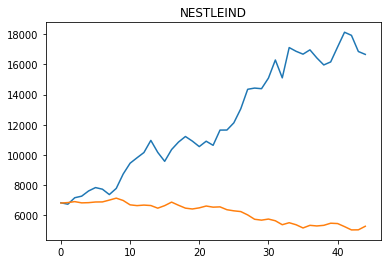

Results of sklearn.metrics:
MAE: 6180.741747721776
RMSE: 6215.624576351956
Epoch 1/20
2/2 [==============================] - 3s 505ms/step - loss: 0.3855 - val_loss: 0.0089
Epoch 2/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0150 - val_loss: 0.0697
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0641 - val_loss: 0.1202
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0991 - val_loss: 0.1200
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0880 - val_loss: 0.0922
Epoch 6/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0575 - val_loss: 0.0579
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0284 - val_loss: 0.0317
Epoch 8/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0171 - val_loss: 0.0186
Epoch 9/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0204 - val_loss: 0.0153
Epoch 10/20
2/2 [==============================] - 

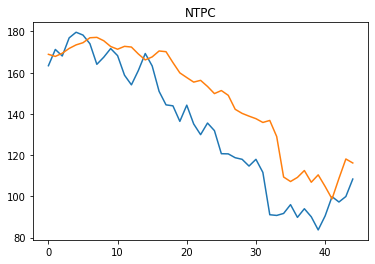

Results of sklearn.metrics:
MAE: 147.47113697061732
RMSE: 149.57530965204256
Epoch 1/20
2/2 [==============================] - 4s 434ms/step - loss: 0.3859 - val_loss: 0.0143
Epoch 2/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0447 - val_loss: 0.0661
Epoch 3/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0986 - val_loss: 0.0742
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1318 - val_loss: 0.0454
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0801 - val_loss: 0.0154
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0264 - val_loss: 0.0013
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0151 - val_loss: 0.0015
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0339 - val_loss: 0.0059
Epoch 9/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0429 - val_loss: 0.0075
Epoch 10/20
2/2 [==============================] 

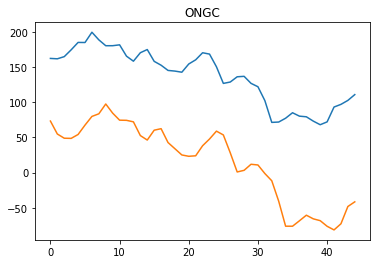

Results of sklearn.metrics:
MAE: 51.65930168742525
RMSE: 57.265336510976155
Epoch 1/20
2/2 [==============================] - 3s 415ms/step - loss: 0.1856 - val_loss: 0.3360
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0265 - val_loss: 0.0744
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0275 - val_loss: 0.0238
Epoch 4/20
2/2 [==============================] - 0s 63ms/step - loss: 0.0530 - val_loss: 0.0300
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0454 - val_loss: 0.0660
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0267 - val_loss: 0.1234
Epoch 7/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0166 - val_loss: 0.1794
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0153 - val_loss: 0.2168
Epoch 9/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0186 - val_loss: 0.2330
Epoch 10/20
2/2 [==============================] -

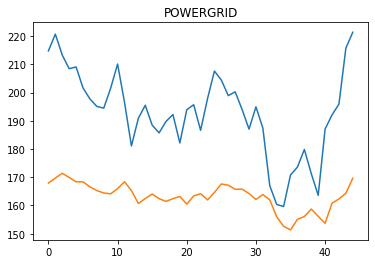

Results of sklearn.metrics:
MAE: 162.36543523363366
RMSE: 162.4311702654575
Epoch 1/20
2/2 [==============================] - 3s 413ms/step - loss: 0.1054 - val_loss: 0.0670
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0744 - val_loss: 0.0321
Epoch 3/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0217 - val_loss: 0.0358
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0279 - val_loss: 0.0629
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0391 - val_loss: 0.0305
Epoch 6/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0192 - val_loss: 0.0157
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0173 - val_loss: 0.0266
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0248 - val_loss: 0.0197
Epoch 9/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0157 - val_loss: 0.0125
Epoch 10/20
2/2 [==============================] -

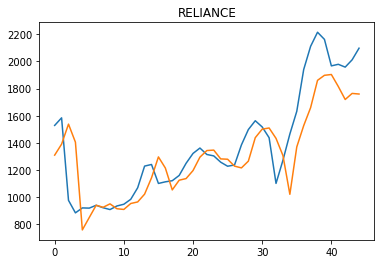

Results of sklearn.metrics:
MAE: 1305.0161079830032
RMSE: 1338.9025974280382
Epoch 1/20
2/2 [==============================] - 4s 472ms/step - loss: 0.1819 - val_loss: 0.0310
Epoch 2/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0576 - val_loss: 0.0531
Epoch 3/20
2/2 [==============================] - 0s 53ms/step - loss: 0.1081 - val_loss: 0.0285
Epoch 4/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0495 - val_loss: 0.0050
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0155 - val_loss: 3.0080e-04
Epoch 6/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0388 - val_loss: 0.0020
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0413 - val_loss: 0.0011
Epoch 8/20
2/2 [==============================] - 0s 64ms/step - loss: 0.0181 - val_loss: 2.6773e-04
Epoch 9/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0126 - val_loss: 8.4102e-04
Epoch 10/20
2/2 [====================

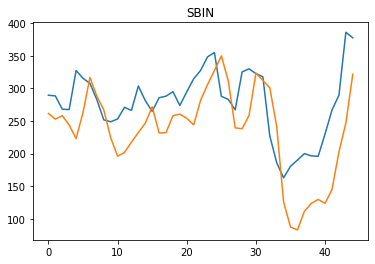

Results of sklearn.metrics:
MAE: 236.19786493497537
RMSE: 245.3142716821183
Epoch 1/20
2/2 [==============================] - 3s 405ms/step - loss: 0.0354 - val_loss: 0.0237
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0120 - val_loss: 0.0088
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0168 - val_loss: 0.0108
Epoch 4/20
2/2 [==============================] - 0s 58ms/step - loss: 0.0061 - val_loss: 0.0240
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0016 - val_loss: 0.0432
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0055 - val_loss: 0.0478
Epoch 7/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0067 - val_loss: 0.0353
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0037 - val_loss: 0.0210
Epoch 9/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0019 - val_loss: 0.0142
Epoch 10/20
2/2 [==============================] -

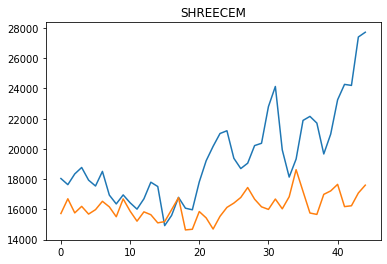

Results of sklearn.metrics:
MAE: 16194.400769510348
RMSE: 16215.50625663624
Epoch 1/20
2/2 [==============================] - 3s 379ms/step - loss: 0.0836 - val_loss: 0.0055
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0253 - val_loss: 0.0270
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0371 - val_loss: 0.0323
Epoch 4/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0410 - val_loss: 0.0215
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0302 - val_loss: 0.0093
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0201 - val_loss: 0.0025
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0197 - val_loss: 0.0012
Epoch 8/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0223 - val_loss: 0.0021
Epoch 9/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0233 - val_loss: 0.0025
Epoch 10/20
2/2 [==============================] -

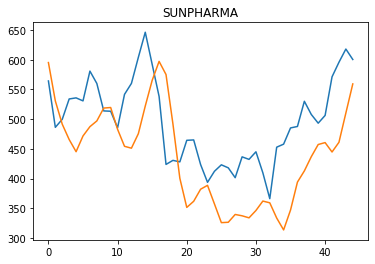

Results of sklearn.metrics:
MAE: 438.58311278294417
RMSE: 445.93664163459374
Epoch 1/20
2/2 [==============================] - 3s 397ms/step - loss: 0.9230 - val_loss: 0.0341
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.2391 - val_loss: 0.0519
Epoch 3/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0758 - val_loss: 0.1649
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1380 - val_loss: 0.2333
Epoch 5/20
2/2 [==============================] - 0s 54ms/step - loss: 0.1924 - val_loss: 0.2287
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1786 - val_loss: 0.1803
Epoch 7/20
2/2 [==============================] - 0s 34ms/step - loss: 0.1297 - val_loss: 0.1202
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0822 - val_loss: 0.0699
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0674 - val_loss: 0.0364
Epoch 10/20
2/2 [==============================] 

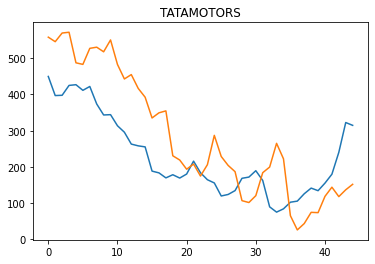

Results of sklearn.metrics:
MAE: 285.62375543764534
RMSE: 332.9271021735784
Epoch 1/20
2/2 [==============================] - 4s 467ms/step - loss: 0.1097 - val_loss: 0.1302
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1262 - val_loss: 0.0242
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0199 - val_loss: 0.0783
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0551 - val_loss: 0.0722
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0326 - val_loss: 0.0091
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0138 - val_loss: 0.0293
Epoch 7/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0340 - val_loss: 0.0214
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0195 - val_loss: 0.0095
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0106 - val_loss: 0.0310
Epoch 10/20
2/2 [==============================] -

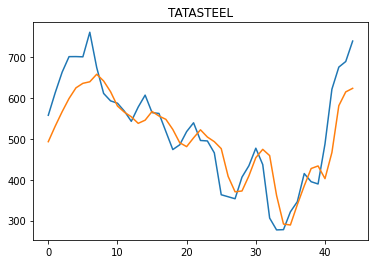

Results of sklearn.metrics:
MAE: 501.8926646851199
RMSE: 510.874441249613
Epoch 1/20
2/2 [==============================] - 3s 420ms/step - loss: 0.9942 - val_loss: 1.2213
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.4570 - val_loss: 0.3474
Epoch 3/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1024 - val_loss: 0.0226
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0550 - val_loss: 0.0673
Epoch 5/20
2/2 [==============================] - 0s 53ms/step - loss: 0.1230 - val_loss: 0.1279
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1583 - val_loss: 0.1292
Epoch 7/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1448 - val_loss: 0.0904
Epoch 8/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1026 - val_loss: 0.0415
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0553 - val_loss: 0.0172
Epoch 10/20
2/2 [==============================] - 0

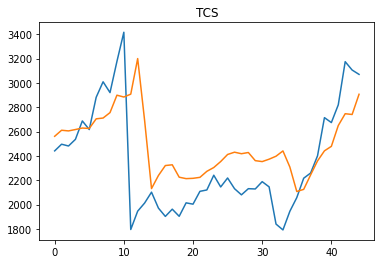

Results of sklearn.metrics:
MAE: 2487.5539285983377
RMSE: 2499.7102342935614
Epoch 1/20
2/2 [==============================] - 3s 405ms/step - loss: 0.2230 - val_loss: 0.0117
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0595 - val_loss: 0.0878
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1096 - val_loss: 0.0686
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0797 - val_loss: 0.0193
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0307 - val_loss: 0.0020
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0268 - val_loss: 0.0122
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0432 - val_loss: 0.0148
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0355 - val_loss: 0.0065
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0187 - val_loss: 0.0022
Epoch 10/20
2/2 [==============================] 

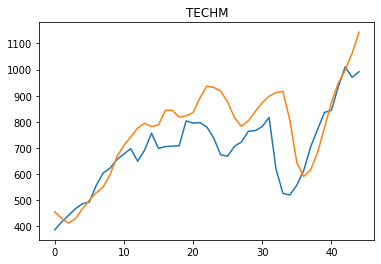

Results of sklearn.metrics:
MAE: 762.7677232601889
RMSE: 782.4634514647076
Epoch 1/20
2/2 [==============================] - 4s 446ms/step - loss: 0.0773 - val_loss: 0.0017
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0296 - val_loss: 0.0234
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0345 - val_loss: 0.0352
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0331 - val_loss: 0.0280
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0267 - val_loss: 0.0162
Epoch 6/20
2/2 [==============================] - 0s 58ms/step - loss: 0.0210 - val_loss: 0.0077
Epoch 7/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0203 - val_loss: 0.0037
Epoch 8/20
2/2 [==============================] - 0s 58ms/step - loss: 0.0207 - val_loss: 0.0029
Epoch 9/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0216 - val_loss: 0.0029
Epoch 10/20
2/2 [==============================] - 

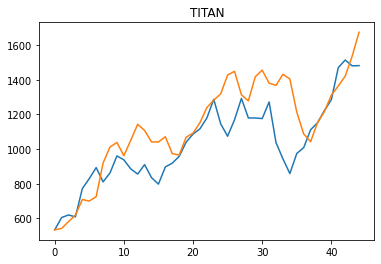

Results of sklearn.metrics:
MAE: 1129.7749005327992
RMSE: 1162.8502719345038
Epoch 1/20
2/2 [==============================] - 3s 407ms/step - loss: 0.0274 - val_loss: 0.0196
Epoch 2/20
2/2 [==============================] - 0s 56ms/step - loss: 0.0255 - val_loss: 0.0148
Epoch 3/20
2/2 [==============================] - 0s 61ms/step - loss: 0.0047 - val_loss: 0.0865
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0124 - val_loss: 0.0696
Epoch 5/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0074 - val_loss: 0.0155
Epoch 6/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0033 - val_loss: 0.0122
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0074 - val_loss: 0.0106
Epoch 8/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0039 - val_loss: 0.0180
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0024 - val_loss: 0.0338
Epoch 10/20
2/2 [==============================] 

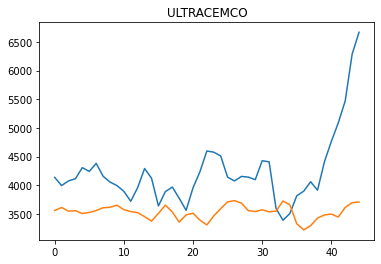

Results of sklearn.metrics:
MAE: 3534.5720232065282
RMSE: 3536.5414944384397
Epoch 1/20
2/2 [==============================] - 3s 439ms/step - loss: 0.0280 - val_loss: 0.0235
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0220 - val_loss: 0.0020
Epoch 3/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0079 - val_loss: 0.0044
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0143 - val_loss: 0.0023
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0086 - val_loss: 0.0015
Epoch 6/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0084 - val_loss: 0.0057
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0107 - val_loss: 0.0015
Epoch 8/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0070 - val_loss: 8.4922e-04
Epoch 9/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0073 - val_loss: 0.0028
Epoch 10/20
2/2 [============================

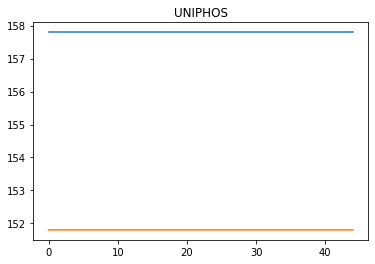

Results of sklearn.metrics:
MAE: 151.55247611469701
RMSE: 151.5524761146978
Epoch 1/20
2/2 [==============================] - 4s 454ms/step - loss: 0.0270 - val_loss: 0.0214
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0084 - val_loss: 0.0342
Epoch 3/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0050 - val_loss: 0.0375
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0051 - val_loss: 0.0279
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0068 - val_loss: 0.0235
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0046 - val_loss: 0.0216
Epoch 7/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0020 - val_loss: 0.0203
Epoch 8/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0021 - val_loss: 0.0185
Epoch 9/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0030 - val_loss: 0.0174
Epoch 10/20
2/2 [==============================] -

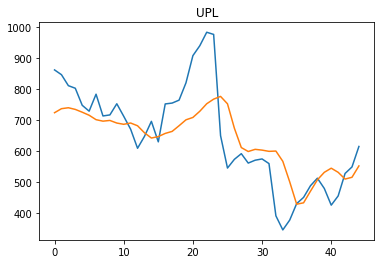

Results of sklearn.metrics:
MAE: 637.3695473294732
RMSE: 644.0993347075347
Epoch 1/20
2/2 [==============================] - 3s 434ms/step - loss: 0.0394 - val_loss: 0.0048
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0185 - val_loss: 0.0073
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0136 - val_loss: 0.0023
Epoch 4/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0097 - val_loss: 3.1143e-04
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0089 - val_loss: 0.0025
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0109 - val_loss: 0.0037
Epoch 7/20
2/2 [==============================] - 0s 66ms/step - loss: 0.0115 - val_loss: 0.0024
Epoch 8/20
2/2 [==============================] - 0s 64ms/step - loss: 0.0102 - val_loss: 8.4673e-04
Epoch 9/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0090 - val_loss: 6.3694e-04
Epoch 10/20
2/2 [======================

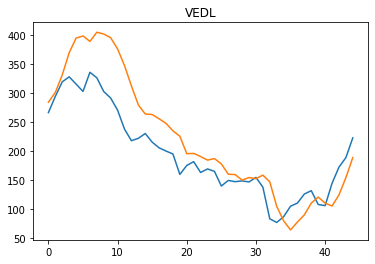

Results of sklearn.metrics:
MAE: 222.6592165036621
RMSE: 245.78394486925063
Epoch 1/20
2/2 [==============================] - 3s 388ms/step - loss: 0.0820 - val_loss: 0.0420
Epoch 2/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0449 - val_loss: 0.0773
Epoch 3/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0648 - val_loss: 0.0505
Epoch 4/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0327 - val_loss: 0.0185
Epoch 5/20
2/2 [==============================] - 0s 56ms/step - loss: 0.0183 - val_loss: 0.0063
Epoch 6/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0298 - val_loss: 0.0052
Epoch 7/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0327 - val_loss: 0.0061
Epoch 8/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0220 - val_loss: 0.0115
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0165 - val_loss: 0.0198
Epoch 10/20
2/2 [==============================] -

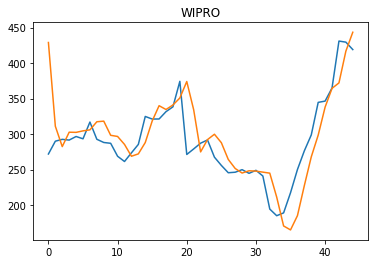

Results of sklearn.metrics:
MAE: 296.29524574886517
RMSE: 302.1996458847257
Epoch 1/20
2/2 [==============================] - 3s 396ms/step - loss: 0.5048 - val_loss: 0.4116
Epoch 2/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1179 - val_loss: 0.1206
Epoch 3/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0427 - val_loss: 0.0676
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0664 - val_loss: 0.0721
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0871 - val_loss: 0.0723
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0803 - val_loss: 0.0691
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0596 - val_loss: 0.0707
Epoch 8/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0410 - val_loss: 0.0780
Epoch 9/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0310 - val_loss: 0.0879
Epoch 10/20
2/2 [==============================] -

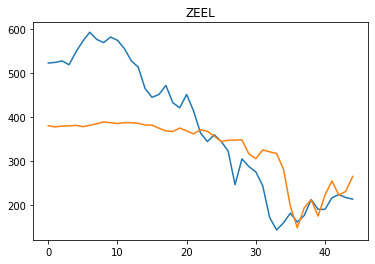

Results of sklearn.metrics:
MAE: 328.45787990969103
RMSE: 335.55415902705596


In [87]:
for i in companies:
    scaler=MinMaxScaler(feature_range=(0,1))
    df1=scaler.fit_transform(np.array(monthly_resampled_data[i]).reshape(-1,1))

    train_data ,test_data = df1[0:train_size] ,df1[train_size:(train_size+test_size)]
    
    step = 3
    X_train, y_train = convertTomatrix(train_data, step)
    X_test, ytest = convertTomatrix(test_data, step)

    model=Sequential()
    model.add(SimpleRNN(50,return_sequences=True,input_shape=(3,1)))
    model.add(SimpleRNN(25,return_sequences=True))
    model.add(SimpleRNN(10,return_sequences=True))
    model.add(SimpleRNN(5))
    model.add(Dense(1))

    model.compile(loss='mean_squared_error',optimizer='adam')   
    model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=20,batch_size=64,verbose=1)
    train_predict=model.predict(X_train)
    test_predict=model.predict(X_test)

    train_predict=scaler.inverse_transform(train_predict)
    test_predict=scaler.inverse_transform(test_predict)
    mae = metrics.mean_absolute_error(ytest,test_predict)
    mse = metrics.mean_squared_error(ytest,test_predict)
    m3.append(mse)
    rmse = np.sqrt(mse)  

    plt.title(i)
    plt.plot(scaler.inverse_transform(ytest.reshape(len(test_predict),1))) 
    plt.plot(test_predict)
    plt.show()

    print("Results of sklearn.metrics:")
    print("MAE:",mae)
    print("RMSE:", rmse)



**LSTM Model**

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0749 - val_loss: 0.0777
Epoch 2/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0725 - val_loss: 0.0742
Epoch 3/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0698 - val_loss: 0.0707
Epoch 4/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0673 - val_loss: 0.0672
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0649 - val_loss: 0.0636
Epoch 6/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0624 - val_loss: 0.0600
Epoch 7/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0599 - val_loss: 0.0564
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0574 - val_loss: 0.0527
Epoch 9/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0549 - val_loss: 0.0490
Epoch 10/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0525 - val_loss: 0.0451
Epoch 11/20
2/2 [==============

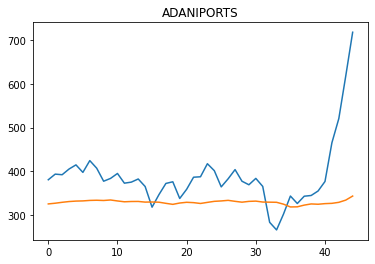

Results of sklearn.metrics:
MAE: 328.9764724693661
RMSE: 329.00257223661265
Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1864 - val_loss: 0.0730
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1801 - val_loss: 0.0687
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1745 - val_loss: 0.0644
Epoch 4/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1687 - val_loss: 0.0602
Epoch 5/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1634 - val_loss: 0.0560
Epoch 6/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1574 - val_loss: 0.0519
Epoch 7/20
2/2 [==============================] - 0s 70ms/step - loss: 0.1518 - val_loss: 0.0477
Epoch 8/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1462 - val_loss: 0.0435
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1403 - val_loss: 0.0394
Epoch 10/20
2/2 [==============================] - 0s

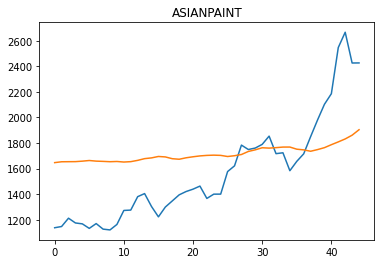

Results of sklearn.metrics:
MAE: 1714.4486021655216
RMSE: 1715.483193797836
Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.1945 - val_loss: 0.0290
Epoch 2/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1892 - val_loss: 0.0271
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1842 - val_loss: 0.0251
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1788 - val_loss: 0.0232
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1734 - val_loss: 0.0213
Epoch 6/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1677 - val_loss: 0.0194
Epoch 7/20
2/2 [==============================] - 0s 55ms/step - loss: 0.1619 - val_loss: 0.0175
Epoch 8/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1559 - val_loss: 0.0157
Epoch 9/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1498 - val_loss: 0.0138
Epoch 10/20
2/2 [==============================] - 0s

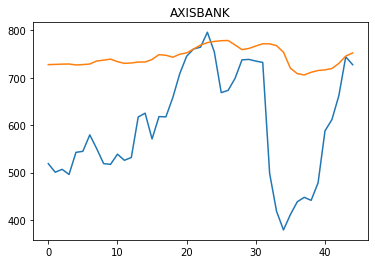

Results of sklearn.metrics:
MAE: 742.6894712290206
RMSE: 742.9656871692155
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1710 - val_loss: 0.4754
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1636 - val_loss: 0.4605
Epoch 3/20
2/2 [==============================] - 0s 33ms/step - loss: 0.1561 - val_loss: 0.4453
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1485 - val_loss: 0.4295
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1409 - val_loss: 0.4131
Epoch 6/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1329 - val_loss: 0.3959
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1251 - val_loss: 0.3778
Epoch 8/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1170 - val_loss: 0.3586
Epoch 9/20
2/2 [==============================] - 0s 32ms/step - loss: 0.1083 - val_loss: 0.3382
Epoch 10/20
2/2 [==============================] - 0s 

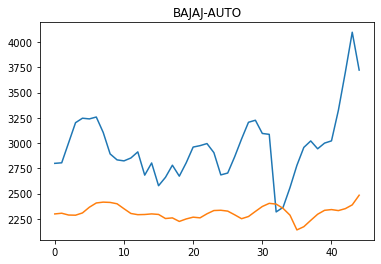

Results of sklearn.metrics:
MAE: 2312.9010508586157
RMSE: 2313.8117251386466
Epoch 1/20
2/2 [==============================] - 7s 2s/step - loss: 0.0125 - val_loss: 0.4576
Epoch 2/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0114 - val_loss: 0.4463
Epoch 3/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0103 - val_loss: 0.4350
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0093 - val_loss: 0.4237
Epoch 5/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0084 - val_loss: 0.4123
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0077 - val_loss: 0.4008
Epoch 7/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0070 - val_loss: 0.3893
Epoch 8/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0064 - val_loss: 0.3780
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0061 - val_loss: 0.3666
Epoch 10/20
2/2 [==============================] - 0

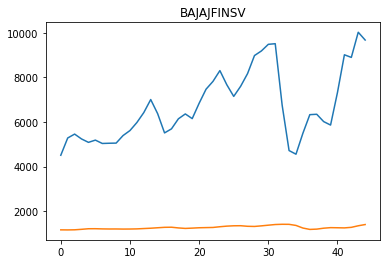

Results of sklearn.metrics:
MAE: 1259.9389787707923
RMSE: 1261.9050586045892
Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.0724 - val_loss: 0.0871
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0690 - val_loss: 0.0817
Epoch 3/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0659 - val_loss: 0.0764
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0627 - val_loss: 0.0711
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0597 - val_loss: 0.0658
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0568 - val_loss: 0.0604
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0543 - val_loss: 0.0551
Epoch 8/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0513 - val_loss: 0.0499
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0485 - val_loss: 0.0448
Epoch 10/20
2/2 [==============================] - 0

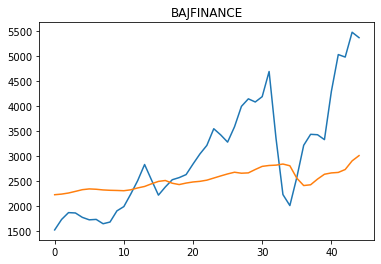

Results of sklearn.metrics:
MAE: 2529.4114378870345
RMSE: 2536.9798816178954
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.0954 - val_loss: 0.0675
Epoch 2/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0920 - val_loss: 0.0640
Epoch 3/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0890 - val_loss: 0.0606
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0860 - val_loss: 0.0573
Epoch 5/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0828 - val_loss: 0.0539
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0798 - val_loss: 0.0505
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0765 - val_loss: 0.0472
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0734 - val_loss: 0.0438
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0702 - val_loss: 0.0403
Epoch 10/20
2/2 [==============================] - 0

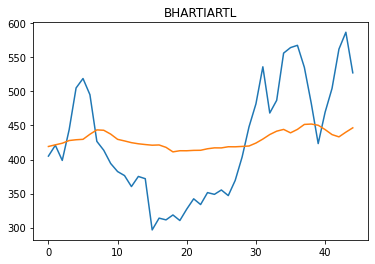

Results of sklearn.metrics:
MAE: 428.7134081302066
RMSE: 428.87343950980835
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.2217 - val_loss: 0.0398
Epoch 2/20
2/2 [==============================] - 0s 33ms/step - loss: 0.2167 - val_loss: 0.0376
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.2113 - val_loss: 0.0354
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.2060 - val_loss: 0.0332
Epoch 5/20
2/2 [==============================] - 0s 33ms/step - loss: 0.2004 - val_loss: 0.0310
Epoch 6/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1946 - val_loss: 0.0288
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1889 - val_loss: 0.0266
Epoch 8/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1827 - val_loss: 0.0243
Epoch 9/20
2/2 [==============================] - 0s 34ms/step - loss: 0.1761 - val_loss: 0.0221
Epoch 10/20
2/2 [==============================] - 0s

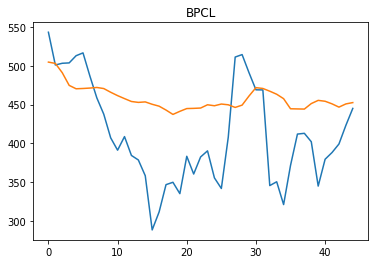

Results of sklearn.metrics:
MAE: 457.81795104455796
RMSE: 458.0590779907131
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0505 - val_loss: 0.3531
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0483 - val_loss: 0.3447
Epoch 3/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0460 - val_loss: 0.3362
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0438 - val_loss: 0.3274
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0416 - val_loss: 0.3183
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0395 - val_loss: 0.3088
Epoch 7/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0372 - val_loss: 0.2988
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0351 - val_loss: 0.2883
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0329 - val_loss: 0.2773
Epoch 10/20
2/2 [==============================] - 0s

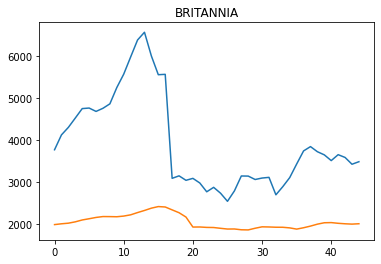

Results of sklearn.metrics:
MAE: 2060.9627376807393
RMSE: 2067.0997910090286
Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1313 - val_loss: 0.3451
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1264 - val_loss: 0.3349
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1215 - val_loss: 0.3245
Epoch 4/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1163 - val_loss: 0.3137
Epoch 5/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1110 - val_loss: 0.3024
Epoch 6/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1058 - val_loss: 0.2905
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1002 - val_loss: 0.2779
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0947 - val_loss: 0.2646
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0886 - val_loss: 0.2505
Epoch 10/20
2/2 [==============================] - 0

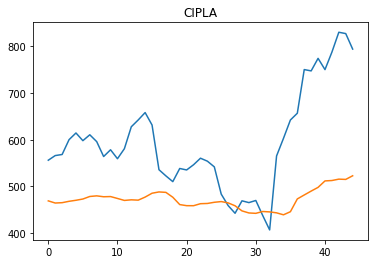

Results of sklearn.metrics:
MAE: 471.880202799832
RMSE: 472.3192908547391
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.5150 - val_loss: 0.1370
Epoch 2/20
2/2 [==============================] - 0s 42ms/step - loss: 0.5043 - val_loss: 0.1324
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.4937 - val_loss: 0.1279
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.4830 - val_loss: 0.1233
Epoch 5/20
2/2 [==============================] - 0s 45ms/step - loss: 0.4720 - val_loss: 0.1187
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.4607 - val_loss: 0.1140
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.4488 - val_loss: 0.1092
Epoch 8/20
2/2 [==============================] - 0s 43ms/step - loss: 0.4363 - val_loss: 0.1042
Epoch 9/20
2/2 [==============================] - 0s 45ms/step - loss: 0.4233 - val_loss: 0.0990
Epoch 10/20
2/2 [==============================] - 0s 3

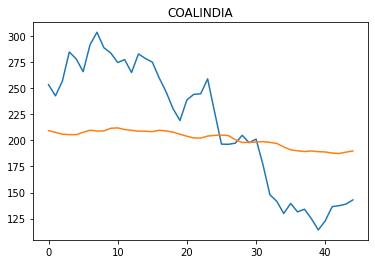

Results of sklearn.metrics:
MAE: 201.3035812482222
RMSE: 201.44952584579633
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1543 - val_loss: 0.3374
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1477 - val_loss: 0.3258
Epoch 3/20
2/2 [==============================] - 0s 34ms/step - loss: 0.1414 - val_loss: 0.3140
Epoch 4/20
2/2 [==============================] - 0s 34ms/step - loss: 0.1346 - val_loss: 0.3018
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1277 - val_loss: 0.2891
Epoch 6/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1210 - val_loss: 0.2759
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1139 - val_loss: 0.2621
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.1068 - val_loss: 0.2475
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0993 - val_loss: 0.2322
Epoch 10/20
2/2 [==============================] - 0s

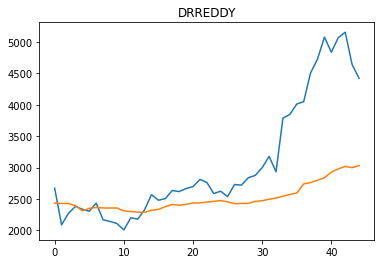

Results of sklearn.metrics:
MAE: 2510.6553161746083
RMSE: 2519.513032376614
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0992 - val_loss: 0.4621
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0955 - val_loss: 0.4494
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0919 - val_loss: 0.4365
Epoch 4/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0883 - val_loss: 0.4233
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0850 - val_loss: 0.4096
Epoch 6/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0816 - val_loss: 0.3955
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0781 - val_loss: 0.3808
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0746 - val_loss: 0.3655
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0714 - val_loss: 0.3493
Epoch 10/20
2/2 [==============================] - 0s

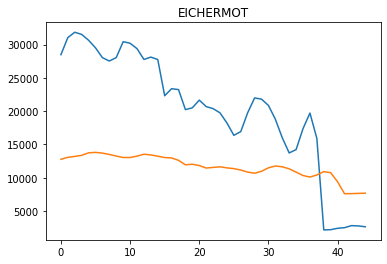

Results of sklearn.metrics:
MAE: 11662.15952926915
RMSE: 11783.749483632999
Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.5183 - val_loss: 0.2718
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.5084 - val_loss: 0.2661
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.4984 - val_loss: 0.2603
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.4881 - val_loss: 0.2543
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.4776 - val_loss: 0.2482
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.4665 - val_loss: 0.2419
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.4550 - val_loss: 0.2353
Epoch 8/20
2/2 [==============================] - 0s 37ms/step - loss: 0.4431 - val_loss: 0.2285
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.4304 - val_loss: 0.2212
Epoch 10/20
2/2 [==============================] - 0s

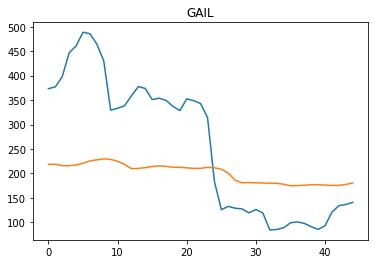

Results of sklearn.metrics:
MAE: 200.44320343189335
RMSE: 201.33057797213783
Epoch 1/20
2/2 [==============================] - 9s 2s/step - loss: 0.2963 - val_loss: 0.0095
Epoch 2/20
2/2 [==============================] - 0s 56ms/step - loss: 0.2881 - val_loss: 0.0084
Epoch 3/20
2/2 [==============================] - 0s 51ms/step - loss: 0.2793 - val_loss: 0.0073
Epoch 4/20
2/2 [==============================] - 0s 61ms/step - loss: 0.2707 - val_loss: 0.0063
Epoch 5/20
2/2 [==============================] - 0s 56ms/step - loss: 0.2616 - val_loss: 0.0053
Epoch 6/20
2/2 [==============================] - 0s 76ms/step - loss: 0.2519 - val_loss: 0.0044
Epoch 7/20
2/2 [==============================] - 0s 54ms/step - loss: 0.2420 - val_loss: 0.0037
Epoch 8/20
2/2 [==============================] - 0s 52ms/step - loss: 0.2309 - val_loss: 0.0030
Epoch 9/20
2/2 [==============================] - 0s 86ms/step - loss: 0.2197 - val_loss: 0.0026
Epoch 10/20
2/2 [==============================] - 0

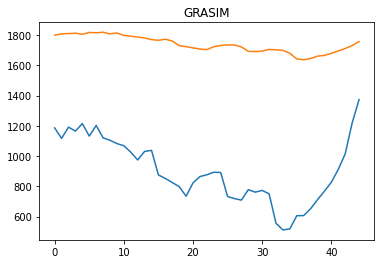

Results of sklearn.metrics:
MAE: 1739.27605601269
RMSE: 1740.1068711736941
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1478 - val_loss: 0.1811
Epoch 2/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1441 - val_loss: 0.1761
Epoch 3/20
2/2 [==============================] - 0s 57ms/step - loss: 0.1404 - val_loss: 0.1709
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1366 - val_loss: 0.1656
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1327 - val_loss: 0.1600
Epoch 6/20
2/2 [==============================] - 0s 76ms/step - loss: 0.1285 - val_loss: 0.1542
Epoch 7/20
2/2 [==============================] - 0s 66ms/step - loss: 0.1243 - val_loss: 0.1481
Epoch 8/20
2/2 [==============================] - 0s 55ms/step - loss: 0.1196 - val_loss: 0.1417
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1150 - val_loss: 0.1349
Epoch 10/20
2/2 [==============================] - 0s 

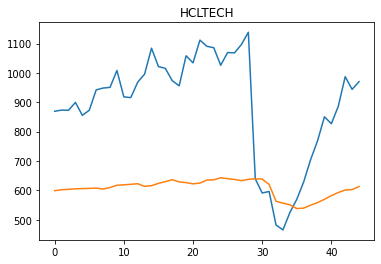

Results of sklearn.metrics:
MAE: 606.8398753163748
RMSE: 607.5247907953009
Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1736 - val_loss: 0.3380
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1696 - val_loss: 0.3305
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1659 - val_loss: 0.3226
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1617 - val_loss: 0.3146
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1575 - val_loss: 0.3063
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1537 - val_loss: 0.2975
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1493 - val_loss: 0.2883
Epoch 8/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1449 - val_loss: 0.2786
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1400 - val_loss: 0.2683
Epoch 10/20
2/2 [==============================] - 0s 

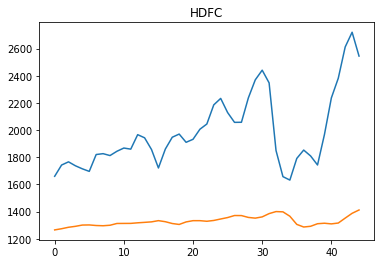

Results of sklearn.metrics:
MAE: 1327.6672282398904
RMSE: 1328.1155598492091
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.1929 - val_loss: 0.4398
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1895 - val_loss: 0.4331
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1858 - val_loss: 0.4262
Epoch 4/20
2/2 [==============================] - 0s 61ms/step - loss: 0.1820 - val_loss: 0.4190
Epoch 5/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1782 - val_loss: 0.4115
Epoch 6/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1742 - val_loss: 0.4036
Epoch 7/20
2/2 [==============================] - 0s 54ms/step - loss: 0.1703 - val_loss: 0.3953
Epoch 8/20
2/2 [==============================] - 0s 54ms/step - loss: 0.1658 - val_loss: 0.3865
Epoch 9/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1615 - val_loss: 0.3770
Epoch 10/20
2/2 [==============================] - 0

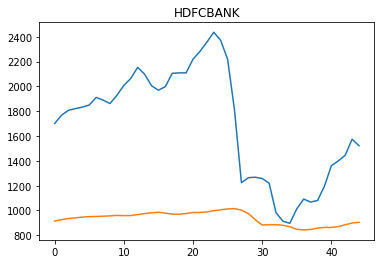

Results of sklearn.metrics:
MAE: 935.5685411945553
RMSE: 936.9371639861694
Epoch 1/20
2/2 [==============================] - 10s 1s/step - loss: 0.2113 - val_loss: 0.5327
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.2048 - val_loss: 0.5202
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1983 - val_loss: 0.5074
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1913 - val_loss: 0.4943
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1847 - val_loss: 0.4807
Epoch 6/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1777 - val_loss: 0.4664
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1701 - val_loss: 0.4514
Epoch 8/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1630 - val_loss: 0.4355
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1549 - val_loss: 0.4186
Epoch 10/20
2/2 [==============================] - 0s

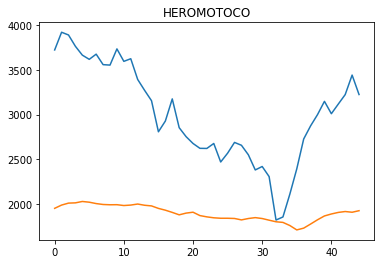

Results of sklearn.metrics:
MAE: 1902.1673594804454
RMSE: 1903.983277547571
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0999 - val_loss: 0.3008
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0954 - val_loss: 0.2918
Epoch 3/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0910 - val_loss: 0.2828
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0866 - val_loss: 0.2736
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0819 - val_loss: 0.2642
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0775 - val_loss: 0.2545
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0730 - val_loss: 0.2444
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0683 - val_loss: 0.2339
Epoch 9/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0636 - val_loss: 0.2230
Epoch 10/20
2/2 [==============================] - 0s

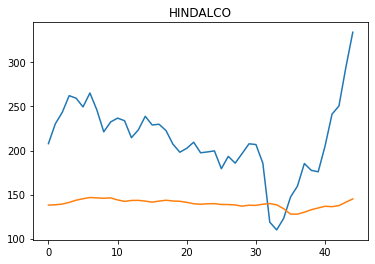

Results of sklearn.metrics:
MAE: 139.12458668039915
RMSE: 139.19305895949788
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0303 - val_loss: 0.5378
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0288 - val_loss: 0.5287
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0274 - val_loss: 0.5194
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0260 - val_loss: 0.5099
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0245 - val_loss: 0.4999
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0231 - val_loss: 0.4897
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0218 - val_loss: 0.4789
Epoch 8/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0205 - val_loss: 0.4677
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0192 - val_loss: 0.4560
Epoch 10/20
2/2 [==============================] - 0

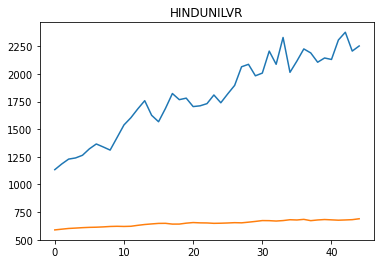

Results of sklearn.metrics:
MAE: 647.4447942254864
RMSE: 648.0112415216032
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.2095 - val_loss: 0.0168
Epoch 2/20
2/2 [==============================] - 0s 52ms/step - loss: 0.2021 - val_loss: 0.0149
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1948 - val_loss: 0.0130
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1872 - val_loss: 0.0113
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1796 - val_loss: 0.0097
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1716 - val_loss: 0.0082
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1636 - val_loss: 0.0068
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1556 - val_loss: 0.0057
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1471 - val_loss: 0.0046
Epoch 10/20
2/2 [==============================] - 0s 

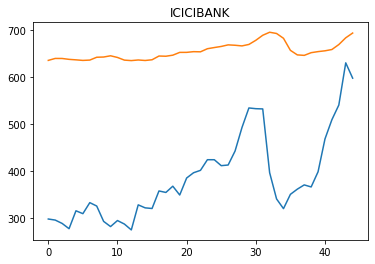

Results of sklearn.metrics:
MAE: 655.1800677875059
RMSE: 655.4163407869577
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.0793 - val_loss: 0.5052
Epoch 2/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0755 - val_loss: 0.4919
Epoch 3/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0718 - val_loss: 0.4784
Epoch 4/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0683 - val_loss: 0.4646
Epoch 5/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0646 - val_loss: 0.4504
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0606 - val_loss: 0.4360
Epoch 7/20
2/2 [==============================] - 0s 56ms/step - loss: 0.0575 - val_loss: 0.4207
Epoch 8/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0541 - val_loss: 0.4048
Epoch 9/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0506 - val_loss: 0.3881
Epoch 10/20
2/2 [==============================] - 0s 

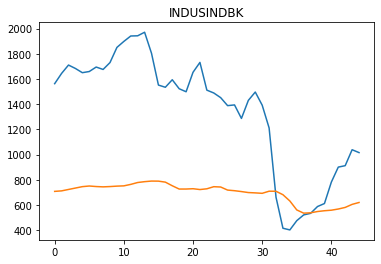

Results of sklearn.metrics:
MAE: 694.0129833654453
RMSE: 698.1037194313777
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.2575 - val_loss: 0.0091
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2506 - val_loss: 0.0082
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2434 - val_loss: 0.0073
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2361 - val_loss: 0.0064
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2285 - val_loss: 0.0057
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2210 - val_loss: 0.0051
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2130 - val_loss: 0.0046
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2047 - val_loss: 0.0042
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1960 - val_loss: 0.0040
Epoch 10/20
2/2 [==============================] - 0s 

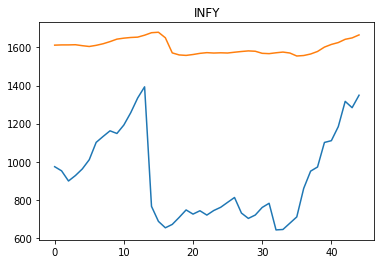

Results of sklearn.metrics:
MAE: 1602.7611575039832
RMSE: 1603.1867854884842
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.2631 - val_loss: 0.0644
Epoch 2/20
2/2 [==============================] - 0s 43ms/step - loss: 0.2524 - val_loss: 0.0609
Epoch 3/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2419 - val_loss: 0.0575
Epoch 4/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2313 - val_loss: 0.0542
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2202 - val_loss: 0.0509
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2090 - val_loss: 0.0478
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1972 - val_loss: 0.0447
Epoch 8/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1846 - val_loss: 0.0417
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1717 - val_loss: 0.0389
Epoch 10/20
2/2 [==============================] - 0

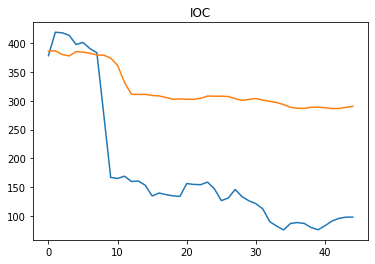

Results of sklearn.metrics:
MAE: 319.7158736520245
RMSE: 321.6404328495563
Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.3071 - val_loss: 0.1950
Epoch 2/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2980 - val_loss: 0.1875
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.2893 - val_loss: 0.1799
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.2799 - val_loss: 0.1723
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.2709 - val_loss: 0.1645
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2613 - val_loss: 0.1565
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2514 - val_loss: 0.1483
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2409 - val_loss: 0.1397
Epoch 9/20
2/2 [==============================] - 0s 43ms/step - loss: 0.2302 - val_loss: 0.1308
Epoch 10/20
2/2 [==============================] - 0s 

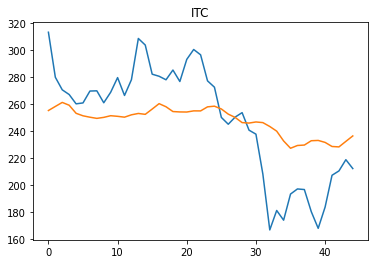

Results of sklearn.metrics:
MAE: 246.89174614364418
RMSE: 247.09725439067333
Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.2496 - val_loss: 0.0057
Epoch 2/20
2/2 [==============================] - 0s 51ms/step - loss: 0.2395 - val_loss: 0.0045
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2297 - val_loss: 0.0035
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2195 - val_loss: 0.0026
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.2091 - val_loss: 0.0019
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1985 - val_loss: 0.0015
Epoch 7/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1874 - val_loss: 0.0014
Epoch 8/20
2/2 [==============================] - 0s 60ms/step - loss: 0.1759 - val_loss: 0.0015
Epoch 9/20
2/2 [==============================] - 0s 77ms/step - loss: 0.1642 - val_loss: 0.0021
Epoch 10/20
2/2 [==============================] - 0

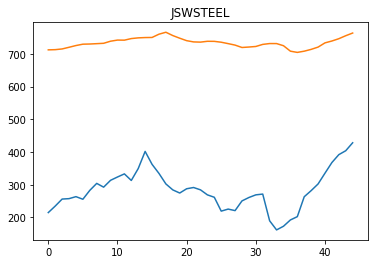

Results of sklearn.metrics:
MAE: 733.8150734799602
RMSE: 733.9677902518249
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0874 - val_loss: 0.4481
Epoch 2/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0835 - val_loss: 0.4374
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0798 - val_loss: 0.4264
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0760 - val_loss: 0.4152
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0721 - val_loss: 0.4035
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0681 - val_loss: 0.3913
Epoch 7/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0641 - val_loss: 0.3785
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0600 - val_loss: 0.3650
Epoch 9/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0560 - val_loss: 0.3507
Epoch 10/20
2/2 [==============================] - 0s 

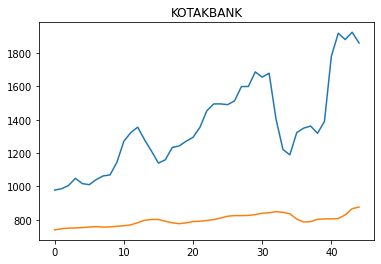

Results of sklearn.metrics:
MAE: 797.3050421340033
RMSE: 797.9977040382144
Epoch 1/20
2/2 [==============================] - 9s 2s/step - loss: 0.0833 - val_loss: 0.0326
Epoch 2/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0796 - val_loss: 0.0302
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0760 - val_loss: 0.0278
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0723 - val_loss: 0.0254
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0685 - val_loss: 0.0230
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0646 - val_loss: 0.0207
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0608 - val_loss: 0.0183
Epoch 8/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0568 - val_loss: 0.0160
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0527 - val_loss: 0.0137
Epoch 10/20
2/2 [==============================] - 0s 

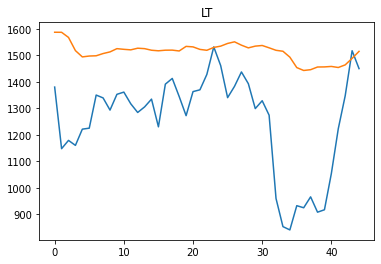

Results of sklearn.metrics:
MAE: 1512.7751887278773
RMSE: 1513.1503913895967
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.3437 - val_loss: 0.2131
Epoch 2/20
2/2 [==============================] - 0s 51ms/step - loss: 0.3364 - val_loss: 0.2076
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.3291 - val_loss: 0.2021
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.3217 - val_loss: 0.1964
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.3141 - val_loss: 0.1907
Epoch 6/20
2/2 [==============================] - 0s 41ms/step - loss: 0.3063 - val_loss: 0.1847
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.2983 - val_loss: 0.1786
Epoch 8/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2898 - val_loss: 0.1722
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.2810 - val_loss: 0.1655
Epoch 10/20
2/2 [==============================] - 0

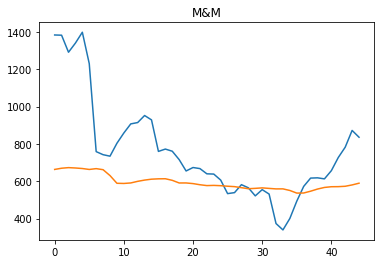

Results of sklearn.metrics:
MAE: 593.4591438524877
RMSE: 594.7463066815178
Epoch 1/20
2/2 [==============================] - 8s 3s/step - loss: 0.0571 - val_loss: 0.5977
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0549 - val_loss: 0.5863
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0526 - val_loss: 0.5746
Epoch 4/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0504 - val_loss: 0.5625
Epoch 5/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0481 - val_loss: 0.5498
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0458 - val_loss: 0.5365
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0436 - val_loss: 0.5226
Epoch 8/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0412 - val_loss: 0.5078
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0391 - val_loss: 0.4920
Epoch 10/20
2/2 [==============================] - 0s 

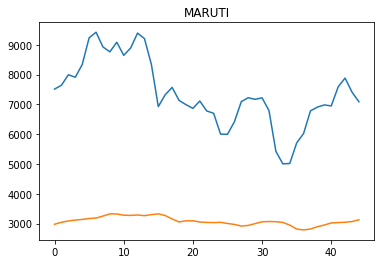

Results of sklearn.metrics:
MAE: 3081.9047617613087
RMSE: 3085.0470866488154
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0238 - val_loss: 0.4294
Epoch 2/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0216 - val_loss: 0.4163
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0193 - val_loss: 0.4030
Epoch 4/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0174 - val_loss: 0.3894
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0156 - val_loss: 0.3755
Epoch 6/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0139 - val_loss: 0.3613
Epoch 7/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0123 - val_loss: 0.3467
Epoch 8/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0111 - val_loss: 0.3319
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0100 - val_loss: 0.3170
Epoch 10/20
2/2 [==============================] - 0

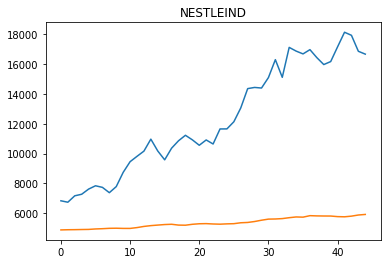

Results of sklearn.metrics:
MAE: 5349.50933669747
RMSE: 5359.667098706843
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.2840 - val_loss: 0.1258
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.2717 - val_loss: 0.1187
Epoch 3/20
2/2 [==============================] - 0s 47ms/step - loss: 0.2592 - val_loss: 0.1116
Epoch 4/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2465 - val_loss: 0.1046
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.2342 - val_loss: 0.0975
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.2207 - val_loss: 0.0903
Epoch 7/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2071 - val_loss: 0.0831
Epoch 8/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1932 - val_loss: 0.0758
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1784 - val_loss: 0.0685
Epoch 10/20
2/2 [==============================] - 0s 4

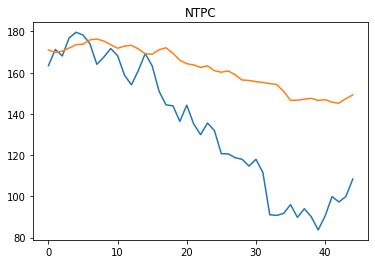

Results of sklearn.metrics:
MAE: 161.61790210733608
RMSE: 161.9355518610809
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.2083 - val_loss: 0.0029
Epoch 2/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2027 - val_loss: 0.0023
Epoch 3/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1971 - val_loss: 0.0018
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1919 - val_loss: 0.0014
Epoch 5/20
2/2 [==============================] - 0s 54ms/step - loss: 0.1860 - val_loss: 0.0011
Epoch 6/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1804 - val_loss: 9.3130e-04
Epoch 7/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1743 - val_loss: 8.6238e-04
Epoch 8/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1680 - val_loss: 9.4341e-04
Epoch 9/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1617 - val_loss: 0.0012
Epoch 10/20
2/2 [========================

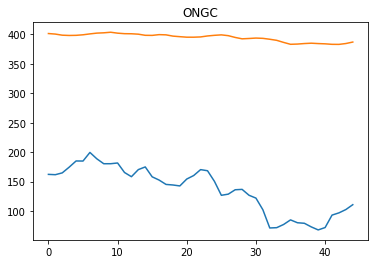

Results of sklearn.metrics:
MAE: 394.41942090693937
RMSE: 394.47247937638576
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1168 - val_loss: 0.6446
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1116 - val_loss: 0.6286
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1064 - val_loss: 0.6121
Epoch 4/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1012 - val_loss: 0.5950
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0962 - val_loss: 0.5771
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0905 - val_loss: 0.5585
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0854 - val_loss: 0.5387
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0800 - val_loss: 0.5176
Epoch 9/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0742 - val_loss: 0.4951
Epoch 10/20
2/2 [==============================] - 0

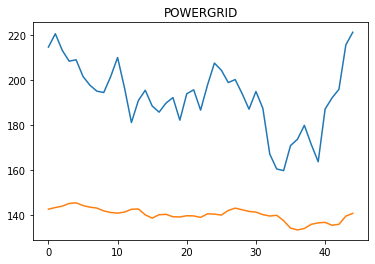

Results of sklearn.metrics:
MAE: 139.20963960646353
RMSE: 139.23852169467963
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0837 - val_loss: 0.1310
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0818 - val_loss: 0.1280
Epoch 3/20
2/2 [==============================] - 0s 57ms/step - loss: 0.0797 - val_loss: 0.1249
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0780 - val_loss: 0.1218
Epoch 5/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0761 - val_loss: 0.1187
Epoch 6/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0742 - val_loss: 0.1154
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0722 - val_loss: 0.1120
Epoch 8/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0701 - val_loss: 0.1085
Epoch 9/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0681 - val_loss: 0.1049
Epoch 10/20
2/2 [==============================] - 0

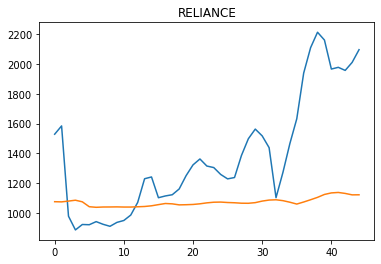

Results of sklearn.metrics:
MAE: 1071.1706896887322
RMSE: 1071.5087969221029
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.2999 - val_loss: 0.0013
Epoch 2/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2941 - val_loss: 9.9671e-04
Epoch 3/20
2/2 [==============================] - 0s 49ms/step - loss: 0.2882 - val_loss: 7.1948e-04
Epoch 4/20
2/2 [==============================] - 0s 49ms/step - loss: 0.2823 - val_loss: 5.0278e-04
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.2759 - val_loss: 3.5436e-04
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.2694 - val_loss: 2.8332e-04
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.2626 - val_loss: 3.0228e-04
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.2554 - val_loss: 4.2714e-04
Epoch 9/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2478 - val_loss: 6.7810e-04
Epoch 10/20
2/2 [===

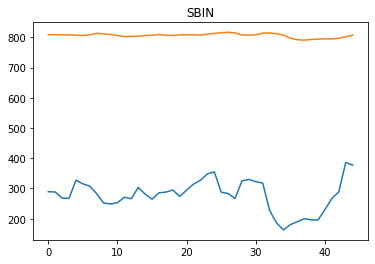

Results of sklearn.metrics:
MAE: 806.4781872006002
RMSE: 806.5041526910538
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.0533 - val_loss: 0.4211
Epoch 2/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0501 - val_loss: 0.4074
Epoch 3/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0471 - val_loss: 0.3934
Epoch 4/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0443 - val_loss: 0.3789
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0413 - val_loss: 0.3640
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0385 - val_loss: 0.3484
Epoch 7/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0361 - val_loss: 0.3322
Epoch 8/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0336 - val_loss: 0.3154
Epoch 9/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0311 - val_loss: 0.2980
Epoch 10/20
2/2 [==============================] - 0s 

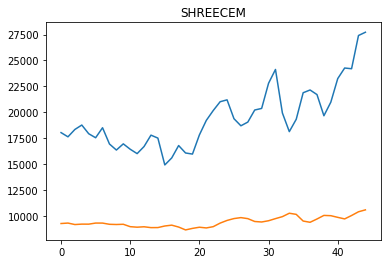

Results of sklearn.metrics:
MAE: 9429.65174607285
RMSE: 9441.175991728245
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1552 - val_loss: 0.0062
Epoch 2/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1492 - val_loss: 0.0051
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1436 - val_loss: 0.0041
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1374 - val_loss: 0.0032
Epoch 5/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1313 - val_loss: 0.0025
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1252 - val_loss: 0.0020
Epoch 7/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1189 - val_loss: 0.0017
Epoch 8/20
2/2 [==============================] - 0s 66ms/step - loss: 0.1122 - val_loss: 0.0016
Epoch 9/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1058 - val_loss: 0.0017
Epoch 10/20
2/2 [==============================] - 0s 6

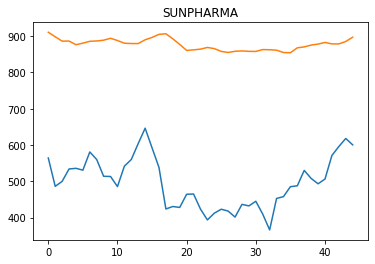

Results of sklearn.metrics:
MAE: 876.8124829001316
RMSE: 876.943107261154
Epoch 1/20
2/2 [==============================] - 7s 2s/step - loss: 0.1672 - val_loss: 0.0219
Epoch 2/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1630 - val_loss: 0.0206
Epoch 3/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1586 - val_loss: 0.0193
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1546 - val_loss: 0.0179
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1501 - val_loss: 0.0167
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1457 - val_loss: 0.0154
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1412 - val_loss: 0.0142
Epoch 8/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1365 - val_loss: 0.0130
Epoch 9/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1313 - val_loss: 0.0118
Epoch 10/20
2/2 [==============================] - 0s 3

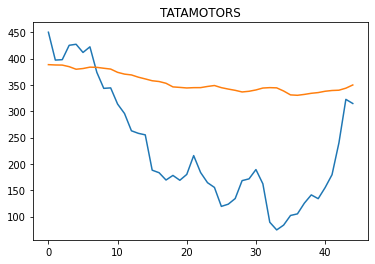

Results of sklearn.metrics:
MAE: 354.3114724515342
RMSE: 354.7872391703063
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.1607 - val_loss: 0.2401
Epoch 2/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1551 - val_loss: 0.2328
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1496 - val_loss: 0.2255
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1445 - val_loss: 0.2182
Epoch 5/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1389 - val_loss: 0.2107
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1336 - val_loss: 0.2031
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1279 - val_loss: 0.1952
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1221 - val_loss: 0.1870
Epoch 9/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1164 - val_loss: 0.1784
Epoch 10/20
2/2 [==============================] - 0s 

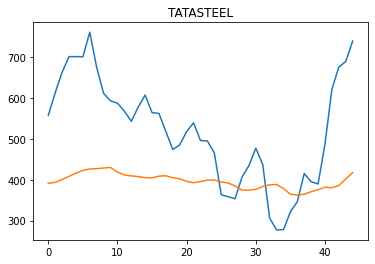

Results of sklearn.metrics:
MAE: 396.10747520486814
RMSE: 396.5050374910736
Epoch 1/20
2/2 [==============================] - 7s 2s/step - loss: 0.1948 - val_loss: 0.4233
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1886 - val_loss: 0.4121
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1824 - val_loss: 0.4007
Epoch 4/20
2/2 [==============================] - 0s 52ms/step - loss: 0.1765 - val_loss: 0.3891
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1702 - val_loss: 0.3772
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1641 - val_loss: 0.3648
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1575 - val_loss: 0.3519
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1508 - val_loss: 0.3384
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1435 - val_loss: 0.3242
Epoch 10/20
2/2 [==============================] - 0s

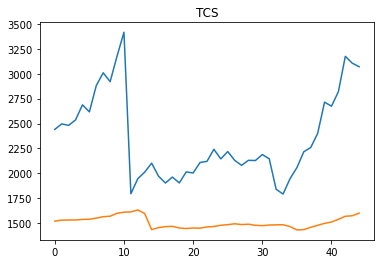

Results of sklearn.metrics:
MAE: 1508.2030469794142
RMSE: 1509.1910579806067
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1184 - val_loss: 0.0309
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1152 - val_loss: 0.0290
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1122 - val_loss: 0.0272
Epoch 4/20
2/2 [==============================] - 0s 52ms/step - loss: 0.1091 - val_loss: 0.0253
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1060 - val_loss: 0.0234
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1027 - val_loss: 0.0216
Epoch 7/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0996 - val_loss: 0.0197
Epoch 8/20
2/2 [==============================] - 0s 57ms/step - loss: 0.0964 - val_loss: 0.0179
Epoch 9/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0930 - val_loss: 0.0161
Epoch 10/20
2/2 [==============================] - 0

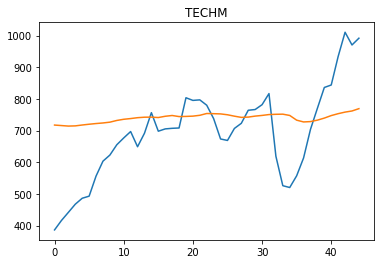

Results of sklearn.metrics:
MAE: 739.9406168691298
RMSE: 740.0579071630966
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.1010 - val_loss: 0.0488
Epoch 2/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0985 - val_loss: 0.0459
Epoch 3/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0957 - val_loss: 0.0431
Epoch 4/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0934 - val_loss: 0.0403
Epoch 5/20
2/2 [==============================] - 0s 56ms/step - loss: 0.0908 - val_loss: 0.0375
Epoch 6/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0883 - val_loss: 0.0348
Epoch 7/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0858 - val_loss: 0.0320
Epoch 8/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0832 - val_loss: 0.0292
Epoch 9/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0805 - val_loss: 0.0264
Epoch 10/20
2/2 [==============================] - 0s 

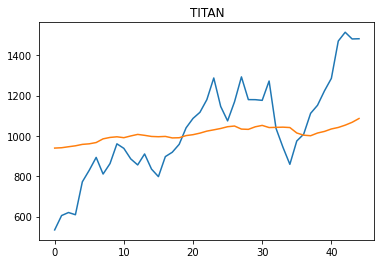

Results of sklearn.metrics:
MAE: 1010.7688526269831
RMSE: 1011.3432926273896
Epoch 1/20
2/2 [==============================] - 9s 3s/step - loss: 0.0749 - val_loss: 0.3831
Epoch 2/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0723 - val_loss: 0.3757
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0698 - val_loss: 0.3682
Epoch 4/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0673 - val_loss: 0.3604
Epoch 5/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0648 - val_loss: 0.3524
Epoch 6/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0622 - val_loss: 0.3442
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0597 - val_loss: 0.3356
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0570 - val_loss: 0.3266
Epoch 9/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0543 - val_loss: 0.3172
Epoch 10/20
2/2 [==============================] - 0

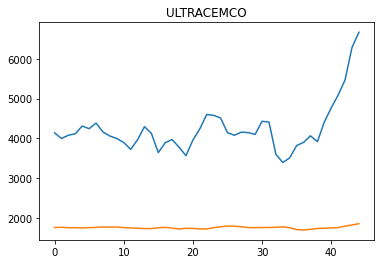

Results of sklearn.metrics:
MAE: 1754.109859578055
RMSE: 1754.3305922037766
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0978 - val_loss: 0.0599
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0950 - val_loss: 0.0572
Epoch 3/20
2/2 [==============================] - 0s 63ms/step - loss: 0.0921 - val_loss: 0.0547
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0893 - val_loss: 0.0521
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0865 - val_loss: 0.0495
Epoch 6/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0836 - val_loss: 0.0468
Epoch 7/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0807 - val_loss: 0.0441
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0778 - val_loss: 0.0414
Epoch 9/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0746 - val_loss: 0.0386
Epoch 10/20
2/2 [==============================] - 0s

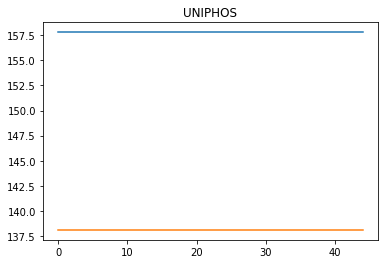

Results of sklearn.metrics:
MAE: 137.85082002745742
RMSE: 137.85082002745744
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.0561 - val_loss: 0.3888
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0541 - val_loss: 0.3789
Epoch 3/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0524 - val_loss: 0.3690
Epoch 4/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0505 - val_loss: 0.3591
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0489 - val_loss: 0.3488
Epoch 6/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0473 - val_loss: 0.3384
Epoch 7/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0459 - val_loss: 0.3277
Epoch 8/20
2/2 [==============================] - 0s 58ms/step - loss: 0.0444 - val_loss: 0.3169
Epoch 9/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0430 - val_loss: 0.3058
Epoch 10/20
2/2 [==============================] - 0

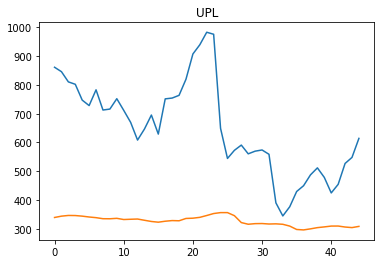

Results of sklearn.metrics:
MAE: 325.92088739023706
RMSE: 326.3221389612178
Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.0393 - val_loss: 9.8526e-04
Epoch 2/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0384 - val_loss: 7.4328e-04
Epoch 3/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0377 - val_loss: 5.5340e-04
Epoch 4/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0369 - val_loss: 4.2192e-04
Epoch 5/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0360 - val_loss: 3.4741e-04
Epoch 6/20
2/2 [==============================] - 0s 56ms/step - loss: 0.0353 - val_loss: 3.2874e-04
Epoch 7/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0348 - val_loss: 3.7353e-04
Epoch 8/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0340 - val_loss: 4.8494e-04
Epoch 9/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0335 - val_loss: 6.7056e-04
Epoch 10/20
2/2 [

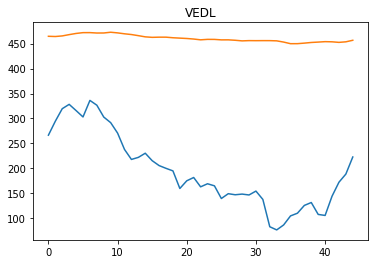

Results of sklearn.metrics:
MAE: 460.49249499012575
RMSE: 460.5422702463642
Epoch 1/20
2/2 [==============================] - 8s 3s/step - loss: 0.3350 - val_loss: 0.0488
Epoch 2/20
2/2 [==============================] - 0s 67ms/step - loss: 0.3276 - val_loss: 0.0464
Epoch 3/20
2/2 [==============================] - 0s 70ms/step - loss: 0.3202 - val_loss: 0.0439
Epoch 4/20
2/2 [==============================] - 0s 93ms/step - loss: 0.3126 - val_loss: 0.0415
Epoch 5/20
2/2 [==============================] - 0s 89ms/step - loss: 0.3048 - val_loss: 0.0390
Epoch 6/20
2/2 [==============================] - 0s 55ms/step - loss: 0.2965 - val_loss: 0.0366
Epoch 7/20
2/2 [==============================] - 0s 54ms/step - loss: 0.2879 - val_loss: 0.0341
Epoch 8/20
2/2 [==============================] - 0s 55ms/step - loss: 0.2791 - val_loss: 0.0315
Epoch 9/20
2/2 [==============================] - 0s 68ms/step - loss: 0.2696 - val_loss: 0.0290
Epoch 10/20
2/2 [==============================] - 0s

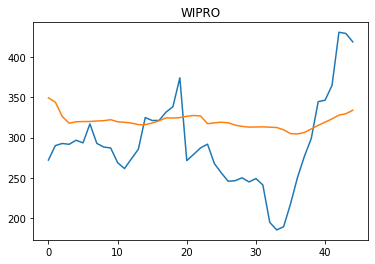

Results of sklearn.metrics:
MAE: 319.7086975582185
RMSE: 319.82177646231315
Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1552 - val_loss: 0.3940
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1509 - val_loss: 0.3859
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1465 - val_loss: 0.3777
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1423 - val_loss: 0.3693
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1378 - val_loss: 0.3607
Epoch 6/20
2/2 [==============================] - 0s 52ms/step - loss: 0.1334 - val_loss: 0.3517
Epoch 7/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1288 - val_loss: 0.3424
Epoch 8/20
2/2 [==============================] - 0s 56ms/step - loss: 0.1241 - val_loss: 0.3325
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1191 - val_loss: 0.3220
Epoch 10/20
2/2 [==============================] - 0s

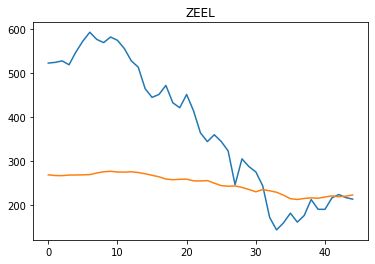

Results of sklearn.metrics:
MAE: 247.55868218291155
RMSE: 248.48357597650713


In [88]:
for i in companies:
    scaler=MinMaxScaler(feature_range=(0,1))
    df1=scaler.fit_transform(np.array(monthly_resampled_data[i]).reshape(-1,1))

    train_data ,test_data = df1[0:train_size] ,df1[train_size:(train_size+test_size)]
    
    step = 3
    X_train, y_train = convertTomatrix(train_data, step)
    X_test, ytest = convertTomatrix(test_data, step)

    model=Sequential()
    model.add(LSTM(50,return_sequences=True,input_shape=(3,1)))
    model.add(LSTM(25,return_sequences=True))
    model.add(LSTM(10,return_sequences=True))
    model.add(LSTM(5))
    model.add(Dense(1))

    model.compile(loss='mean_squared_error',optimizer='adam')   
    model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=20,batch_size=64,verbose=1)
    train_predict=model.predict(X_train)
    test_predict=model.predict(X_test)

    train_predict=scaler.inverse_transform(train_predict)
    test_predict=scaler.inverse_transform(test_predict)
    mae = metrics.mean_absolute_error(ytest,test_predict)
    mse = metrics.mean_squared_error(ytest,test_predict)
    m4.append(mse)
    rmse = np.sqrt(mse)  

    plt.title(i)
    plt.plot(scaler.inverse_transform(ytest.reshape(len(test_predict),1))) 
    plt.plot(test_predict)
    plt.show()

    print("Results of sklearn.metrics:")
    print("MAE:",mae)
    print("RMSE:", rmse)

In [89]:
companies

Index(['ADANIPORTS', 'ASIANPAINT', 'AXISBANK', 'BAJAJ-AUTO', 'BAJAJFINSV',
       'BAJFINANCE', 'BHARTIARTL', 'BPCL', 'BRITANNIA', 'CIPLA', 'COALINDIA',
       'DRREDDY', 'EICHERMOT', 'GAIL', 'GRASIM', 'HCLTECH', 'HDFC', 'HDFCBANK',
       'HEROMOTOCO', 'HINDALCO', 'HINDUNILVR', 'ICICIBANK', 'INDUSINDBK',
       'INFY', 'IOC', 'ITC', 'JSWSTEEL', 'KOTAKBANK', 'LT', 'M&M', 'MARUTI',
       'NESTLEIND', 'NTPC', 'ONGC', 'POWERGRID', 'RELIANCE', 'SBIN',
       'SHREECEM', 'SUNPHARMA', 'TATAMOTORS', 'TATASTEEL', 'TCS', 'TECHM',
       'TITAN', 'ULTRACEMCO', 'UNIPHOS', 'UPL', 'VEDL', 'WIPRO', 'ZEEL'],
      dtype='object')

In [90]:
companies = list(companies)

**Comparing the models**

In [91]:
Performance_metrics=pd.DataFrame(
                                 {"ARIMA": m1,
                                  "Fb Prophet": m2,
                                  "RNN": m3,
                                  "LSTM": m4
                                  },
                                 index=companies)

In [92]:
Performance_metrics

,ARIMA,Fb Prophet,RNN,LSTM
ADANIPORTS,2.354170e+04,1.544365e+04,1.530052e+05,1.082427e+05
ASIANPAINT,2.131763e+05,1.085303e+06,2.917174e+06,2.942883e+06
AXISBANK,5.065752e+04,8.548507e+04,3.747409e+05,5.519980e+05
BAJAJ-AUTO,2.629363e+05,9.463513e+04,7.338146e+06,5.353725e+06
BAJAJFINSV,7.616762e+06,7.842195e+05,3.705593e+07,1.592404e+06
BAJFINANCE,1.190809e+06,2.002965e+06,1.403934e+07,6.436267e+06
BHARTIARTL,5.843354e+03,5.975201e+03,1.844197e+05,1.839324e+05
BPCL,9.691750e+03,2.119295e+04,2.149849e+05,2.098181e+05
BRITANNIA,2.286627e+05,8.422358e+05,1.179589e+07,4.272902e+06
CIPLA,6.914501e+04,6.769748e+03,3.354262e+05,2.230855e+05


**Effect of Russia-Ukrainian War**

War start date is 24/02/2014 Still not stopped completely yet

Still there are minor downline seen in the prices.


<ipython-input-93-201879b610e3>:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



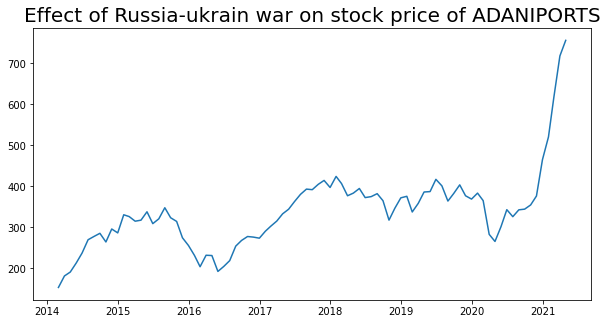

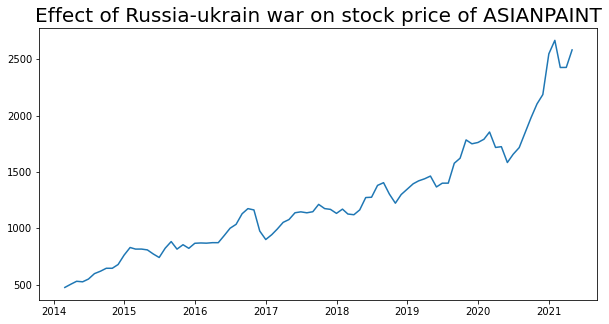

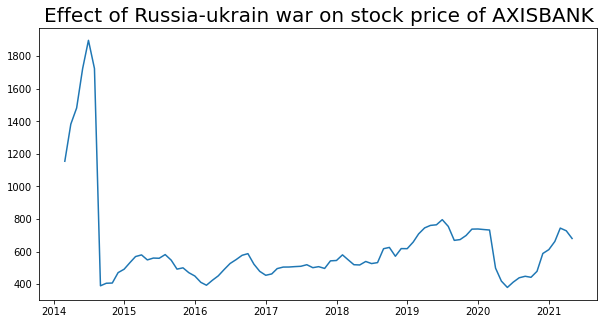

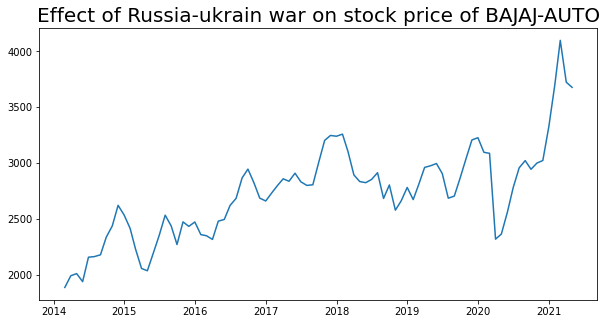

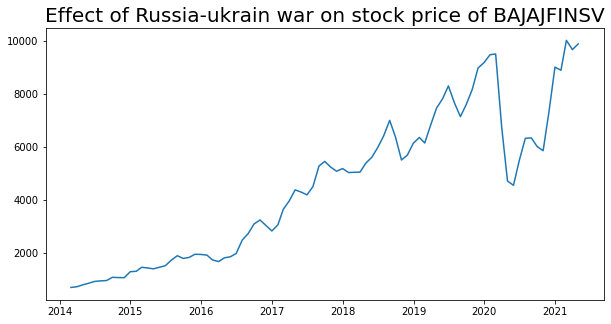

...

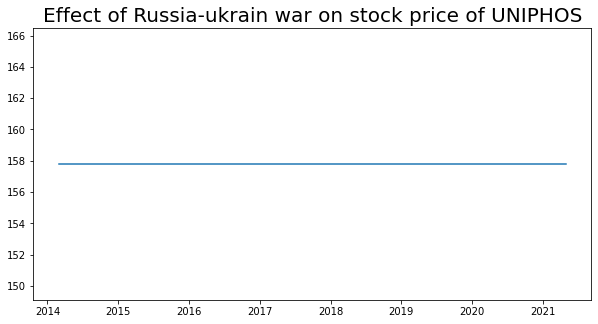

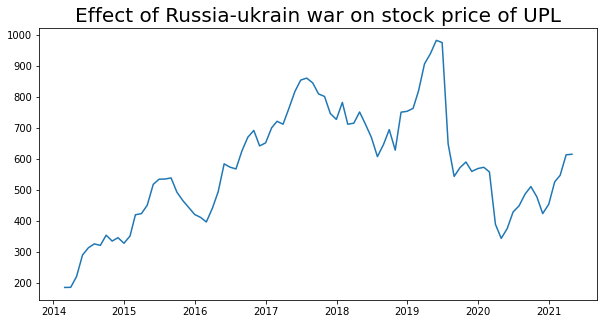

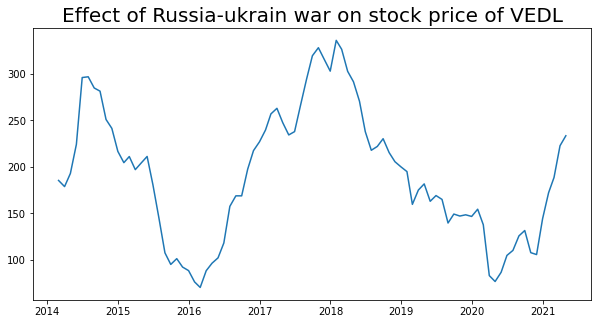

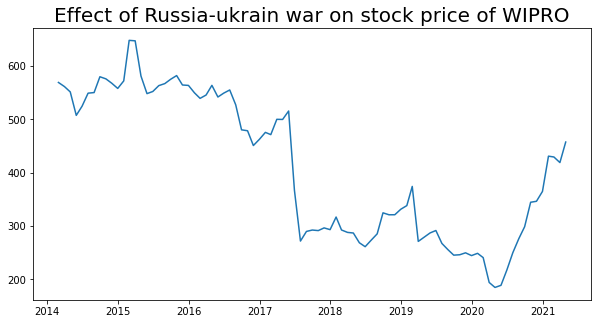

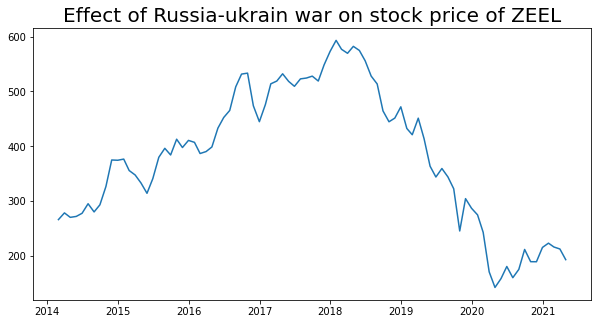

In [93]:
for i in companies:
  # (figsize=(17,8))
  plt.figure(figsize=(10, 5))
  inwar=monthly_resampled_data.loc['2014-02-24':]
  plt.title(f"Effect of Russia-ukrain war on stock price of {i}",fontsize=20)
  plt.plot(inwar[i])
  